In [1]:
!git clone https://github.com/cdancette/deep-learning-polytech-tp6-7.git

Cloning into 'deep-learning-polytech-tp6-7'...
remote: Enumerating objects: 22, done.
remote: Counting objects: 100% (14/14), done.
remote: Compressing objects: 100% (12/12), done.
remote: Total 22 (delta 3), reused 7 (delta 1), pack-reused 8
Unpacking objects: 100% (22/22), done.


In [2]:
cd deep-learning-polytech-tp6-7

/content/deep-learning-polytech-tp6-7


In [3]:
import argparse
import os
import time

import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim
import torch.utils.data
import torchvision.transforms as transforms
import torchvision.datasets as datasets

from tme6 import *

PRINT_INTERVAL = 200
PATH="datasets"

## **MNIST**

In [4]:
class ConvNet(nn.Module):
    """
    This class defines the structure of the neural network
    """

    def __init__(self):
        super(ConvNet, self).__init__()
        # We first define the convolution and pooling layers as a features extractor
        self.features = nn.Sequential(
            nn.Conv2d(1, 6, (5, 5), stride=1, padding=2),
            nn.Tanh(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(6, 16, (5, 5), stride=1, padding=0),
            nn.Tanh(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
        )
        # We then define fully connected layers as a classifier
        self.classifier = nn.Sequential(
              nn.Linear(400, 120),
              nn.Tanh(),
              nn.Linear(120, 84),
              nn.Tanh(),
              nn.Linear(84, 10)
            # Reminder: The softmax is included in the loss, do not put it here
        )

    # Method called when we apply the network to an input batch
    def forward(self, input):
        bsize = input.size(0) # batch size
        output = self.features(input) # output of the conv layers
        output = output.view(bsize, -1) # we flatten the 2D feature maps into one 1D vector for each input
        output = self.classifier(output) # we compute the output of the fc layers
        return output



def get_dataset(batch_size, cuda=False):
    """
    This function loads the dataset and performs transformations on each
    image (listed in `transform = ...`).
    """
    train_dataset = datasets.MNIST(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.ToTensor()
        ]))
    val_dataset = datasets.MNIST(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.ToTensor()
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader



def epoch(data, model, criterion, optimizer=None, cuda=False):
    """
    Make a pass (called epoch in English) on the data `data` with the
     model `model`. Evaluates `criterion` as loss.
     If `optimizer` is given, perform a training epoch using
     the given optimizer, otherwise, perform an evaluation epoch (no backward)
     of the model.
    """

    # indicates whether the model is in eval or train mode (some layers behave differently in train and eval)
    model.eval() if optimizer is None else model.train()

    # objects to store metric averages
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # we iterate on the batches
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # only with GPU, and not with CPU
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward if we are training
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # compute metrics
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # update
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # print info
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Print summary
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss


def main(batch_size=128, lr=0.1, epochs=5, cuda=False):

    # ex :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}
    
    # define model, loss, optim
    model = ConvNet()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)

    if cuda: # only with GPU, and not with CPU
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # Get the data
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # We iterate on the epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Train phase
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Test phase
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)


  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting datasets/MNIST/raw/train-images-idx3-ubyte.gz to datasets/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting datasets/MNIST/raw/train-labels-idx1-ubyte.gz to datasets/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting datasets/MNIST/raw/t10k-images-idx3-ubyte.gz to datasets/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting datasets/MNIST/raw/t10k-labels-idx1-ubyte.gz to datasets/MNIST/raw

=== EPOCH 1 =====

[TRAIN Batch 000/469]	Time 0.574s (0.574s)	Loss 2.2938 (2.2938)	Prec@1   9.4 (  9.4)	Prec@5  54.7 ( 54.7)


<Figure size 432x288 with 0 Axes>

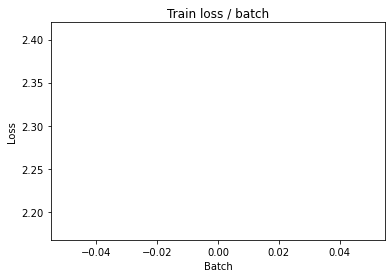

[TRAIN Batch 200/469]	Time 0.029s (0.021s)	Loss 0.2801 (1.1817)	Prec@1  92.2 ( 67.6)	Prec@5 100.0 ( 91.1)


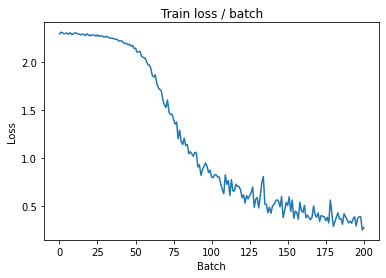

[TRAIN Batch 400/469]	Time 0.023s (0.020s)	Loss 0.1647 (0.7188)	Prec@1  96.9 ( 80.2)	Prec@5 100.0 ( 95.4)


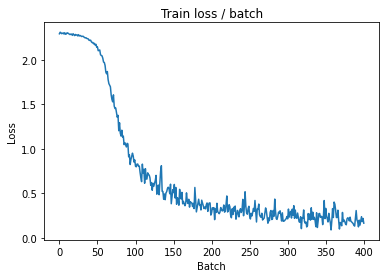


===============> Total time 9s	Avg loss 0.6405	Avg Prec@1 82.35 %	Avg Prec@5 96.03 %

[EVAL Batch 000/079]	Time 0.146s (0.146s)	Loss 0.0769 (0.0769)	Prec@1  97.7 ( 97.7)	Prec@5 100.0 (100.0)

===============> Total time 1s	Avg loss 0.1425	Avg Prec@1 95.89 %	Avg Prec@5 99.95 %



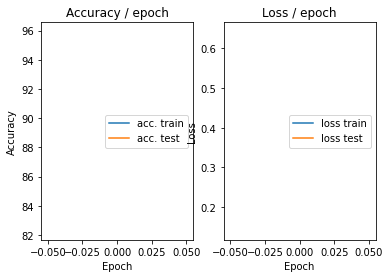

=== EPOCH 2 =====

[TRAIN Batch 000/469]	Time 0.156s (0.156s)	Loss 0.1629 (0.1629)	Prec@1  94.5 ( 94.5)	Prec@5  99.2 ( 99.2)


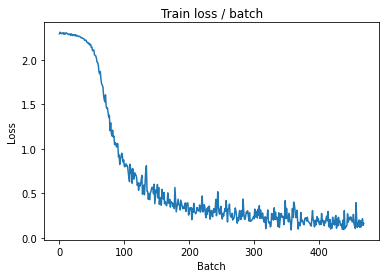

[TRAIN Batch 200/469]	Time 0.005s (0.019s)	Loss 0.0859 (0.1398)	Prec@1  97.7 ( 96.0)	Prec@5 100.0 ( 99.9)


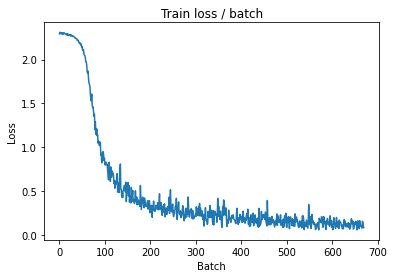

[TRAIN Batch 400/469]	Time 0.007s (0.019s)	Loss 0.1555 (0.1239)	Prec@1  95.3 ( 96.4)	Prec@5 100.0 ( 99.9)


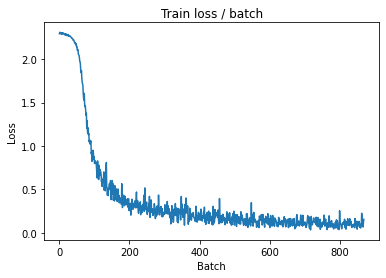


===============> Total time 9s	Avg loss 0.1223	Avg Prec@1 96.41 %	Avg Prec@5 99.90 %

[EVAL Batch 000/079]	Time 0.127s (0.127s)	Loss 0.0362 (0.0362)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)

===============> Total time 1s	Avg loss 0.0892	Avg Prec@1 97.23 %	Avg Prec@5 99.99 %



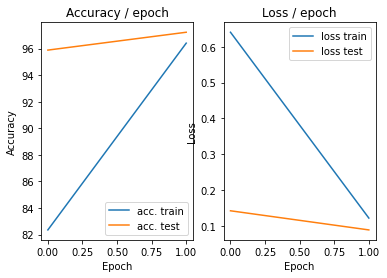

=== EPOCH 3 =====

[TRAIN Batch 000/469]	Time 0.133s (0.133s)	Loss 0.0584 (0.0584)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)


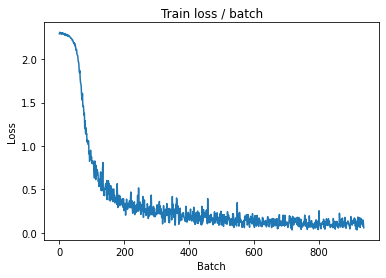

[TRAIN Batch 200/469]	Time 0.026s (0.019s)	Loss 0.0663 (0.0861)	Prec@1  97.7 ( 97.4)	Prec@5 100.0 ( 99.9)


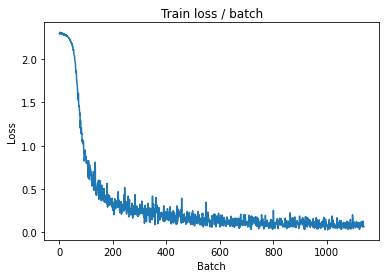

[TRAIN Batch 400/469]	Time 0.026s (0.019s)	Loss 0.0495 (0.0837)	Prec@1  97.7 ( 97.5)	Prec@5 100.0 ( 99.9)


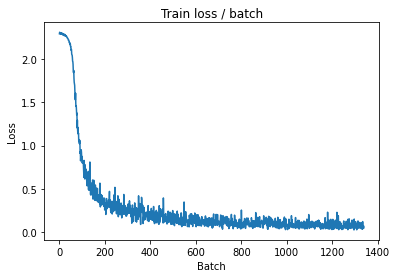


===============> Total time 8s	Avg loss 0.0820	Avg Prec@1 97.51 %	Avg Prec@5 99.95 %

[EVAL Batch 000/079]	Time 0.134s (0.134s)	Loss 0.0201 (0.0201)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)

===============> Total time 1s	Avg loss 0.0676	Avg Prec@1 97.75 %	Avg Prec@5 100.00 %



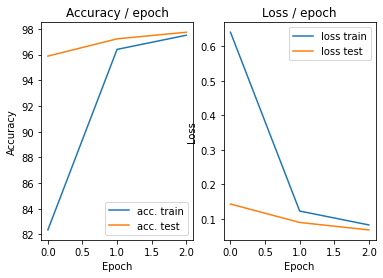

=== EPOCH 4 =====

[TRAIN Batch 000/469]	Time 0.136s (0.136s)	Loss 0.0326 (0.0326)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


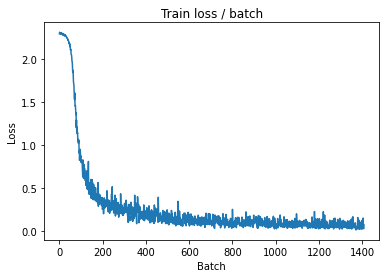

[TRAIN Batch 200/469]	Time 0.005s (0.020s)	Loss 0.1022 (0.0681)	Prec@1  97.7 ( 97.9)	Prec@5 100.0 (100.0)


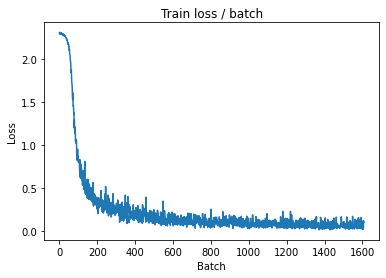

[TRAIN Batch 400/469]	Time 0.005s (0.020s)	Loss 0.1197 (0.0661)	Prec@1  98.4 ( 98.0)	Prec@5  99.2 (100.0)


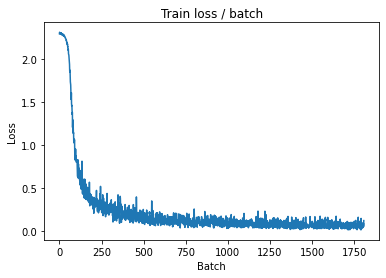


===============> Total time 9s	Avg loss 0.0648	Avg Prec@1 98.03 %	Avg Prec@5 99.96 %

[EVAL Batch 000/079]	Time 0.124s (0.124s)	Loss 0.0129 (0.0129)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)

===============> Total time 1s	Avg loss 0.0511	Avg Prec@1 98.47 %	Avg Prec@5 100.00 %



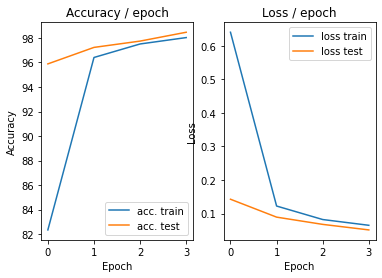

=== EPOCH 5 =====

[TRAIN Batch 000/469]	Time 0.129s (0.129s)	Loss 0.0457 (0.0457)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)


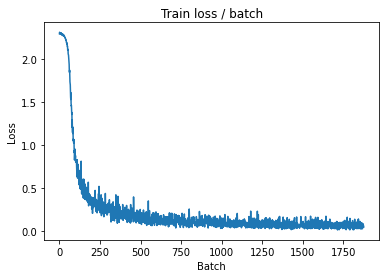

[TRAIN Batch 200/469]	Time 0.033s (0.020s)	Loss 0.1199 (0.0550)	Prec@1  96.1 ( 98.3)	Prec@5 100.0 (100.0)


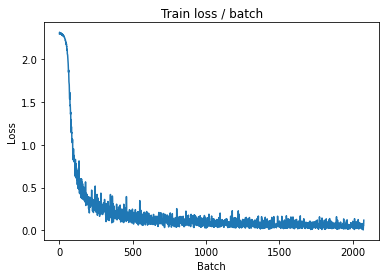

[TRAIN Batch 400/469]	Time 0.005s (0.020s)	Loss 0.0683 (0.0545)	Prec@1  96.9 ( 98.4)	Prec@5 100.0 (100.0)


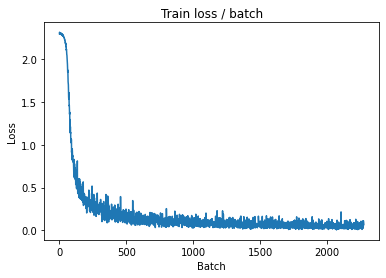


===============> Total time 9s	Avg loss 0.0541	Avg Prec@1 98.40 %	Avg Prec@5 99.98 %

[EVAL Batch 000/079]	Time 0.130s (0.130s)	Loss 0.0201 (0.0201)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)

===============> Total time 1s	Avg loss 0.0461	Avg Prec@1 98.42 %	Avg Prec@5 100.00 %



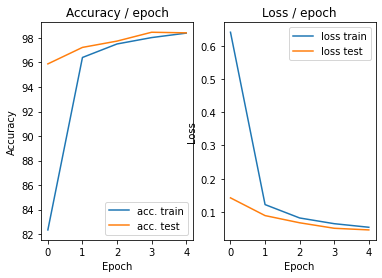

In [ ]:
main(128, 0.1, cuda=True)

## **CIFAR-10**

In [5]:
#Classe ConvNet avec l'architecture donnée

class ConvNet2(nn.Module):
    """
    This class defines the structure of the neural network
    """

    def __init__(self):
        super(ConvNet2, self).__init__()
        # We first define the convolution and pooling layers as a features extractor
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(32, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(64, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0)
        )
        # We then define fully connected layers as a classifier
        self.classifier = nn.Sequential(
            nn.Linear(1024, 1000), #64 * 4 * 4 (4 pcq 32 divisé par 8)
            nn.ReLU(),
            nn.Linear(1000, 10),
            #nn.Softmax()
            # Reminder: The softmax is included in the loss, do not put it here
        )

    # Method called when we apply the network to an input batch
    def forward(self, input):
        bsize = input.size(0) # batch size
        output = self.features(input) # output of the conv layers
        output = output.view(bsize, -1) # we flatten the 2D feature maps into one 1D vector for each input
        output = self.classifier(output) # we compute the output of the fc layers
        return output

In [6]:
#Récupérer le dataset 
def get_dataset(batch_size, cuda=False):
    """
    This function loads the dataset and performs transformations on each
    image (listed in `transform = ...`).
    """
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.ToTensor()
        ]))
    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.ToTensor()
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader



def epoch(data, model, criterion, optimizer=None, cuda=False):
    """
    Make a pass (called epoch in English) on the data `data` with the
     model `model`. Evaluates `criterion` as loss.
     If `optimizer` is given, perform a training epoch using
     the given optimizer, otherwise, perform an evaluation epoch (no backward)
     of the model.
    """

    # indicates whether the model is in eval or train mode (some layers behave differently in train and eval)
    model.eval() if optimizer is None else model.train()

    # objects to store metric averages
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # we iterate on the batches
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # only with GPU, and not with CPU
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward if we are training
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # compute metrics
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # update
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # print info
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Print summary
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss


def main(batch_size=128, lr=0.1, epochs=5, cuda=False):

    # ex :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}
    
    # define model, loss, optim
    model = ConvNet2()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)

    if cuda: # only with GPU, and not with CPU
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # Get the data
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # We iterate on the epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Train phase
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Test phase
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)


Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.436s (0.436s)	Loss 2.3006 (2.3006)	Prec@1  12.5 ( 12.5)	Prec@5  50.8 ( 50.8)


<Figure size 432x288 with 0 Axes>

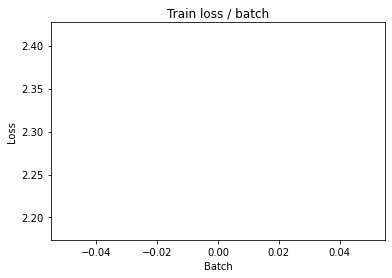

[TRAIN Batch 200/391]	Time 0.021s (0.028s)	Loss 1.9912 (2.2310)	Prec@1  26.6 ( 16.5)	Prec@5  76.6 ( 63.5)


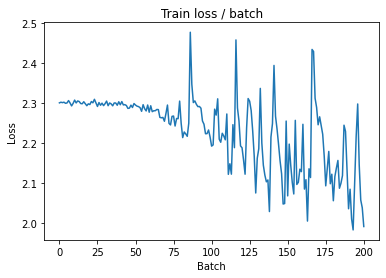


===============> Total time 10s	Avg loss 2.1021	Avg Prec@1 22.72 %	Avg Prec@5 71.50 %

[EVAL Batch 000/079]	Time 0.135s (0.135s)	Loss 1.9160 (1.9160)	Prec@1  28.9 ( 28.9)	Prec@5  88.3 ( 88.3)

===============> Total time 1s	Avg loss 1.8912	Avg Prec@1 36.50 %	Avg Prec@5 86.96 %



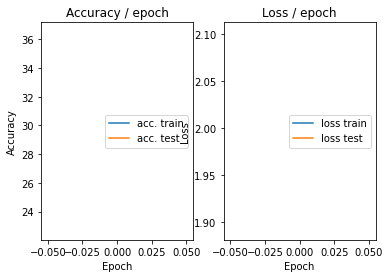

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.159s (0.159s)	Loss 1.8970 (1.8970)	Prec@1  35.2 ( 35.2)	Prec@5  87.5 ( 87.5)


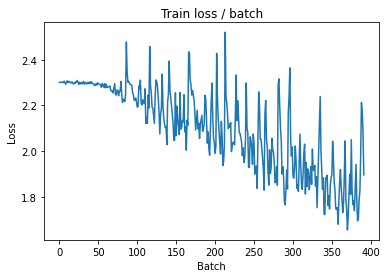

[TRAIN Batch 200/391]	Time 0.016s (0.027s)	Loss 1.7265 (1.7192)	Prec@1  38.3 ( 38.1)	Prec@5  85.2 ( 87.0)


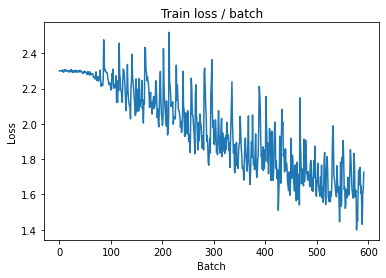


===============> Total time 10s	Avg loss 1.6367	Avg Prec@1 41.26 %	Avg Prec@5 88.65 %

[EVAL Batch 000/079]	Time 0.156s (0.156s)	Loss 1.4712 (1.4712)	Prec@1  50.8 ( 50.8)	Prec@5  91.4 ( 91.4)

===============> Total time 1s	Avg loss 1.5647	Avg Prec@1 44.58 %	Avg Prec@5 90.45 %



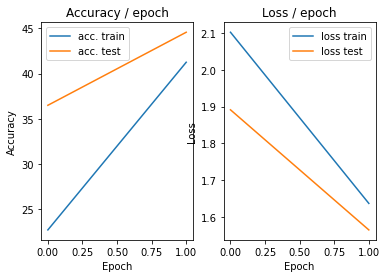

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.158s (0.158s)	Loss 1.5259 (1.5259)	Prec@1  41.4 ( 41.4)	Prec@5  89.8 ( 89.8)


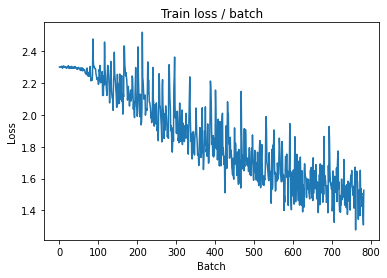

[TRAIN Batch 200/391]	Time 0.024s (0.028s)	Loss 1.3113 (1.4376)	Prec@1  51.6 ( 48.1)	Prec@5  96.1 ( 92.5)


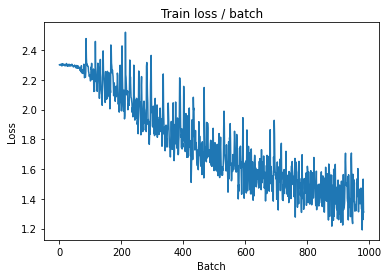


===============> Total time 10s	Avg loss 1.3925	Avg Prec@1 49.96 %	Avg Prec@5 93.03 %

[EVAL Batch 000/079]	Time 0.163s (0.163s)	Loss 1.4090 (1.4090)	Prec@1  51.6 ( 51.6)	Prec@5  90.6 ( 90.6)

===============> Total time 1s	Avg loss 1.4720	Avg Prec@1 48.04 %	Avg Prec@5 90.87 %



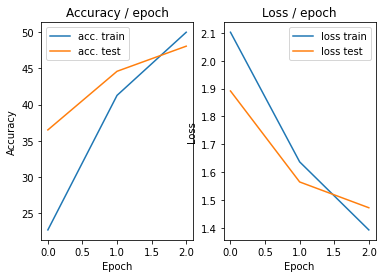

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.165s (0.165s)	Loss 1.4429 (1.4429)	Prec@1  50.8 ( 50.8)	Prec@5  91.4 ( 91.4)


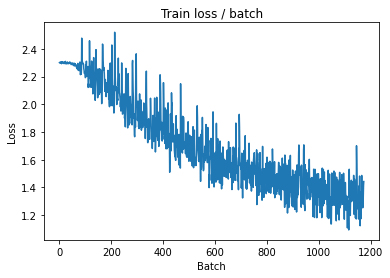

[TRAIN Batch 200/391]	Time 0.024s (0.027s)	Loss 1.1036 (1.2774)	Prec@1  60.9 ( 54.4)	Prec@5  94.5 ( 94.4)


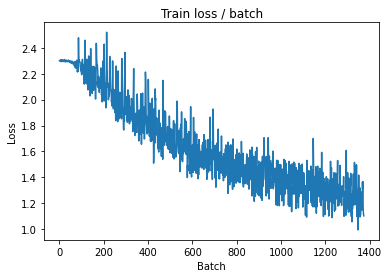


===============> Total time 10s	Avg loss 1.2457	Avg Prec@1 55.52 %	Avg Prec@5 94.72 %

[EVAL Batch 000/079]	Time 0.145s (0.145s)	Loss 1.0722 (1.0722)	Prec@1  67.2 ( 67.2)	Prec@5  97.7 ( 97.7)

===============> Total time 1s	Avg loss 1.1751	Avg Prec@1 58.67 %	Avg Prec@5 94.85 %



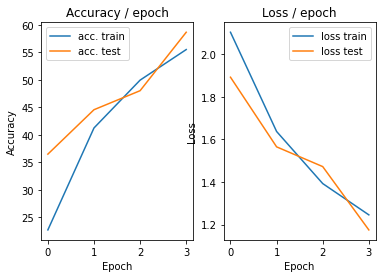

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.176s (0.176s)	Loss 1.1154 (1.1154)	Prec@1  57.8 ( 57.8)	Prec@5  93.0 ( 93.0)


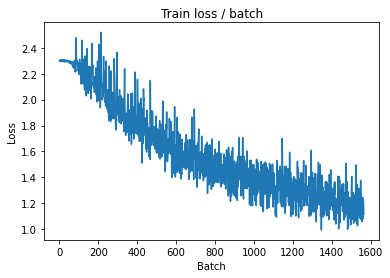

[TRAIN Batch 200/391]	Time 0.014s (0.027s)	Loss 1.1026 (1.1279)	Prec@1  61.7 ( 59.8)	Prec@5  96.9 ( 95.9)


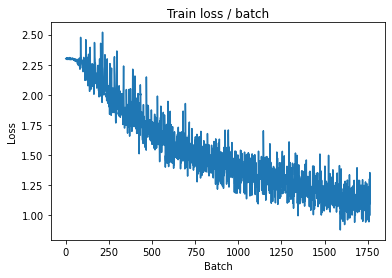


===============> Total time 10s	Avg loss 1.1104	Avg Prec@1 60.67 %	Avg Prec@5 95.99 %

[EVAL Batch 000/079]	Time 0.162s (0.162s)	Loss 1.0171 (1.0171)	Prec@1  67.2 ( 67.2)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 1.0999	Avg Prec@1 61.36 %	Avg Prec@5 95.97 %



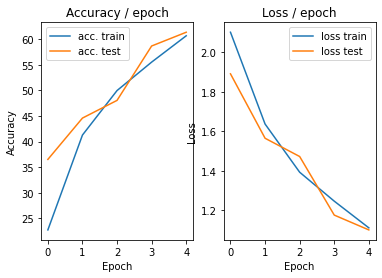

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.176s (0.176s)	Loss 0.9586 (0.9586)	Prec@1  60.2 ( 60.2)	Prec@5  97.7 ( 97.7)


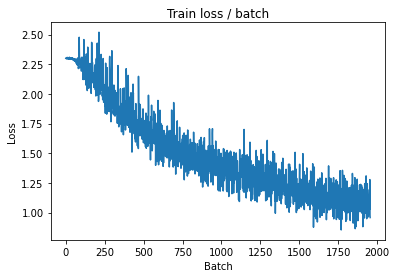

[TRAIN Batch 200/391]	Time 0.045s (0.027s)	Loss 0.9670 (1.0113)	Prec@1  64.8 ( 64.6)	Prec@5  97.7 ( 96.8)


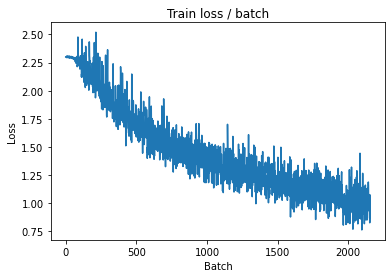


===============> Total time 10s	Avg loss 0.9954	Avg Prec@1 65.07 %	Avg Prec@5 96.82 %

[EVAL Batch 000/079]	Time 0.157s (0.157s)	Loss 1.0726 (1.0726)	Prec@1  62.5 ( 62.5)	Prec@5  96.9 ( 96.9)

===============> Total time 1s	Avg loss 1.1002	Avg Prec@1 61.15 %	Avg Prec@5 95.74 %



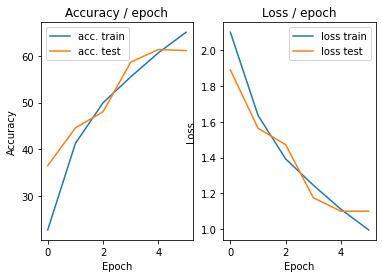

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.159s (0.159s)	Loss 0.8800 (0.8800)	Prec@1  72.7 ( 72.7)	Prec@5  96.9 ( 96.9)


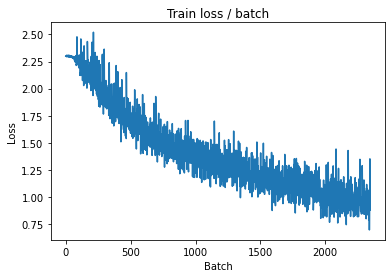

[TRAIN Batch 200/391]	Time 0.016s (0.028s)	Loss 0.9474 (0.8939)	Prec@1  70.3 ( 68.7)	Prec@5  97.7 ( 97.6)


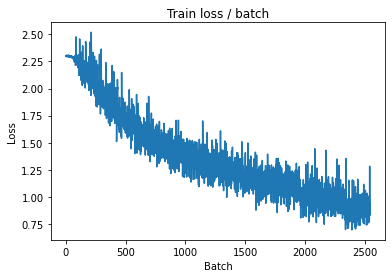


===============> Total time 10s	Avg loss 0.8904	Avg Prec@1 68.82 %	Avg Prec@5 97.59 %

[EVAL Batch 000/079]	Time 0.154s (0.154s)	Loss 1.0652 (1.0652)	Prec@1  64.1 ( 64.1)	Prec@5  96.9 ( 96.9)

===============> Total time 1s	Avg loss 1.0303	Avg Prec@1 64.17 %	Avg Prec@5 96.31 %



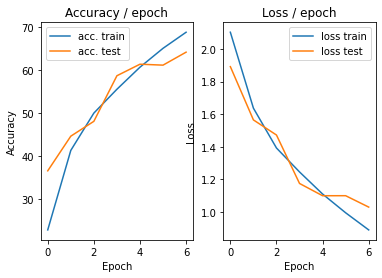

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.161s (0.161s)	Loss 0.7923 (0.7923)	Prec@1  74.2 ( 74.2)	Prec@5  98.4 ( 98.4)


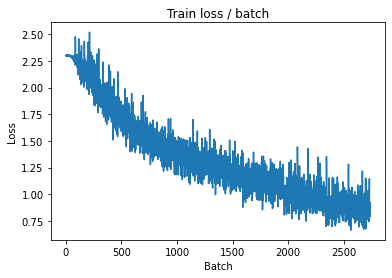

[TRAIN Batch 200/391]	Time 0.042s (0.027s)	Loss 0.6957 (0.7869)	Prec@1  71.9 ( 72.4)	Prec@5  99.2 ( 98.2)


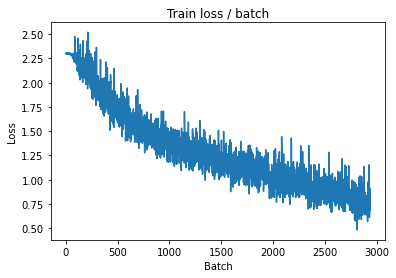


===============> Total time 10s	Avg loss 0.7885	Avg Prec@1 72.42 %	Avg Prec@5 98.21 %

[EVAL Batch 000/079]	Time 0.146s (0.146s)	Loss 0.9232 (0.9232)	Prec@1  69.5 ( 69.5)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 0.9209	Avg Prec@1 67.40 %	Avg Prec@5 97.19 %



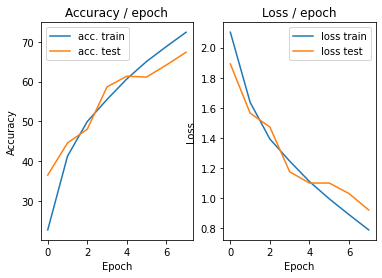

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.163s (0.163s)	Loss 0.6312 (0.6312)	Prec@1  79.7 ( 79.7)	Prec@5  98.4 ( 98.4)


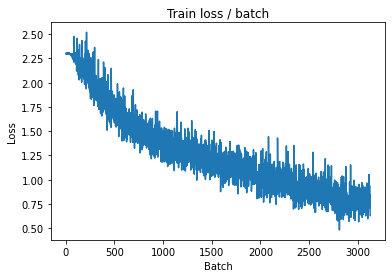

[TRAIN Batch 200/391]	Time 0.035s (0.027s)	Loss 0.6822 (0.6815)	Prec@1  74.2 ( 76.5)	Prec@5  98.4 ( 98.7)


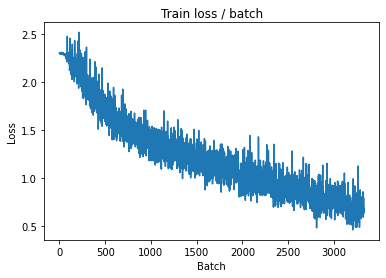


===============> Total time 10s	Avg loss 0.6901	Avg Prec@1 75.97 %	Avg Prec@5 98.66 %

[EVAL Batch 000/079]	Time 0.157s (0.157s)	Loss 1.0628 (1.0628)	Prec@1  64.1 ( 64.1)	Prec@5  99.2 ( 99.2)

===============> Total time 1s	Avg loss 1.0713	Avg Prec@1 64.68 %	Avg Prec@5 96.90 %



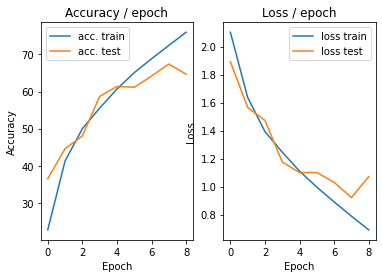

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.166s (0.166s)	Loss 0.6653 (0.6653)	Prec@1  75.0 ( 75.0)	Prec@5 100.0 (100.0)


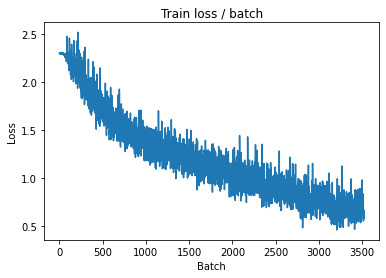

[TRAIN Batch 200/391]	Time 0.022s (0.027s)	Loss 0.6280 (0.5855)	Prec@1  79.7 ( 79.4)	Prec@5  99.2 ( 99.1)


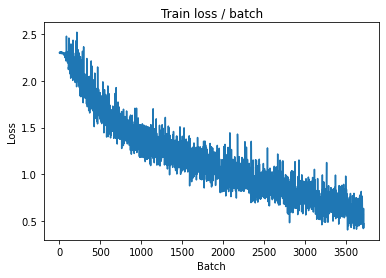


===============> Total time 10s	Avg loss 0.5978	Avg Prec@1 79.13 %	Avg Prec@5 99.07 %

[EVAL Batch 000/079]	Time 0.151s (0.151s)	Loss 0.9861 (0.9861)	Prec@1  71.1 ( 71.1)	Prec@5  97.7 ( 97.7)

===============> Total time 1s	Avg loss 0.9672	Avg Prec@1 68.20 %	Avg Prec@5 96.99 %



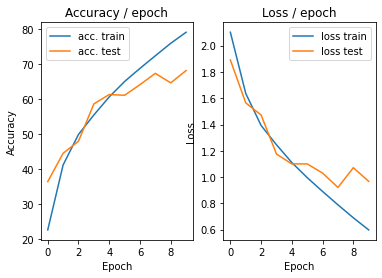

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.153s (0.153s)	Loss 0.6431 (0.6431)	Prec@1  78.9 ( 78.9)	Prec@5  99.2 ( 99.2)


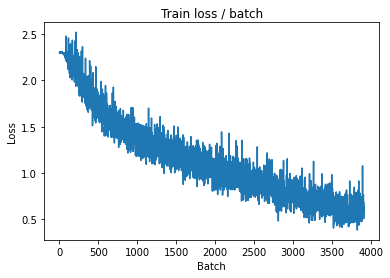

[TRAIN Batch 200/391]	Time 0.032s (0.029s)	Loss 0.3257 (0.4862)	Prec@1  90.6 ( 83.1)	Prec@5 100.0 ( 99.4)


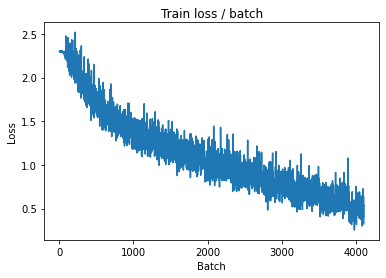


===============> Total time 10s	Avg loss 0.5002	Avg Prec@1 82.53 %	Avg Prec@5 99.42 %

[EVAL Batch 000/079]	Time 0.148s (0.148s)	Loss 1.0618 (1.0618)	Prec@1  71.1 ( 71.1)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 1.0024	Avg Prec@1 68.20 %	Avg Prec@5 96.93 %



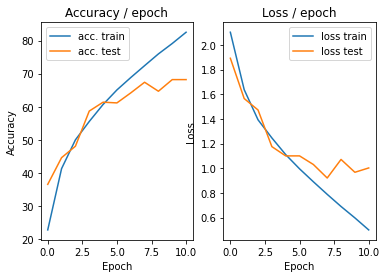

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.158s (0.158s)	Loss 0.4129 (0.4129)	Prec@1  88.3 ( 88.3)	Prec@5  99.2 ( 99.2)


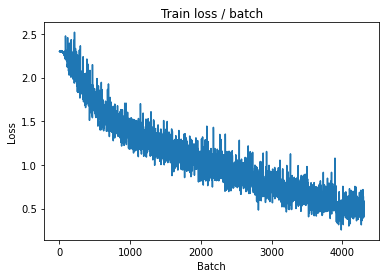

[TRAIN Batch 200/391]	Time 0.042s (0.027s)	Loss 0.4806 (0.3844)	Prec@1  82.8 ( 86.8)	Prec@5  99.2 ( 99.7)


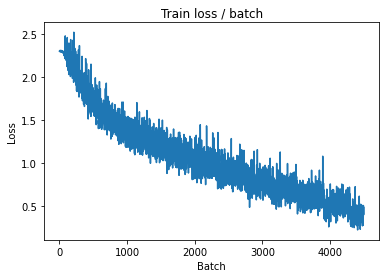


===============> Total time 10s	Avg loss 0.4002	Avg Prec@1 86.08 %	Avg Prec@5 99.64 %

[EVAL Batch 000/079]	Time 0.142s (0.142s)	Loss 1.2033 (1.2033)	Prec@1  70.3 ( 70.3)	Prec@5  97.7 ( 97.7)

===============> Total time 1s	Avg loss 1.0855	Avg Prec@1 67.94 %	Avg Prec@5 97.01 %



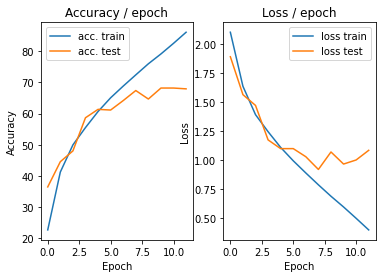

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.175s (0.175s)	Loss 0.3450 (0.3450)	Prec@1  85.9 ( 85.9)	Prec@5 100.0 (100.0)


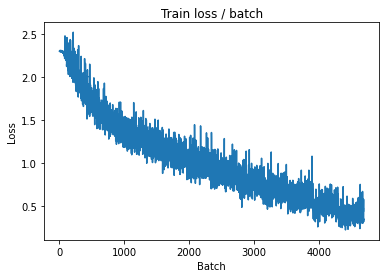

[TRAIN Batch 200/391]	Time 0.026s (0.027s)	Loss 0.2559 (0.2925)	Prec@1  89.8 ( 90.0)	Prec@5 100.0 ( 99.8)


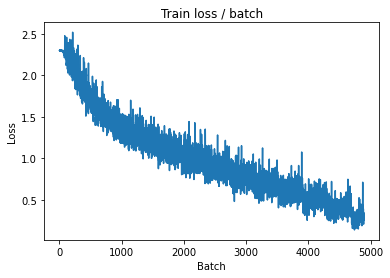


===============> Total time 10s	Avg loss 0.3181	Avg Prec@1 89.04 %	Avg Prec@5 99.80 %

[EVAL Batch 000/079]	Time 0.165s (0.165s)	Loss 1.3284 (1.3284)	Prec@1  60.2 ( 60.2)	Prec@5  95.3 ( 95.3)

===============> Total time 1s	Avg loss 1.2250	Avg Prec@1 66.48 %	Avg Prec@5 96.65 %



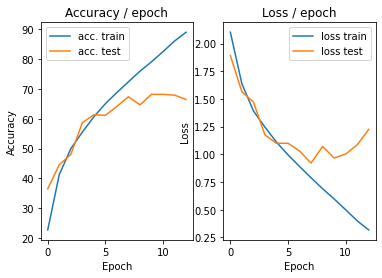

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.178s (0.178s)	Loss 0.4578 (0.4578)	Prec@1  86.7 ( 86.7)	Prec@5  99.2 ( 99.2)


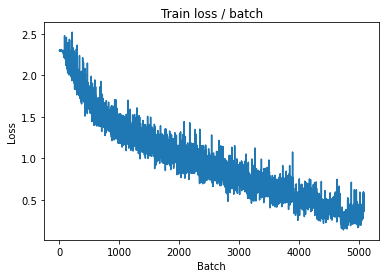

[TRAIN Batch 200/391]	Time 0.027s (0.027s)	Loss 0.1919 (0.2388)	Prec@1  94.5 ( 92.1)	Prec@5 100.0 ( 99.9)


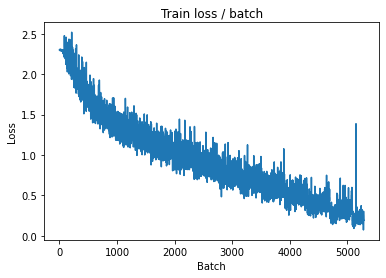


===============> Total time 10s	Avg loss 0.2571	Avg Prec@1 91.25 %	Avg Prec@5 99.87 %

[EVAL Batch 000/079]	Time 0.160s (0.160s)	Loss 1.1903 (1.1903)	Prec@1  70.3 ( 70.3)	Prec@5  96.1 ( 96.1)

===============> Total time 1s	Avg loss 1.1297	Avg Prec@1 69.54 %	Avg Prec@5 97.19 %



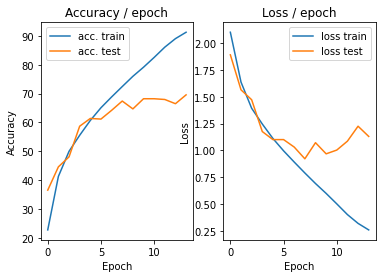

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.172s (0.172s)	Loss 0.1728 (0.1728)	Prec@1  93.8 ( 93.8)	Prec@5 100.0 (100.0)


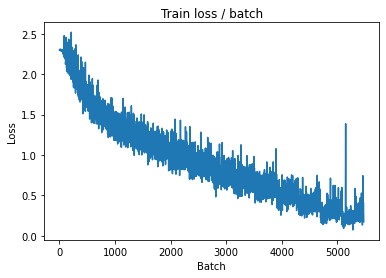

[TRAIN Batch 200/391]	Time 0.020s (0.028s)	Loss 0.1018 (0.1538)	Prec@1  97.7 ( 94.8)	Prec@5 100.0 (100.0)


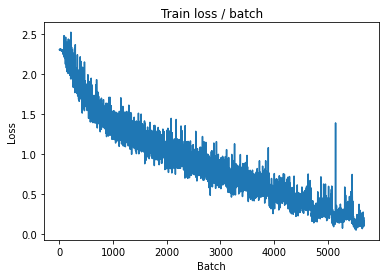


===============> Total time 10s	Avg loss 0.1771	Avg Prec@1 94.00 %	Avg Prec@5 99.96 %

[EVAL Batch 000/079]	Time 0.150s (0.150s)	Loss 1.3877 (1.3877)	Prec@1  66.4 ( 66.4)	Prec@5  97.7 ( 97.7)

===============> Total time 1s	Avg loss 1.3207	Avg Prec@1 69.08 %	Avg Prec@5 96.86 %



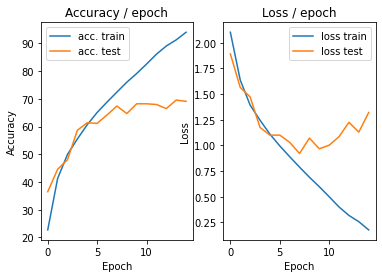

=== EPOCH 16 =====

[TRAIN Batch 000/391]	Time 0.175s (0.175s)	Loss 0.1009 (0.1009)	Prec@1  96.9 ( 96.9)	Prec@5 100.0 (100.0)


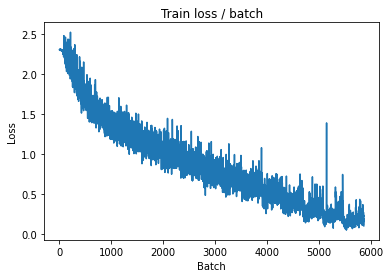

[TRAIN Batch 200/391]	Time 0.014s (0.027s)	Loss 0.2790 (0.1031)	Prec@1  89.8 ( 96.7)	Prec@5 100.0 (100.0)


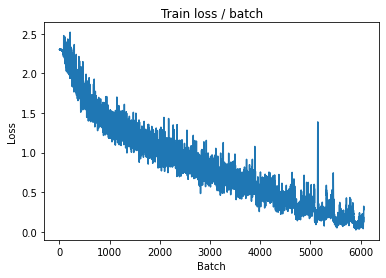


===============> Total time 10s	Avg loss 0.1249	Avg Prec@1 95.89 %	Avg Prec@5 99.98 %

[EVAL Batch 000/079]	Time 0.141s (0.141s)	Loss 1.5309 (1.5309)	Prec@1  71.9 ( 71.9)	Prec@5  95.3 ( 95.3)

===============> Total time 1s	Avg loss 1.4360	Avg Prec@1 69.08 %	Avg Prec@5 96.88 %



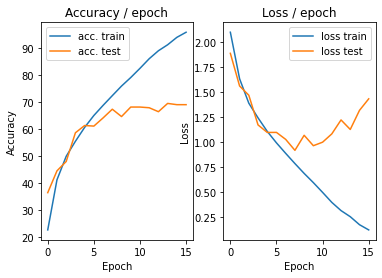

=== EPOCH 17 =====

[TRAIN Batch 000/391]	Time 0.177s (0.177s)	Loss 0.1847 (0.1847)	Prec@1  93.8 ( 93.8)	Prec@5 100.0 (100.0)


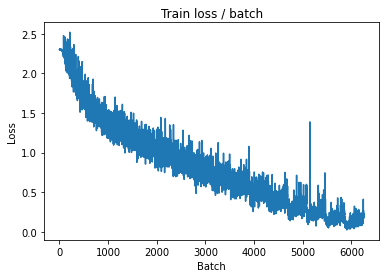

[TRAIN Batch 200/391]	Time 0.015s (0.027s)	Loss 0.1919 (0.0715)	Prec@1  93.8 ( 97.8)	Prec@5  99.2 (100.0)


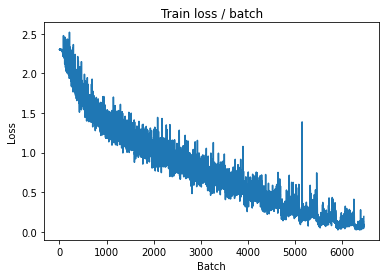


===============> Total time 10s	Avg loss 0.0903	Avg Prec@1 97.09 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.156s (0.156s)	Loss 1.7478 (1.7478)	Prec@1  65.6 ( 65.6)	Prec@5  96.9 ( 96.9)

===============> Total time 1s	Avg loss 1.6632	Avg Prec@1 67.94 %	Avg Prec@5 96.73 %



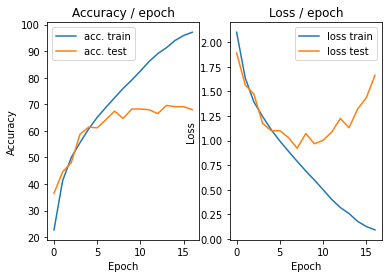

=== EPOCH 18 =====

[TRAIN Batch 000/391]	Time 0.167s (0.167s)	Loss 0.1115 (0.1115)	Prec@1  96.9 ( 96.9)	Prec@5 100.0 (100.0)


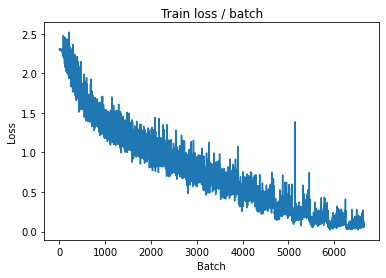

[TRAIN Batch 200/391]	Time 0.041s (0.027s)	Loss 0.0612 (0.0571)	Prec@1  98.4 ( 98.2)	Prec@5 100.0 (100.0)


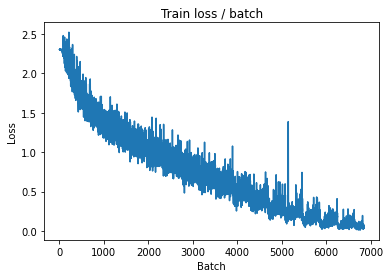


===============> Total time 10s	Avg loss 0.0775	Avg Prec@1 97.52 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.142s (0.142s)	Loss 1.7336 (1.7336)	Prec@1  68.0 ( 68.0)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 1.5634	Avg Prec@1 69.01 %	Avg Prec@5 97.16 %



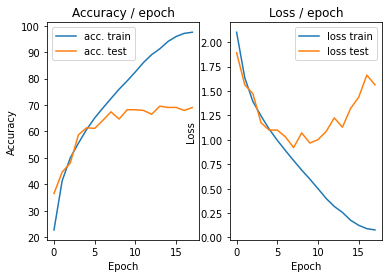

=== EPOCH 19 =====

[TRAIN Batch 000/391]	Time 0.190s (0.190s)	Loss 0.0690 (0.0690)	Prec@1  96.9 ( 96.9)	Prec@5 100.0 (100.0)


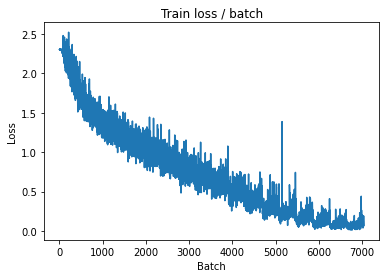

[TRAIN Batch 200/391]	Time 0.028s (0.028s)	Loss 0.0232 (0.0513)	Prec@1 100.0 ( 98.4)	Prec@5 100.0 (100.0)


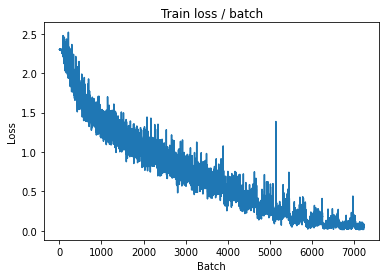


===============> Total time 10s	Avg loss 0.0619	Avg Prec@1 98.06 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.157s (0.157s)	Loss 2.0887 (2.0887)	Prec@1  65.6 ( 65.6)	Prec@5  96.1 ( 96.1)

===============> Total time 1s	Avg loss 1.9499	Avg Prec@1 67.29 %	Avg Prec@5 96.66 %



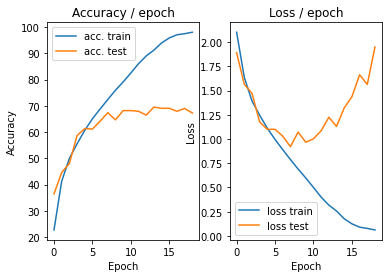

=== EPOCH 20 =====

[TRAIN Batch 000/391]	Time 0.199s (0.199s)	Loss 0.1309 (0.1309)	Prec@1  96.1 ( 96.1)	Prec@5 100.0 (100.0)


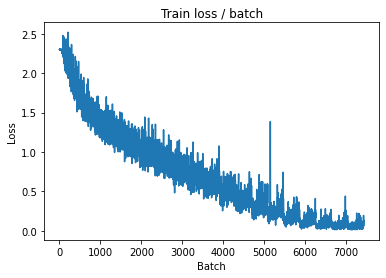

[TRAIN Batch 200/391]	Time 0.020s (0.027s)	Loss 0.0116 (0.0483)	Prec@1 100.0 ( 98.5)	Prec@5 100.0 (100.0)


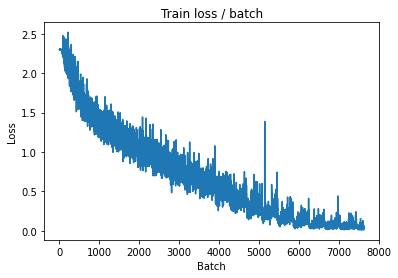


===============> Total time 10s	Avg loss 0.0642	Avg Prec@1 97.91 %	Avg Prec@5 99.99 %

[EVAL Batch 000/079]	Time 0.156s (0.156s)	Loss 1.7968 (1.7968)	Prec@1  66.4 ( 66.4)	Prec@5  96.1 ( 96.1)

===============> Total time 1s	Avg loss 1.7147	Avg Prec@1 69.37 %	Avg Prec@5 96.64 %



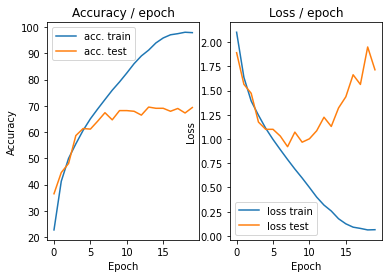

=== EPOCH 21 =====

[TRAIN Batch 000/391]	Time 0.189s (0.189s)	Loss 0.0334 (0.0334)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)


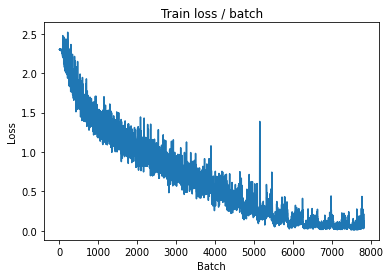

[TRAIN Batch 200/391]	Time 0.029s (0.028s)	Loss 0.0187 (0.0399)	Prec@1 100.0 ( 98.8)	Prec@5 100.0 (100.0)


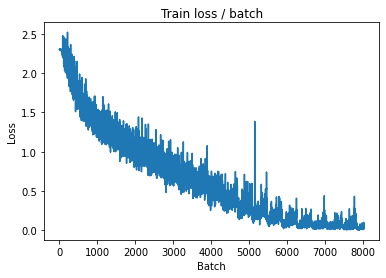


===============> Total time 10s	Avg loss 0.0533	Avg Prec@1 98.33 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.166s (0.166s)	Loss 2.0753 (2.0753)	Prec@1  66.4 ( 66.4)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 1.7677	Avg Prec@1 69.94 %	Avg Prec@5 97.27 %



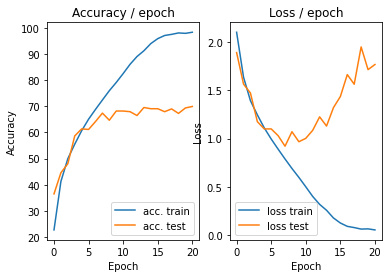

In [20]:
main(128, 0.1, epochs=21, cuda=True)

## **CIFAR-10 : Standardisation of examples**

In [7]:
#Récupérer le dataset et le normaliser
def get_dataset_normalized(batch_size, cuda=False):
    """
    This function loads the dataset and performs transformations on each
    image (listed in `transform = ...`).
    """
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize((0.491, 0.482, 0.447), (0.202, 0.199, 0.201))
        ]))
    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize((0.491, 0.482, 0.447), (0.202, 0.199, 0.201))
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader

def main(batch_size=128, lr=0.1, epochs=5, cuda=False):

  # ex :
  #   {"batch_size": 128, "epochs": 5, "lr": 0.1}

  # define model, loss, optim
  model = ConvNet2()
  criterion = nn.CrossEntropyLoss()
  optimizer = torch.optim.SGD(model.parameters(), lr)

  if cuda: # only with GPU, and not with CPU
      cudnn.benchmark = True
      model = model.cuda()
      criterion = criterion.cuda()

  # Get the data
  train, test = get_dataset_normalized(batch_size, cuda)

  # init plots
  plot = AccLossPlot()
  global loss_plot
  loss_plot = TrainLossPlot()

  # We iterate on the epochs
  for i in range(epochs):
      print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
      # Train phase
      top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
      # Test phase
      top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
      # plot
      plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)


Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.191s (0.191s)	Loss 2.3005 (2.3005)	Prec@1   7.8 (  7.8)	Prec@5  58.6 ( 58.6)


<Figure size 432x288 with 0 Axes>

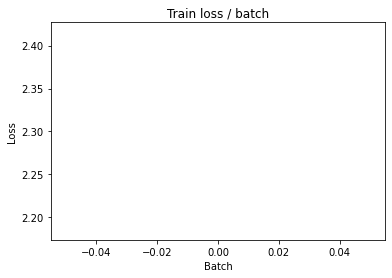

[TRAIN Batch 200/391]	Time 0.059s (0.036s)	Loss 1.7318 (1.9388)	Prec@1  39.8 ( 29.6)	Prec@5  91.4 ( 80.1)


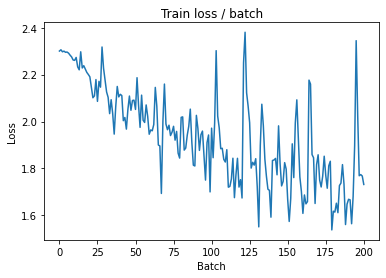


===============> Total time 14s	Avg loss 1.7345	Avg Prec@1 37.27 %	Avg Prec@5 85.47 %

[EVAL Batch 000/079]	Time 0.179s (0.179s)	Loss 1.4128 (1.4128)	Prec@1  46.9 ( 46.9)	Prec@5  93.0 ( 93.0)

===============> Total time 2s	Avg loss 1.4597	Avg Prec@1 46.46 %	Avg Prec@5 92.66 %



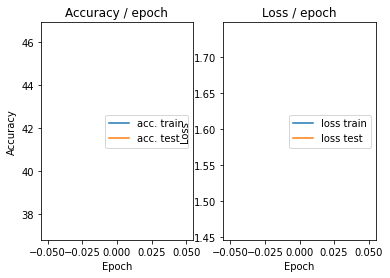

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.184s (0.184s)	Loss 1.4806 (1.4806)	Prec@1  46.1 ( 46.1)	Prec@5  94.5 ( 94.5)


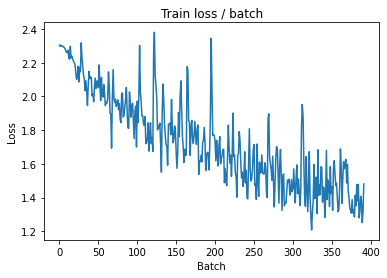

[TRAIN Batch 200/391]	Time 0.017s (0.038s)	Loss 1.3851 (1.3326)	Prec@1  50.0 ( 52.3)	Prec@5  93.8 ( 94.0)


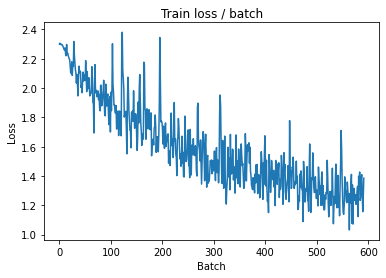


===============> Total time 14s	Avg loss 1.2604	Avg Prec@1 55.24 %	Avg Prec@5 94.60 %

[EVAL Batch 000/079]	Time 0.173s (0.173s)	Loss 1.2274 (1.2274)	Prec@1  60.2 ( 60.2)	Prec@5  92.2 ( 92.2)

===============> Total time 2s	Avg loss 1.3261	Avg Prec@1 52.67 %	Avg Prec@5 94.55 %



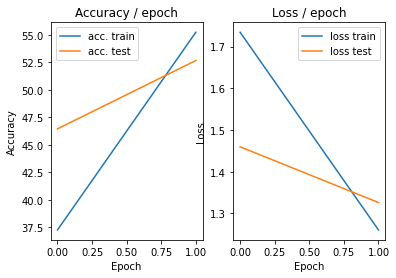

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.199s (0.199s)	Loss 1.2211 (1.2211)	Prec@1  55.5 ( 55.5)	Prec@5  93.0 ( 93.0)


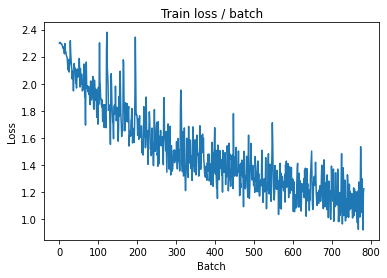

[TRAIN Batch 200/391]	Time 0.025s (0.038s)	Loss 0.9538 (1.0531)	Prec@1  62.5 ( 62.7)	Prec@5  96.9 ( 96.6)


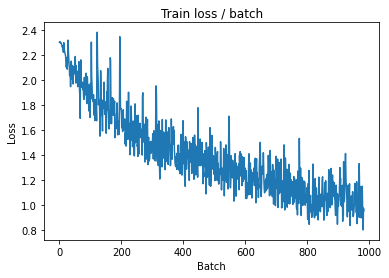


===============> Total time 14s	Avg loss 1.0179	Avg Prec@1 64.06 %	Avg Prec@5 96.80 %

[EVAL Batch 000/079]	Time 0.188s (0.188s)	Loss 0.9789 (0.9789)	Prec@1  65.6 ( 65.6)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.9675	Avg Prec@1 65.84 %	Avg Prec@5 96.83 %



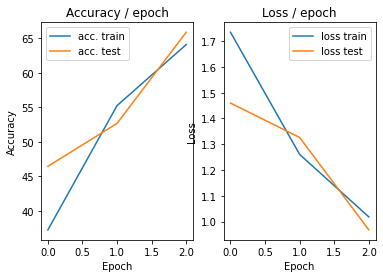

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.191s (0.191s)	Loss 0.9737 (0.9737)	Prec@1  64.8 ( 64.8)	Prec@5  98.4 ( 98.4)


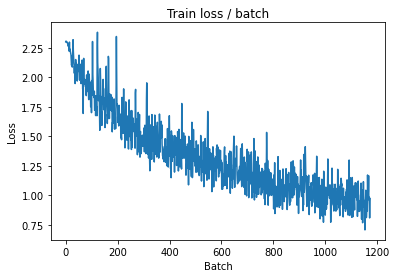

[TRAIN Batch 200/391]	Time 0.032s (0.037s)	Loss 0.6312 (0.8654)	Prec@1  77.3 ( 69.8)	Prec@5 100.0 ( 97.7)


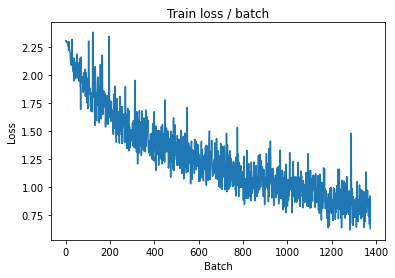


===============> Total time 14s	Avg loss 0.8421	Avg Prec@1 70.64 %	Avg Prec@5 97.82 %

[EVAL Batch 000/079]	Time 0.168s (0.168s)	Loss 1.0215 (1.0215)	Prec@1  64.8 ( 64.8)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 1.0011	Avg Prec@1 65.82 %	Avg Prec@5 95.95 %



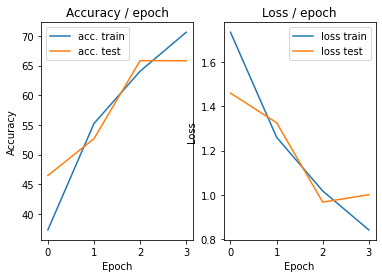

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.179s (0.179s)	Loss 0.7698 (0.7698)	Prec@1  71.1 ( 71.1)	Prec@5  99.2 ( 99.2)


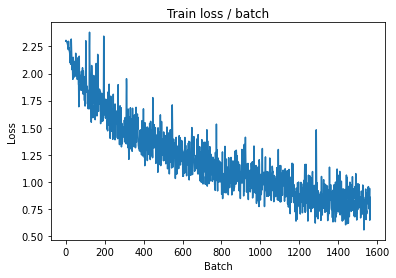

[TRAIN Batch 200/391]	Time 0.048s (0.038s)	Loss 0.7735 (0.7144)	Prec@1  73.4 ( 75.0)	Prec@5  99.2 ( 98.5)


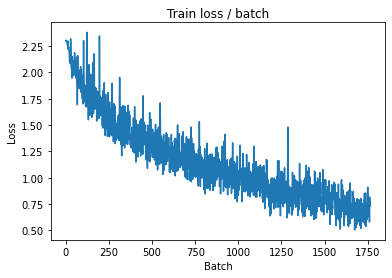


===============> Total time 14s	Avg loss 0.7055	Avg Prec@1 75.35 %	Avg Prec@5 98.48 %

[EVAL Batch 000/079]	Time 0.167s (0.167s)	Loss 0.9119 (0.9119)	Prec@1  68.8 ( 68.8)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.9677	Avg Prec@1 67.10 %	Avg Prec@5 97.39 %



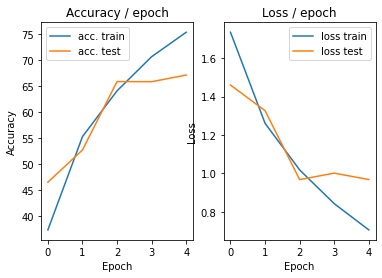

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.193s (0.193s)	Loss 0.7152 (0.7152)	Prec@1  69.5 ( 69.5)	Prec@5  99.2 ( 99.2)


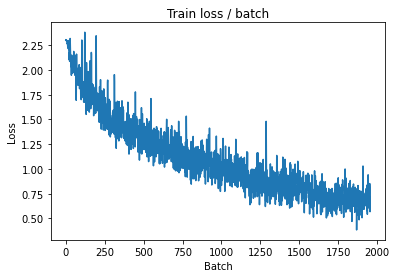

[TRAIN Batch 200/391]	Time 0.031s (0.039s)	Loss 0.6516 (0.5816)	Prec@1  79.7 ( 79.5)	Prec@5  99.2 ( 99.1)


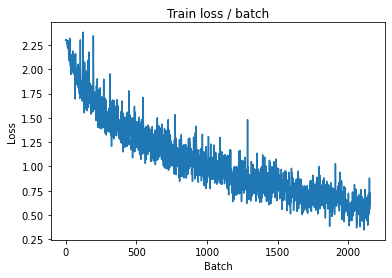


===============> Total time 14s	Avg loss 0.5848	Avg Prec@1 79.52 %	Avg Prec@5 98.99 %

[EVAL Batch 000/079]	Time 0.174s (0.174s)	Loss 0.9496 (0.9496)	Prec@1  72.7 ( 72.7)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.8452	Avg Prec@1 71.73 %	Avg Prec@5 97.75 %



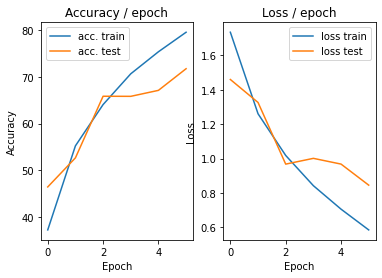

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.191s (0.191s)	Loss 0.5608 (0.5608)	Prec@1  73.4 ( 73.4)	Prec@5 100.0 (100.0)


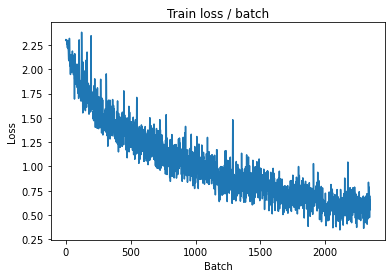

[TRAIN Batch 200/391]	Time 0.018s (0.037s)	Loss 0.5945 (0.4707)	Prec@1  76.6 ( 83.2)	Prec@5  98.4 ( 99.5)


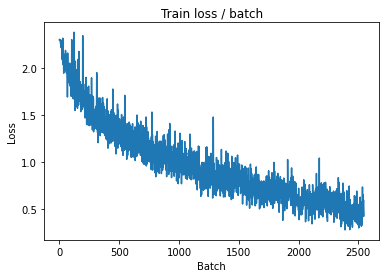


===============> Total time 14s	Avg loss 0.4771	Avg Prec@1 83.11 %	Avg Prec@5 99.48 %

[EVAL Batch 000/079]	Time 0.166s (0.166s)	Loss 1.1347 (1.1347)	Prec@1  69.5 ( 69.5)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 1.0322	Avg Prec@1 67.97 %	Avg Prec@5 96.99 %



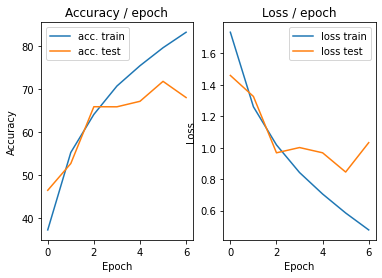

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.192s (0.192s)	Loss 0.7120 (0.7120)	Prec@1  75.8 ( 75.8)	Prec@5  97.7 ( 97.7)


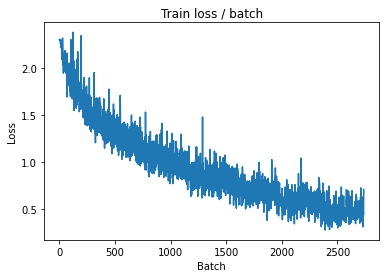

[TRAIN Batch 200/391]	Time 0.017s (0.036s)	Loss 0.3288 (0.3513)	Prec@1  86.7 ( 87.9)	Prec@5  99.2 ( 99.7)


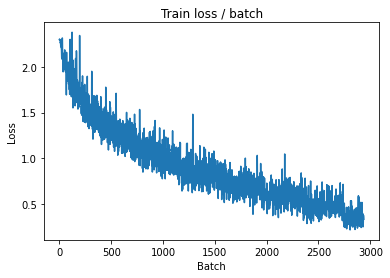


===============> Total time 14s	Avg loss 0.3705	Avg Prec@1 87.13 %	Avg Prec@5 99.68 %

[EVAL Batch 000/079]	Time 0.168s (0.168s)	Loss 1.0848 (1.0848)	Prec@1  70.3 ( 70.3)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.9564	Avg Prec@1 71.56 %	Avg Prec@5 97.50 %



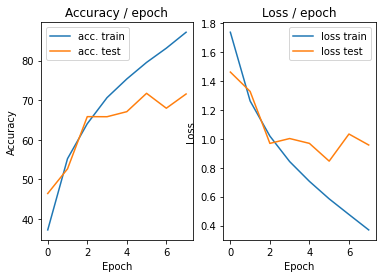

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.203s (0.203s)	Loss 0.4525 (0.4525)	Prec@1  85.2 ( 85.2)	Prec@5  99.2 ( 99.2)


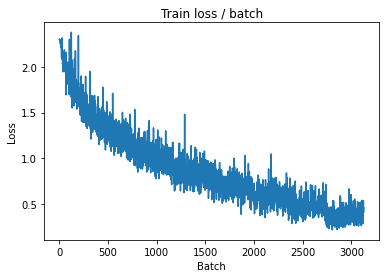

[TRAIN Batch 200/391]	Time 0.060s (0.037s)	Loss 0.1591 (0.2506)	Prec@1  93.0 ( 91.4)	Prec@5 100.0 ( 99.9)


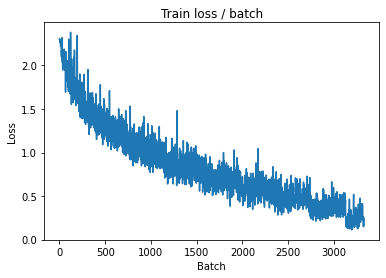


===============> Total time 14s	Avg loss 0.2730	Avg Prec@1 90.53 %	Avg Prec@5 99.87 %

[EVAL Batch 000/079]	Time 0.158s (0.158s)	Loss 1.0819 (1.0819)	Prec@1  69.5 ( 69.5)	Prec@5  95.3 ( 95.3)

===============> Total time 2s	Avg loss 0.9960	Avg Prec@1 71.37 %	Avg Prec@5 97.48 %



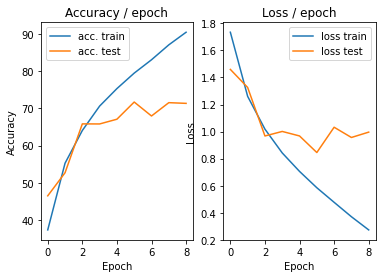

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.193s (0.193s)	Loss 0.2002 (0.2002)	Prec@1  93.0 ( 93.0)	Prec@5 100.0 (100.0)


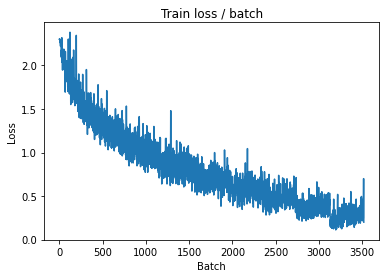

[TRAIN Batch 200/391]	Time 0.051s (0.039s)	Loss 0.1478 (0.1729)	Prec@1  96.1 ( 94.1)	Prec@5  99.2 (100.0)


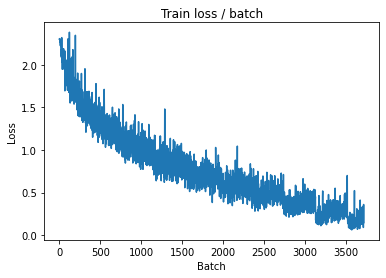


===============> Total time 14s	Avg loss 0.1904	Avg Prec@1 93.54 %	Avg Prec@5 99.95 %

[EVAL Batch 000/079]	Time 0.170s (0.170s)	Loss 0.8945 (0.8945)	Prec@1  79.7 ( 79.7)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 1.0693	Avg Prec@1 72.74 %	Avg Prec@5 97.73 %



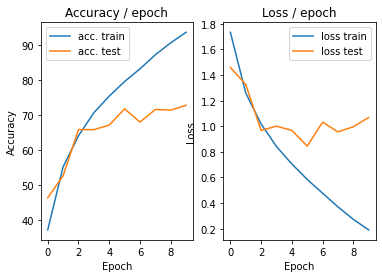

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.184s (0.184s)	Loss 0.2206 (0.2206)	Prec@1  93.8 ( 93.8)	Prec@5 100.0 (100.0)


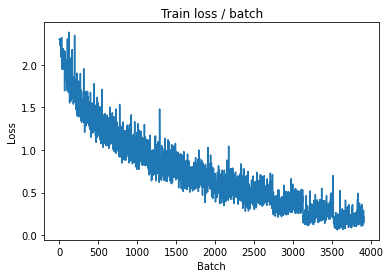

[TRAIN Batch 200/391]	Time 0.058s (0.037s)	Loss 0.1452 (0.1234)	Prec@1  93.0 ( 95.9)	Prec@5 100.0 (100.0)


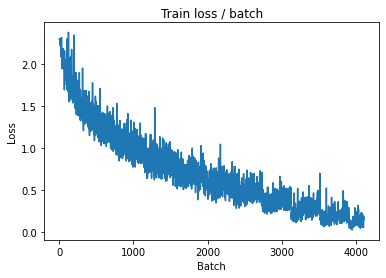


===============> Total time 14s	Avg loss 0.1403	Avg Prec@1 95.21 %	Avg Prec@5 99.99 %

[EVAL Batch 000/079]	Time 0.158s (0.158s)	Loss 1.7022 (1.7022)	Prec@1  67.2 ( 67.2)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 1.3805	Avg Prec@1 70.90 %	Avg Prec@5 97.38 %



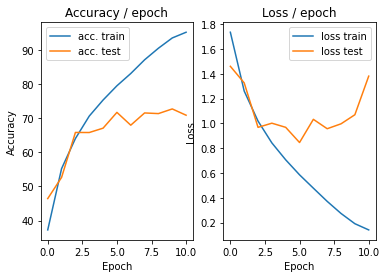

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.202s (0.202s)	Loss 0.3504 (0.3504)	Prec@1  89.1 ( 89.1)	Prec@5 100.0 (100.0)


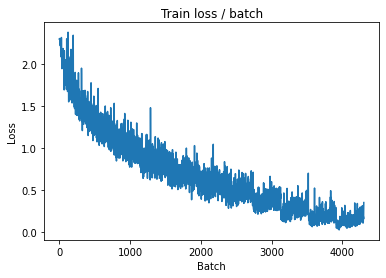

[TRAIN Batch 200/391]	Time 0.019s (0.037s)	Loss 0.1213 (0.0822)	Prec@1  95.3 ( 97.3)	Prec@5 100.0 (100.0)


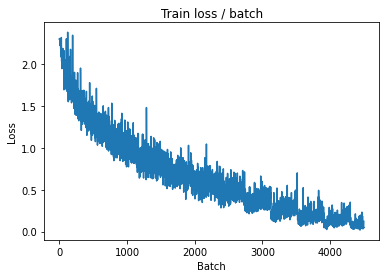


===============> Total time 14s	Avg loss 0.0987	Avg Prec@1 96.61 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.173s (0.173s)	Loss 1.3401 (1.3401)	Prec@1  70.3 ( 70.3)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 1.2043	Avg Prec@1 73.74 %	Avg Prec@5 97.83 %



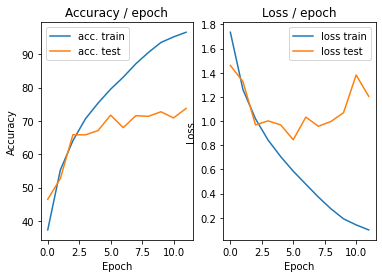

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.234s (0.234s)	Loss 0.1167 (0.1167)	Prec@1  95.3 ( 95.3)	Prec@5 100.0 (100.0)


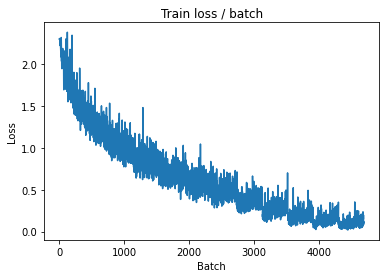

[TRAIN Batch 200/391]	Time 0.018s (0.037s)	Loss 0.0687 (0.0646)	Prec@1  97.7 ( 97.9)	Prec@5 100.0 (100.0)


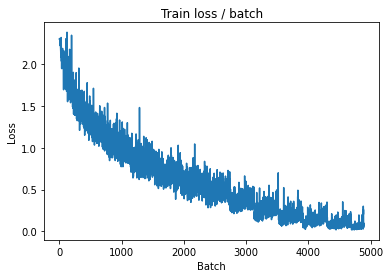


===============> Total time 14s	Avg loss 0.0736	Avg Prec@1 97.51 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.170s (0.170s)	Loss 1.4910 (1.4910)	Prec@1  74.2 ( 74.2)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 1.3254	Avg Prec@1 73.90 %	Avg Prec@5 97.83 %



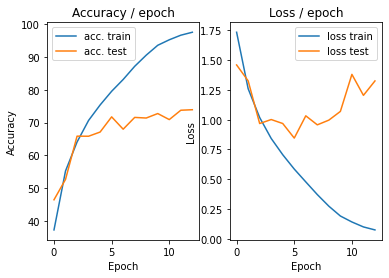

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.189s (0.189s)	Loss 0.1167 (0.1167)	Prec@1  96.1 ( 96.1)	Prec@5 100.0 (100.0)


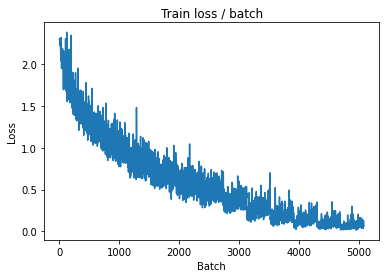

[TRAIN Batch 200/391]	Time 0.042s (0.038s)	Loss 0.0495 (0.0392)	Prec@1  98.4 ( 98.8)	Prec@5 100.0 (100.0)


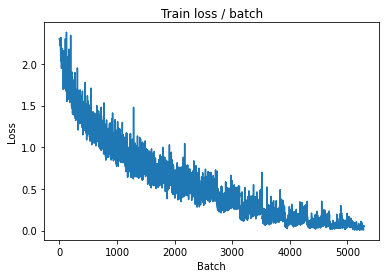


===============> Total time 14s	Avg loss 0.0750	Avg Prec@1 97.67 %	Avg Prec@5 99.98 %

[EVAL Batch 000/079]	Time 0.194s (0.194s)	Loss 1.6939 (1.6939)	Prec@1  69.5 ( 69.5)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 1.4674	Avg Prec@1 72.63 %	Avg Prec@5 97.19 %



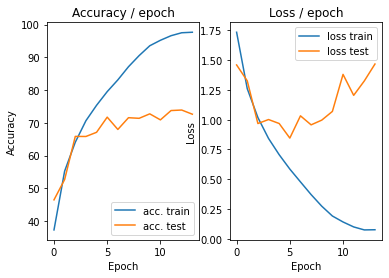

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.202s (0.202s)	Loss 0.1614 (0.1614)	Prec@1  96.1 ( 96.1)	Prec@5 100.0 (100.0)


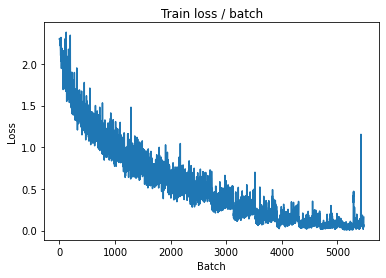

[TRAIN Batch 200/391]	Time 0.032s (0.038s)	Loss 0.0893 (0.0552)	Prec@1  96.9 ( 98.3)	Prec@5 100.0 (100.0)


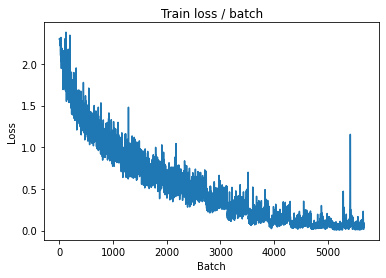


===============> Total time 14s	Avg loss 0.0680	Avg Prec@1 97.82 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.173s (0.173s)	Loss 1.9601 (1.9601)	Prec@1  71.1 ( 71.1)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 1.4252	Avg Prec@1 73.62 %	Avg Prec@5 97.53 %



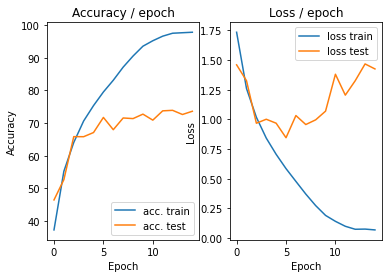

=== EPOCH 16 =====

[TRAIN Batch 000/391]	Time 0.198s (0.198s)	Loss 0.0344 (0.0344)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)


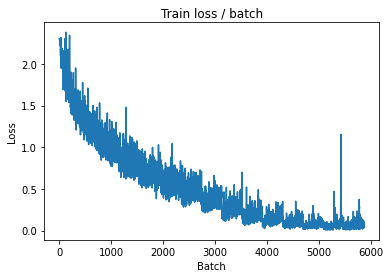

[TRAIN Batch 200/391]	Time 0.032s (0.037s)	Loss 0.0344 (0.0342)	Prec@1  99.2 ( 98.9)	Prec@5 100.0 (100.0)


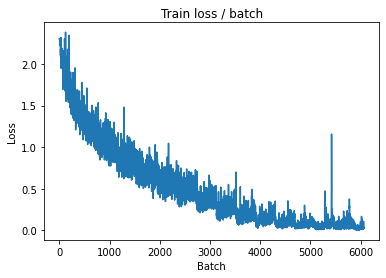


===============> Total time 14s	Avg loss 0.0470	Avg Prec@1 98.51 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.170s (0.170s)	Loss 1.5509 (1.5509)	Prec@1  72.7 ( 72.7)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 1.5404	Avg Prec@1 72.76 %	Avg Prec@5 97.60 %



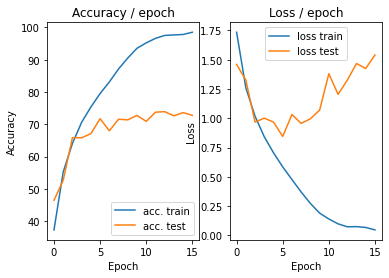

=== EPOCH 17 =====

[TRAIN Batch 000/391]	Time 0.197s (0.197s)	Loss 0.0280 (0.0280)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)


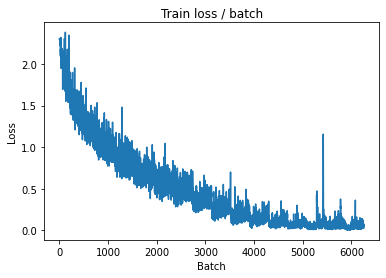

[TRAIN Batch 200/391]	Time 0.017s (0.037s)	Loss 0.0573 (0.0455)	Prec@1  97.7 ( 98.7)	Prec@5 100.0 (100.0)


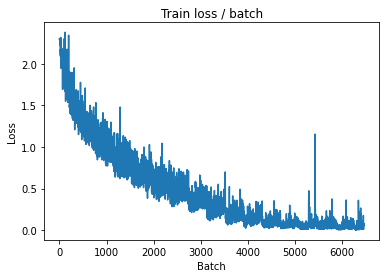


===============> Total time 14s	Avg loss 0.0526	Avg Prec@1 98.34 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.180s (0.180s)	Loss 1.8276 (1.8276)	Prec@1  71.9 ( 71.9)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 1.5601	Avg Prec@1 73.64 %	Avg Prec@5 97.87 %



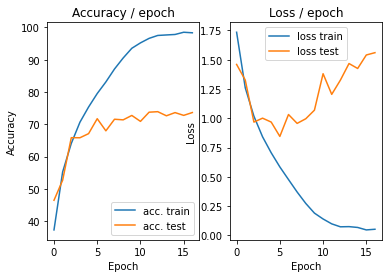

=== EPOCH 18 =====

[TRAIN Batch 000/391]	Time 0.196s (0.196s)	Loss 0.0447 (0.0447)	Prec@1  97.7 ( 97.7)	Prec@5 100.0 (100.0)


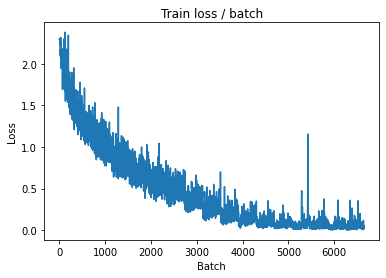

[TRAIN Batch 200/391]	Time 0.025s (0.038s)	Loss 0.0244 (0.0300)	Prec@1  99.2 ( 99.1)	Prec@5 100.0 (100.0)


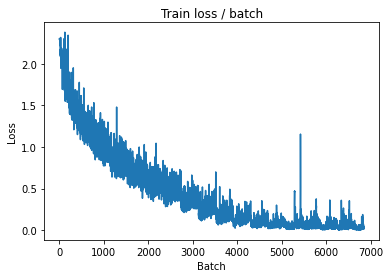


===============> Total time 14s	Avg loss 0.0377	Avg Prec@1 98.76 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.209s (0.209s)	Loss 1.7697 (1.7697)	Prec@1  72.7 ( 72.7)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 1.6465	Avg Prec@1 73.56 %	Avg Prec@5 97.71 %



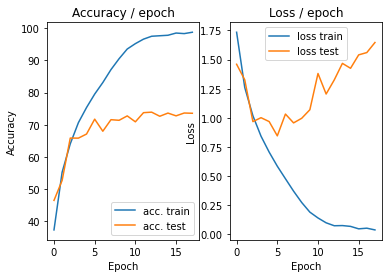

=== EPOCH 19 =====

[TRAIN Batch 000/391]	Time 0.209s (0.209s)	Loss 0.0103 (0.0103)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


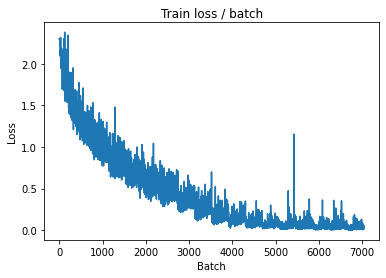

[TRAIN Batch 200/391]	Time 0.016s (0.037s)	Loss 0.0582 (0.0199)	Prec@1  98.4 ( 99.4)	Prec@5 100.0 (100.0)


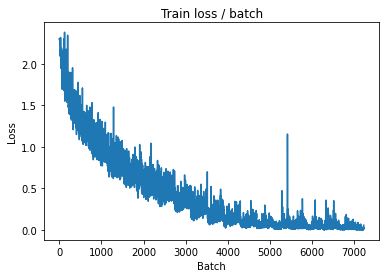


===============> Total time 14s	Avg loss 0.0331	Avg Prec@1 98.89 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.181s (0.181s)	Loss 2.0296 (2.0296)	Prec@1  73.4 ( 73.4)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 1.7790	Avg Prec@1 72.77 %	Avg Prec@5 97.59 %



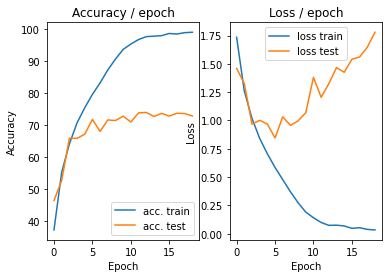

=== EPOCH 20 =====

[TRAIN Batch 000/391]	Time 0.218s (0.218s)	Loss 0.1907 (0.1907)	Prec@1  96.9 ( 96.9)	Prec@5 100.0 (100.0)


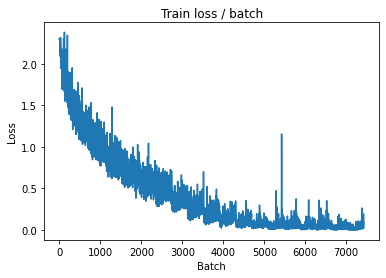

[TRAIN Batch 200/391]	Time 0.025s (0.037s)	Loss 0.0451 (0.0407)	Prec@1  97.7 ( 98.7)	Prec@5 100.0 (100.0)


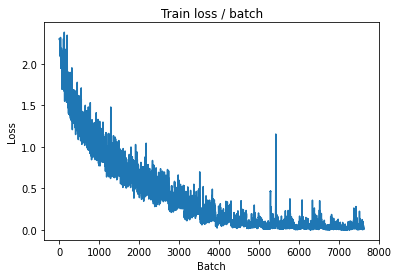


===============> Total time 14s	Avg loss 0.0359	Avg Prec@1 98.86 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.176s (0.176s)	Loss 1.5276 (1.5276)	Prec@1  78.1 ( 78.1)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 1.6866	Avg Prec@1 73.99 %	Avg Prec@5 97.15 %



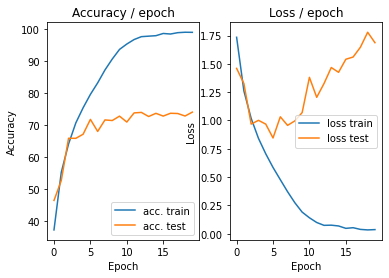

=== EPOCH 21 =====

[TRAIN Batch 000/391]	Time 0.217s (0.217s)	Loss 0.0131 (0.0131)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


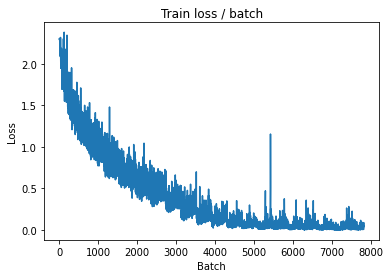

[TRAIN Batch 200/391]	Time 0.055s (0.037s)	Loss 0.0212 (0.0617)	Prec@1  98.4 ( 98.2)	Prec@5 100.0 (100.0)


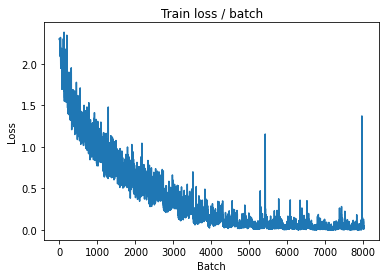


===============> Total time 14s	Avg loss 0.0492	Avg Prec@1 98.51 %	Avg Prec@5 99.99 %

[EVAL Batch 000/079]	Time 0.167s (0.167s)	Loss 1.7099 (1.7099)	Prec@1  75.0 ( 75.0)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 1.6326	Avg Prec@1 74.56 %	Avg Prec@5 97.70 %



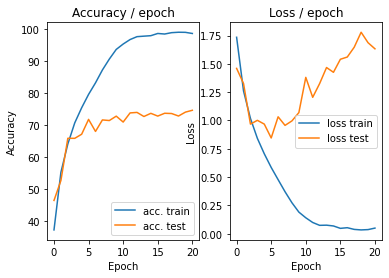

In [22]:
main(128, 0.1, epochs=21, cuda=True)

## **CIFAR-10 : Data Augmentation**

In [8]:
#Classe ConvNet avec l'architecture donnée
class ConvNet2(nn.Module):
    """
    This class defines the structure of the neural network
    """

    def __init__(self):
        super(ConvNet2, self).__init__()
        # We first define the convolution and pooling layers as a features extractor
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(32, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(64, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0, ceil_mode=True)
        )
        # We then define fully connected layers as a classifier
        self.classifier = nn.Sequential(
            nn.Linear(1024, 1000), #64 * 4 * 4 (4 pcq 32 divisé par 8)
            nn.ReLU(),
            nn.Linear(1000, 10),
            #nn.Softmax()
            # Reminder: The softmax is included in the loss, do not put it here
        )

    # Method called when we apply the network to an input batch
    def forward(self, input):
        bsize = input.size(0) # batch size
        output = self.features(input) # output of the conv layers
        output = output.view(bsize, -1) # we flatten the 2D feature maps into one 1D vector for each input
        output = self.classifier(output) # we compute the output of the fc layers
        return output

In [9]:
#Récupérer le dataset et le normaliser
def get_dataset_augmented(batch_size, cuda=False):
    """
    This function loads the dataset and performs transformations on each
    image (listed in `transform = ...`).
    """
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize((0.491, 0.482, 0.447), (0.202, 0.199, 0.201)),
            transforms.RandomCrop(28),
            transforms.RandomHorizontalFlip(0.5)
        ]))
    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize((0.491, 0.482, 0.447), (0.202, 0.199, 0.201)),
            transforms.CenterCrop(28)
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader

def main(batch_size=128, lr=0.1, epochs=5, cuda=False):

  # ex :
  #   {"batch_size": 128, "epochs": 5, "lr": 0.1}

  # define model, loss, optim
  model = ConvNet2()
  criterion = nn.CrossEntropyLoss()
  optimizer = torch.optim.SGD(model.parameters(), lr)

  if cuda: # only with GPU, and not with CPU
      cudnn.benchmark = True
      model = model.cuda()
      criterion = criterion.cuda()

  # Get the data
  train, test = get_dataset_augmented(batch_size, cuda)

  # init plots
  plot = AccLossPlot()
  global loss_plot
  loss_plot = TrainLossPlot()

  # We iterate on the epochs
  for i in range(epochs):
      print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
      # Train phase
      top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
      # Test phase
      top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
      # plot
      plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)


Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.203s (0.203s)	Loss 2.3023 (2.3023)	Prec@1  13.3 ( 13.3)	Prec@5  47.7 ( 47.7)


<Figure size 432x288 with 0 Axes>

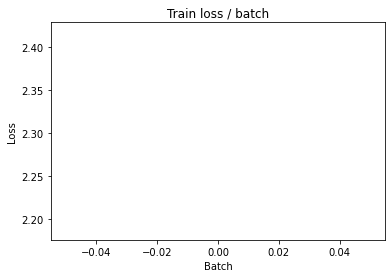

[TRAIN Batch 200/391]	Time 0.062s (0.047s)	Loss 1.6227 (1.9791)	Prec@1  43.8 ( 27.4)	Prec@5  88.3 ( 77.8)


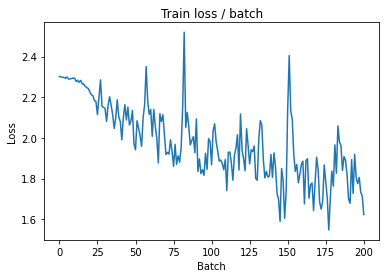


===============> Total time 18s	Avg loss 1.8139	Avg Prec@1 33.82 %	Avg Prec@5 83.34 %

[EVAL Batch 000/079]	Time 0.174s (0.174s)	Loss 1.5228 (1.5228)	Prec@1  49.2 ( 49.2)	Prec@5  91.4 ( 91.4)

===============> Total time 2s	Avg loss 1.5225	Avg Prec@1 45.99 %	Avg Prec@5 90.83 %



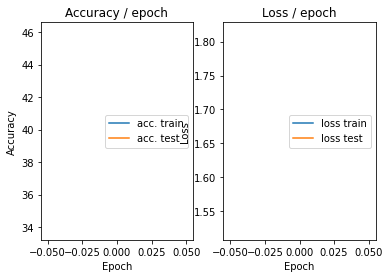

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.212s (0.212s)	Loss 1.5414 (1.5414)	Prec@1  45.3 ( 45.3)	Prec@5  92.2 ( 92.2)


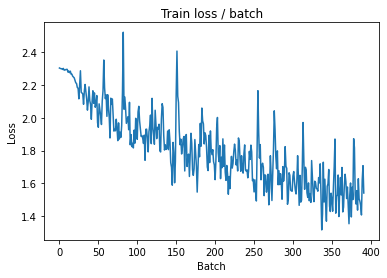

[TRAIN Batch 200/391]	Time 0.075s (0.047s)	Loss 1.1919 (1.4496)	Prec@1  58.6 ( 47.7)	Prec@5  96.1 ( 92.6)


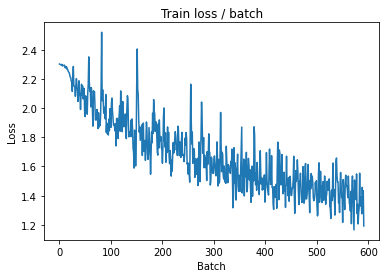


===============> Total time 18s	Avg loss 1.3990	Avg Prec@1 49.64 %	Avg Prec@5 93.13 %

[EVAL Batch 000/079]	Time 0.175s (0.175s)	Loss 1.2722 (1.2722)	Prec@1  57.0 ( 57.0)	Prec@5  94.5 ( 94.5)

===============> Total time 2s	Avg loss 1.2559	Avg Prec@1 55.14 %	Avg Prec@5 94.53 %



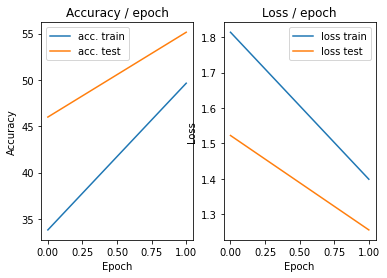

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.208s (0.208s)	Loss 1.3583 (1.3583)	Prec@1  53.9 ( 53.9)	Prec@5  93.0 ( 93.0)


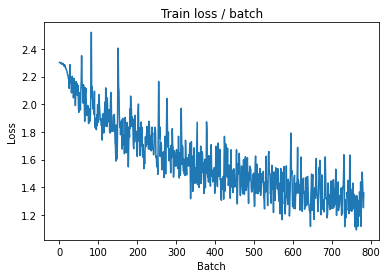

[TRAIN Batch 200/391]	Time 0.057s (0.047s)	Loss 1.0337 (1.2203)	Prec@1  65.6 ( 56.9)	Prec@5  97.7 ( 95.0)


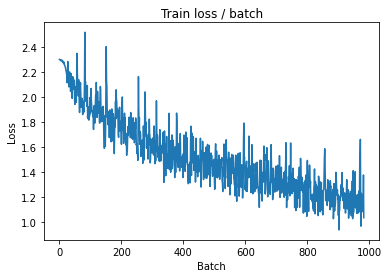


===============> Total time 18s	Avg loss 1.1858	Avg Prec@1 58.22 %	Avg Prec@5 95.20 %

[EVAL Batch 000/079]	Time 0.185s (0.185s)	Loss 1.0917 (1.0917)	Prec@1  68.0 ( 68.0)	Prec@5  94.5 ( 94.5)

===============> Total time 2s	Avg loss 1.1127	Avg Prec@1 61.78 %	Avg Prec@5 95.77 %



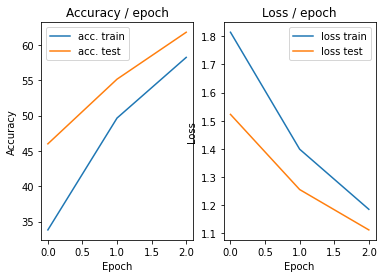

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.207s (0.207s)	Loss 1.1764 (1.1764)	Prec@1  58.6 ( 58.6)	Prec@5  95.3 ( 95.3)


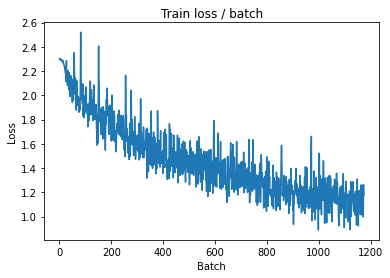

[TRAIN Batch 200/391]	Time 0.079s (0.047s)	Loss 1.1202 (1.0665)	Prec@1  61.7 ( 62.7)	Prec@5  96.1 ( 96.3)


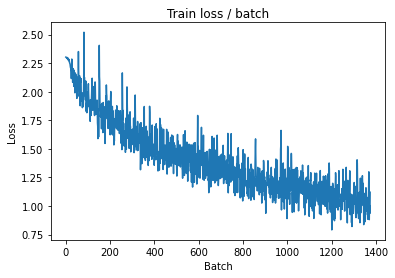


===============> Total time 18s	Avg loss 1.0304	Avg Prec@1 63.97 %	Avg Prec@5 96.57 %

[EVAL Batch 000/079]	Time 0.171s (0.171s)	Loss 0.9407 (0.9407)	Prec@1  70.3 ( 70.3)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 0.9100	Avg Prec@1 68.38 %	Avg Prec@5 97.38 %



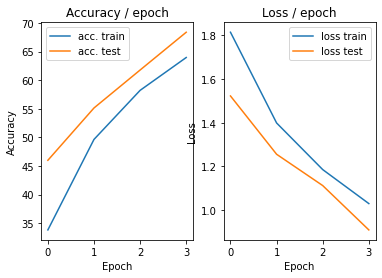

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.215s (0.215s)	Loss 0.8187 (0.8187)	Prec@1  75.8 ( 75.8)	Prec@5  95.3 ( 95.3)


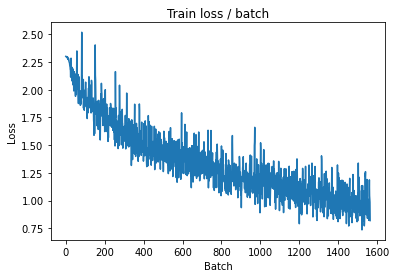

[TRAIN Batch 200/391]	Time 0.038s (0.048s)	Loss 0.9207 (0.9253)	Prec@1  68.0 ( 67.7)	Prec@5  96.1 ( 97.1)


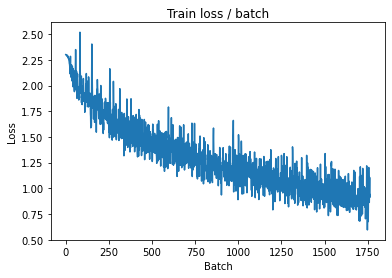


===============> Total time 18s	Avg loss 0.9124	Avg Prec@1 68.13 %	Avg Prec@5 97.29 %

[EVAL Batch 000/079]	Time 0.186s (0.186s)	Loss 0.8131 (0.8131)	Prec@1  73.4 ( 73.4)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 0.8728	Avg Prec@1 69.50 %	Avg Prec@5 97.31 %



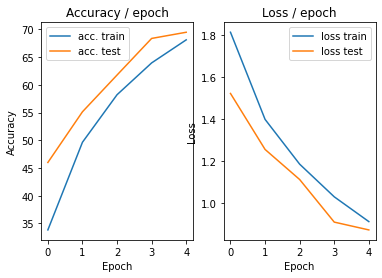

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.212s (0.212s)	Loss 0.8317 (0.8317)	Prec@1  75.0 ( 75.0)	Prec@5  98.4 ( 98.4)


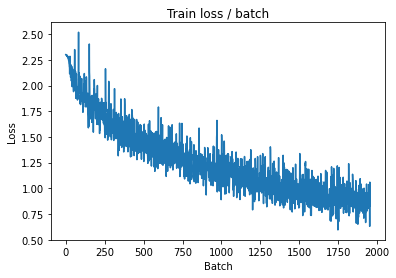

[TRAIN Batch 200/391]	Time 0.018s (0.046s)	Loss 0.7112 (0.8340)	Prec@1  78.1 ( 70.9)	Prec@5  98.4 ( 97.8)


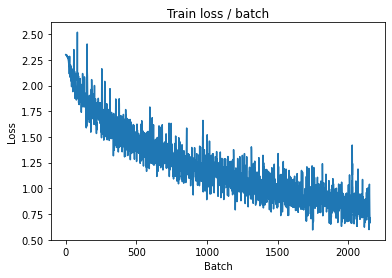


===============> Total time 17s	Avg loss 0.8291	Avg Prec@1 71.13 %	Avg Prec@5 97.88 %

[EVAL Batch 000/079]	Time 0.171s (0.171s)	Loss 1.0765 (1.0765)	Prec@1  63.3 ( 63.3)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 1.0433	Avg Prec@1 64.46 %	Avg Prec@5 97.27 %



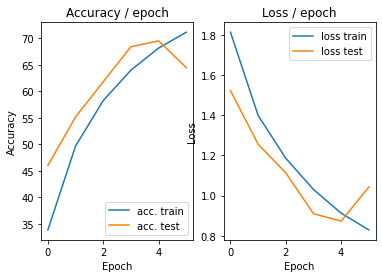

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.205s (0.205s)	Loss 1.0828 (1.0828)	Prec@1  64.8 ( 64.8)	Prec@5  96.9 ( 96.9)


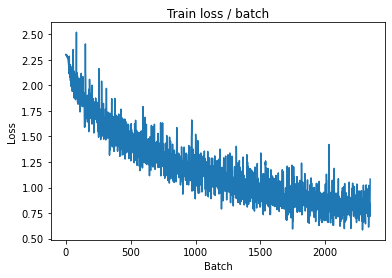

[TRAIN Batch 200/391]	Time 0.084s (0.047s)	Loss 0.8225 (0.7638)	Prec@1  73.4 ( 73.4)	Prec@5  99.2 ( 98.2)


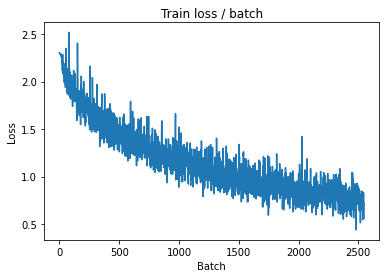


===============> Total time 18s	Avg loss 0.7581	Avg Prec@1 73.67 %	Avg Prec@5 98.13 %

[EVAL Batch 000/079]	Time 0.174s (0.174s)	Loss 0.7407 (0.7407)	Prec@1  75.0 ( 75.0)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.7353	Avg Prec@1 74.90 %	Avg Prec@5 98.32 %



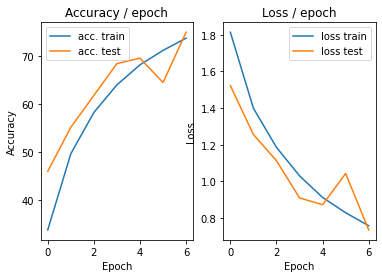

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.224s (0.224s)	Loss 0.5643 (0.5643)	Prec@1  81.2 ( 81.2)	Prec@5 100.0 (100.0)


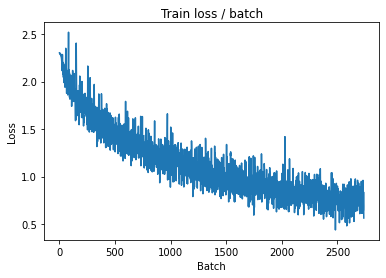

[TRAIN Batch 200/391]	Time 0.031s (0.047s)	Loss 0.6772 (0.7094)	Prec@1  76.6 ( 75.1)	Prec@5  97.7 ( 98.6)


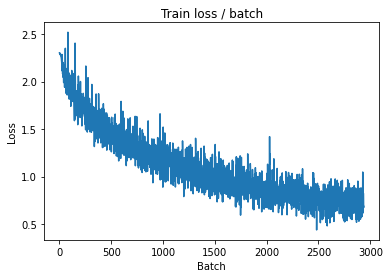


===============> Total time 18s	Avg loss 0.7047	Avg Prec@1 75.40 %	Avg Prec@5 98.50 %

[EVAL Batch 000/079]	Time 0.182s (0.182s)	Loss 0.7295 (0.7295)	Prec@1  76.6 ( 76.6)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.7203	Avg Prec@1 75.38 %	Avg Prec@5 98.42 %



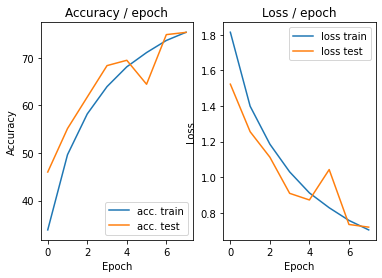

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.209s (0.209s)	Loss 0.5967 (0.5967)	Prec@1  78.9 ( 78.9)	Prec@5  99.2 ( 99.2)


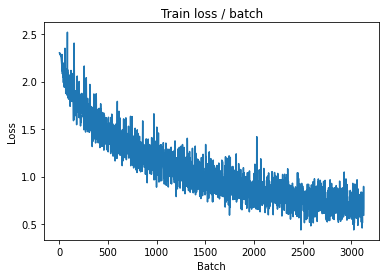

[TRAIN Batch 200/391]	Time 0.019s (0.048s)	Loss 0.6649 (0.6686)	Prec@1  78.1 ( 76.5)	Prec@5  99.2 ( 98.7)


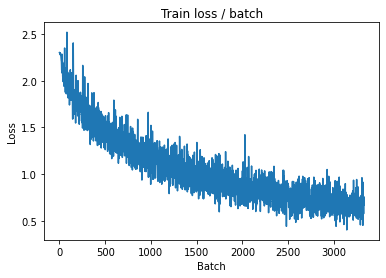


===============> Total time 18s	Avg loss 0.6636	Avg Prec@1 76.97 %	Avg Prec@5 98.60 %

[EVAL Batch 000/079]	Time 0.189s (0.189s)	Loss 0.6701 (0.6701)	Prec@1  80.5 ( 80.5)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.7323	Avg Prec@1 74.38 %	Avg Prec@5 98.56 %



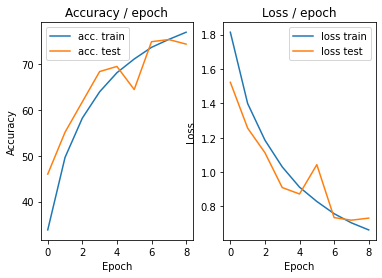

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.198s (0.198s)	Loss 0.5835 (0.5835)	Prec@1  80.5 ( 80.5)	Prec@5  99.2 ( 99.2)


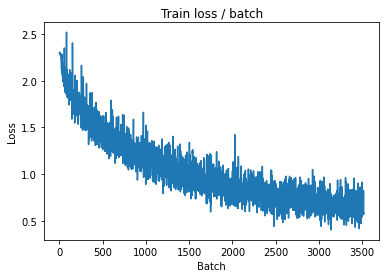

[TRAIN Batch 200/391]	Time 0.079s (0.046s)	Loss 0.7073 (0.6289)	Prec@1  76.6 ( 78.1)	Prec@5  97.7 ( 98.8)


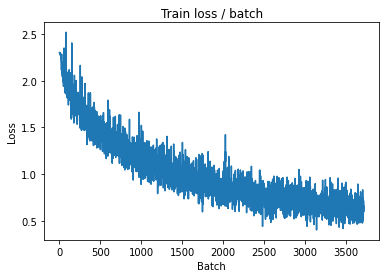


===============> Total time 18s	Avg loss 0.6246	Avg Prec@1 78.24 %	Avg Prec@5 98.85 %

[EVAL Batch 000/079]	Time 0.177s (0.177s)	Loss 0.7056 (0.7056)	Prec@1  78.9 ( 78.9)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.7243	Avg Prec@1 75.03 %	Avg Prec@5 98.28 %



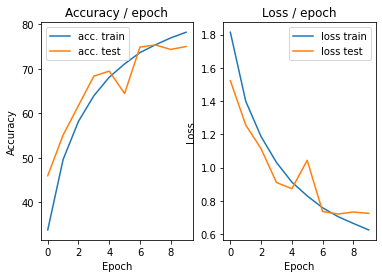

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.211s (0.211s)	Loss 0.6526 (0.6526)	Prec@1  73.4 ( 73.4)	Prec@5  99.2 ( 99.2)


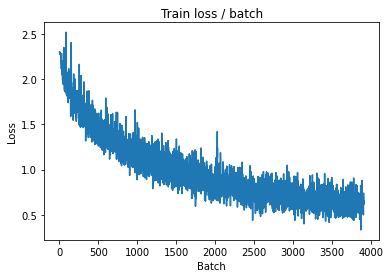

[TRAIN Batch 200/391]	Time 0.018s (0.047s)	Loss 0.6541 (0.5756)	Prec@1  74.2 ( 80.1)	Prec@5 100.0 ( 98.9)


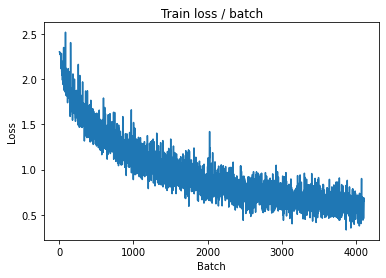


===============> Total time 18s	Avg loss 0.5885	Avg Prec@1 79.49 %	Avg Prec@5 98.93 %

[EVAL Batch 000/079]	Time 0.188s (0.188s)	Loss 0.8750 (0.8750)	Prec@1  71.1 ( 71.1)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.8140	Avg Prec@1 71.15 %	Avg Prec@5 98.25 %



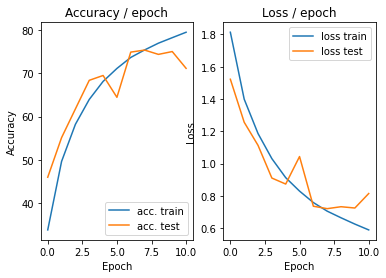

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.212s (0.212s)	Loss 0.7003 (0.7003)	Prec@1  72.7 ( 72.7)	Prec@5 100.0 (100.0)


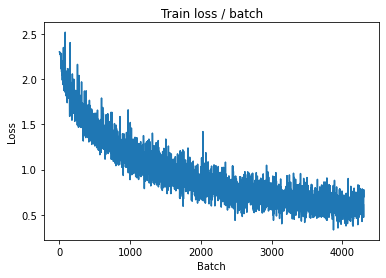

[TRAIN Batch 200/391]	Time 0.062s (0.047s)	Loss 0.4796 (0.5587)	Prec@1  85.2 ( 80.5)	Prec@5  99.2 ( 99.1)


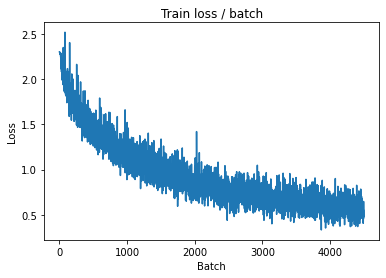


===============> Total time 18s	Avg loss 0.5602	Avg Prec@1 80.39 %	Avg Prec@5 99.07 %

[EVAL Batch 000/079]	Time 0.185s (0.185s)	Loss 0.6990 (0.6990)	Prec@1  75.8 ( 75.8)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.7100	Avg Prec@1 76.29 %	Avg Prec@5 98.37 %



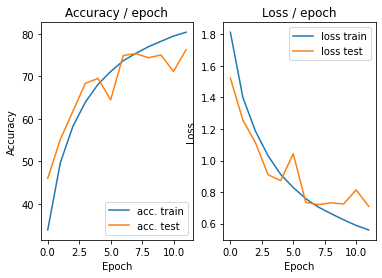

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.220s (0.220s)	Loss 0.6428 (0.6428)	Prec@1  79.7 ( 79.7)	Prec@5  99.2 ( 99.2)


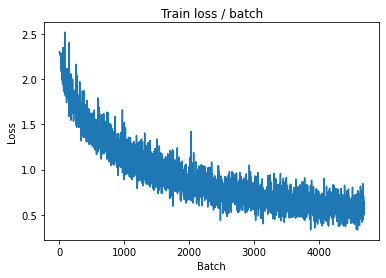

[TRAIN Batch 200/391]	Time 0.044s (0.048s)	Loss 0.6828 (0.5223)	Prec@1  75.8 ( 82.1)	Prec@5  97.7 ( 99.2)


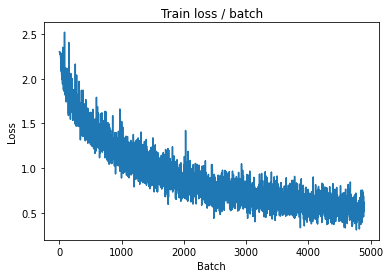


===============> Total time 18s	Avg loss 0.5274	Avg Prec@1 81.75 %	Avg Prec@5 99.14 %

[EVAL Batch 000/079]	Time 0.188s (0.188s)	Loss 0.6969 (0.6969)	Prec@1  77.3 ( 77.3)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.6758	Avg Prec@1 77.49 %	Avg Prec@5 98.56 %



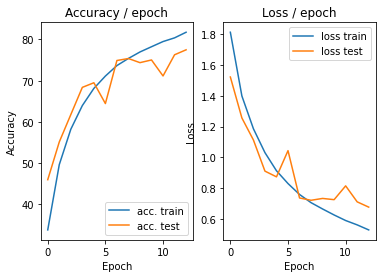

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.228s (0.228s)	Loss 0.6303 (0.6303)	Prec@1  76.6 ( 76.6)	Prec@5  98.4 ( 98.4)


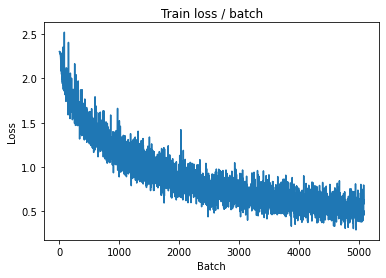

[TRAIN Batch 200/391]	Time 0.024s (0.047s)	Loss 0.5421 (0.5028)	Prec@1  83.6 ( 82.4)	Prec@5  98.4 ( 99.2)


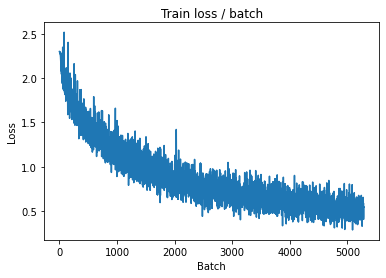


===============> Total time 18s	Avg loss 0.5074	Avg Prec@1 82.40 %	Avg Prec@5 99.27 %

[EVAL Batch 000/079]	Time 0.178s (0.178s)	Loss 0.6909 (0.6909)	Prec@1  78.9 ( 78.9)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.6863	Avg Prec@1 77.35 %	Avg Prec@5 98.47 %



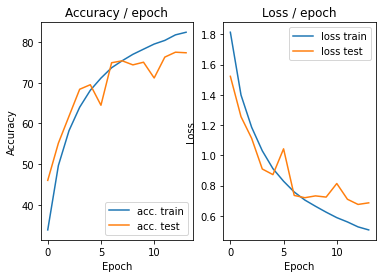

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.216s (0.216s)	Loss 0.4408 (0.4408)	Prec@1  85.9 ( 85.9)	Prec@5 100.0 (100.0)


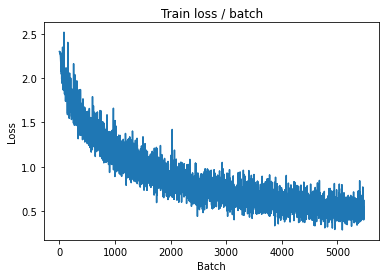

[TRAIN Batch 200/391]	Time 0.018s (0.047s)	Loss 0.3466 (0.4774)	Prec@1  88.3 ( 83.3)	Prec@5  99.2 ( 99.4)


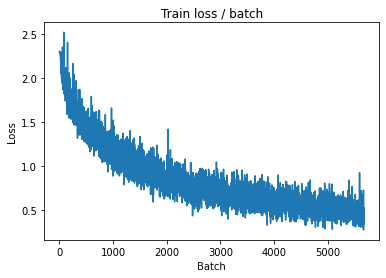


===============> Total time 18s	Avg loss 0.4818	Avg Prec@1 83.18 %	Avg Prec@5 99.35 %

[EVAL Batch 000/079]	Time 0.204s (0.204s)	Loss 0.7398 (0.7398)	Prec@1  78.1 ( 78.1)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.6706	Avg Prec@1 78.75 %	Avg Prec@5 98.48 %



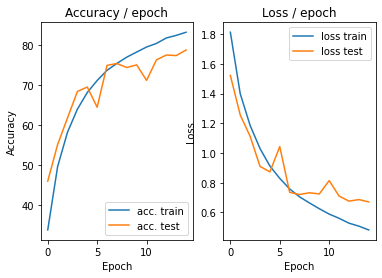

=== EPOCH 16 =====

[TRAIN Batch 000/391]	Time 0.224s (0.224s)	Loss 0.4497 (0.4497)	Prec@1  82.0 ( 82.0)	Prec@5 100.0 (100.0)


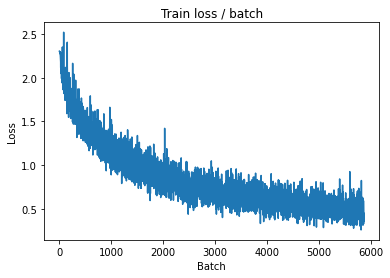

[TRAIN Batch 200/391]	Time 0.060s (0.047s)	Loss 0.3014 (0.4447)	Prec@1  89.8 ( 84.7)	Prec@5 100.0 ( 99.4)


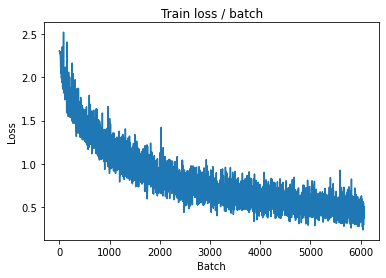


===============> Total time 18s	Avg loss 0.4539	Avg Prec@1 84.25 %	Avg Prec@5 99.39 %

[EVAL Batch 000/079]	Time 0.179s (0.179s)	Loss 0.7484 (0.7484)	Prec@1  80.5 ( 80.5)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.7293	Avg Prec@1 77.20 %	Avg Prec@5 98.48 %



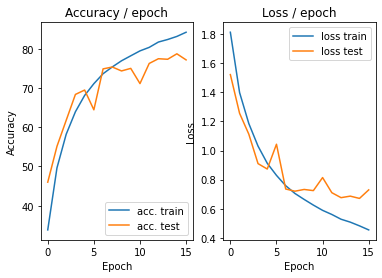

=== EPOCH 17 =====

[TRAIN Batch 000/391]	Time 0.216s (0.216s)	Loss 0.5875 (0.5875)	Prec@1  78.1 ( 78.1)	Prec@5 100.0 (100.0)


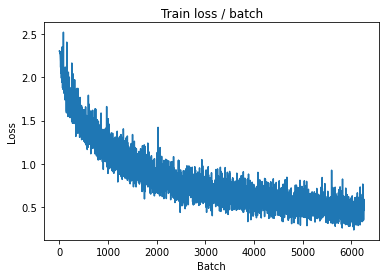

[TRAIN Batch 200/391]	Time 0.078s (0.048s)	Loss 0.5700 (0.4324)	Prec@1  81.2 ( 85.0)	Prec@5 100.0 ( 99.5)


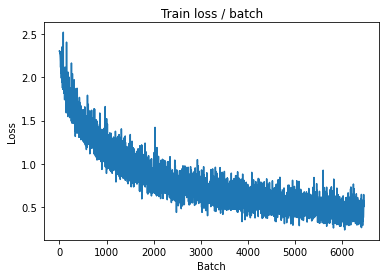


===============> Total time 18s	Avg loss 0.4362	Avg Prec@1 84.79 %	Avg Prec@5 99.49 %

[EVAL Batch 000/079]	Time 0.188s (0.188s)	Loss 0.7353 (0.7353)	Prec@1  76.6 ( 76.6)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.6582	Avg Prec@1 78.60 %	Avg Prec@5 98.63 %



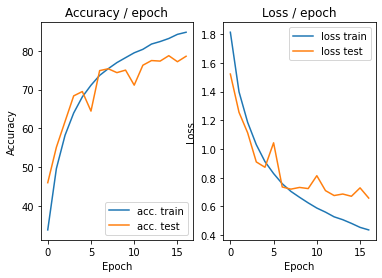

=== EPOCH 18 =====

[TRAIN Batch 000/391]	Time 0.192s (0.192s)	Loss 0.4341 (0.4341)	Prec@1  84.4 ( 84.4)	Prec@5 100.0 (100.0)


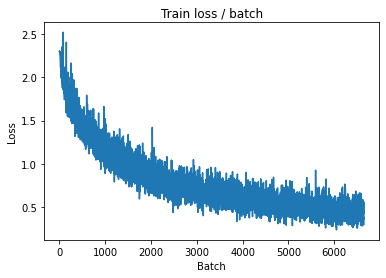

[TRAIN Batch 200/391]	Time 0.044s (0.046s)	Loss 0.3972 (0.4164)	Prec@1  84.4 ( 85.3)	Prec@5 100.0 ( 99.6)


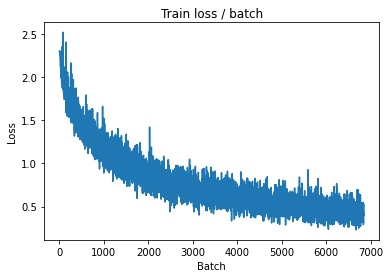


===============> Total time 18s	Avg loss 0.4172	Avg Prec@1 85.34 %	Avg Prec@5 99.56 %

[EVAL Batch 000/079]	Time 0.178s (0.178s)	Loss 0.6995 (0.6995)	Prec@1  79.7 ( 79.7)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6852	Avg Prec@1 78.77 %	Avg Prec@5 98.66 %



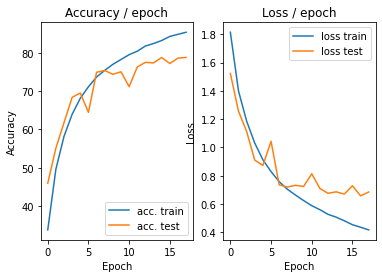

=== EPOCH 19 =====

[TRAIN Batch 000/391]	Time 0.235s (0.235s)	Loss 0.4305 (0.4305)	Prec@1  88.3 ( 88.3)	Prec@5  98.4 ( 98.4)


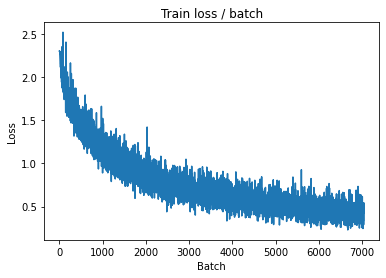

[TRAIN Batch 200/391]	Time 0.025s (0.047s)	Loss 0.4327 (0.3955)	Prec@1  85.2 ( 86.4)	Prec@5  99.2 ( 99.6)


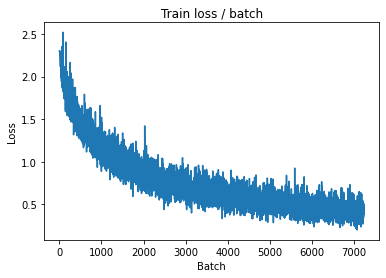


===============> Total time 18s	Avg loss 0.3974	Avg Prec@1 86.13 %	Avg Prec@5 99.58 %

[EVAL Batch 000/079]	Time 0.178s (0.178s)	Loss 0.7999 (0.7999)	Prec@1  78.1 ( 78.1)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.8183	Avg Prec@1 75.56 %	Avg Prec@5 98.26 %



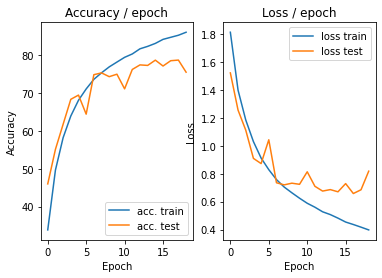

=== EPOCH 20 =====

[TRAIN Batch 000/391]	Time 0.213s (0.213s)	Loss 0.7053 (0.7053)	Prec@1  76.6 ( 76.6)	Prec@5  99.2 ( 99.2)


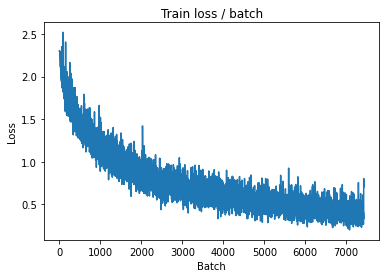

[TRAIN Batch 200/391]	Time 0.030s (0.047s)	Loss 0.3503 (0.3657)	Prec@1  88.3 ( 87.1)	Prec@5 100.0 ( 99.6)


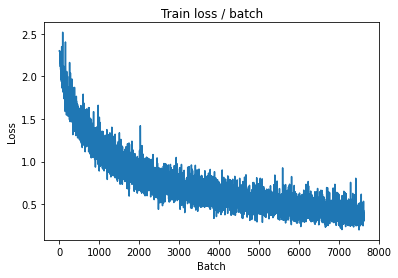


===============> Total time 18s	Avg loss 0.3788	Avg Prec@1 86.67 %	Avg Prec@5 99.60 %

[EVAL Batch 000/079]	Time 0.191s (0.191s)	Loss 0.6526 (0.6526)	Prec@1  83.6 ( 83.6)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6699	Avg Prec@1 78.80 %	Avg Prec@5 98.60 %



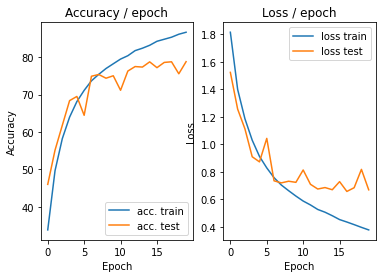

=== EPOCH 21 =====

[TRAIN Batch 000/391]	Time 0.223s (0.223s)	Loss 0.4246 (0.4246)	Prec@1  86.7 ( 86.7)	Prec@5  98.4 ( 98.4)


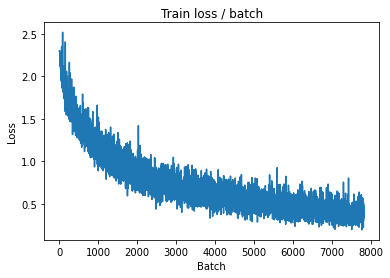

[TRAIN Batch 200/391]	Time 0.019s (0.048s)	Loss 0.4616 (0.3527)	Prec@1  85.2 ( 87.7)	Prec@5  98.4 ( 99.7)


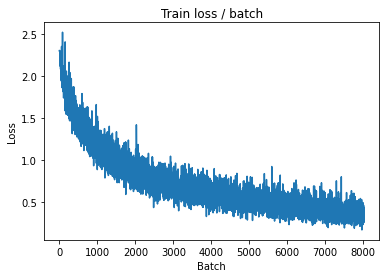


===============> Total time 18s	Avg loss 0.3607	Avg Prec@1 87.42 %	Avg Prec@5 99.68 %

[EVAL Batch 000/079]	Time 0.176s (0.176s)	Loss 0.5738 (0.5738)	Prec@1  82.8 ( 82.8)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.6325	Avg Prec@1 79.88 %	Avg Prec@5 98.74 %



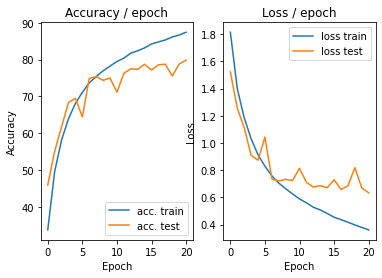

In [25]:
main(128, 0.1, epochs=21, cuda=True)

## **CIFAR-10 : Optimization algorithm**

In [10]:
import torch.optim.lr_scheduler

def main(batch_size=128, lr=0.1, epochs=5, cuda=False):

  # ex :
  #   {"batch_size": 128, "epochs": 5, "lr": 0.1}

  # define model, loss, optim
  model = ConvNet2()
  criterion = nn.CrossEntropyLoss()
  optimizer = torch.optim.SGD(model.parameters(), lr, momentum=0.9)
  lr_sched = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.95)

  if cuda: # only with GPU, and not with CPU
      cudnn.benchmark = True
      model = model.cuda()
      criterion = criterion.cuda()

  # Get the data
  train, test = get_dataset_augmented(batch_size, cuda)

  # init plots
  plot = AccLossPlot()
  global loss_plot
  loss_plot = TrainLossPlot()

  # We iterate on the epochs
  for i in range(epochs):
      print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
      # Train phase
      top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
      # Test phase
      top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
      # plot
      plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)
      lr_sched.step()

  0%|          | 0/170498071 [00:00<?, ?it/s]

Extracting datasets/cifar-10-python.tar.gz to datasets
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.745s (0.745s)	Loss 2.3057 (2.3057)	Prec@1  10.2 ( 10.2)	Prec@5  43.0 ( 43.0)


<Figure size 432x288 with 0 Axes>

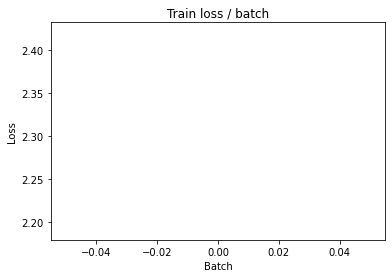

[TRAIN Batch 200/391]	Time 0.022s (0.049s)	Loss 1.8703 (2.0813)	Prec@1  31.2 ( 22.7)	Prec@5  82.8 ( 74.0)


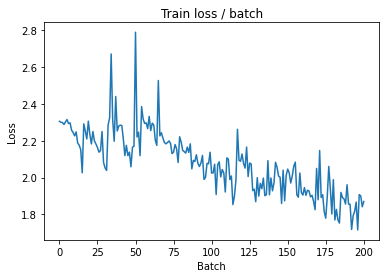


===============> Total time 18s	Avg loss 1.9452	Avg Prec@1 28.03 %	Avg Prec@5 79.59 %

[EVAL Batch 000/079]	Time 0.179s (0.179s)	Loss 1.7481 (1.7481)	Prec@1  35.2 ( 35.2)	Prec@5  88.3 ( 88.3)

===============> Total time 2s	Avg loss 1.6383	Avg Prec@1 40.19 %	Avg Prec@5 88.99 %



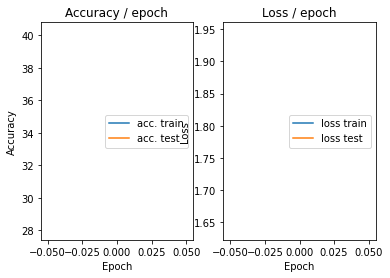

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.190s (0.190s)	Loss 1.6108 (1.6108)	Prec@1  44.5 ( 44.5)	Prec@5  89.1 ( 89.1)


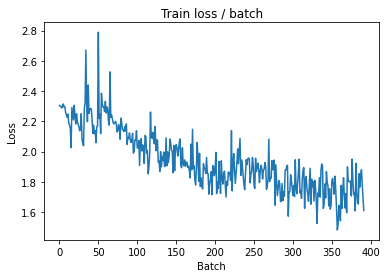

[TRAIN Batch 200/391]	Time 0.048s (0.046s)	Loss 1.6363 (1.6882)	Prec@1  43.0 ( 38.1)	Prec@5  87.5 ( 88.7)


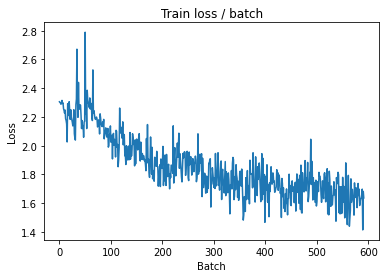


===============> Total time 18s	Avg loss 1.6684	Avg Prec@1 38.79 %	Avg Prec@5 88.83 %

[EVAL Batch 000/079]	Time 0.170s (0.170s)	Loss 1.6990 (1.6990)	Prec@1  40.6 ( 40.6)	Prec@5  89.8 ( 89.8)

===============> Total time 2s	Avg loss 1.6356	Avg Prec@1 40.18 %	Avg Prec@5 89.95 %



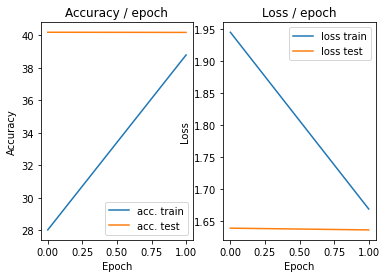

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.190s (0.190s)	Loss 1.3944 (1.3944)	Prec@1  49.2 ( 49.2)	Prec@5  92.2 ( 92.2)


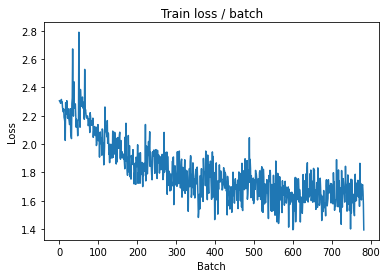

[TRAIN Batch 200/391]	Time 0.074s (0.047s)	Loss 1.5752 (1.6145)	Prec@1  41.4 ( 41.0)	Prec@5  93.0 ( 89.6)


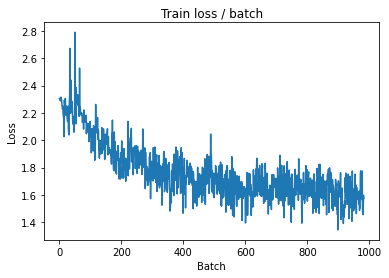


===============> Total time 18s	Avg loss 1.5951	Avg Prec@1 42.12 %	Avg Prec@5 89.94 %

[EVAL Batch 000/079]	Time 0.159s (0.159s)	Loss 1.5358 (1.5358)	Prec@1  43.0 ( 43.0)	Prec@5  92.2 ( 92.2)

===============> Total time 2s	Avg loss 1.5611	Avg Prec@1 41.67 %	Avg Prec@5 91.09 %



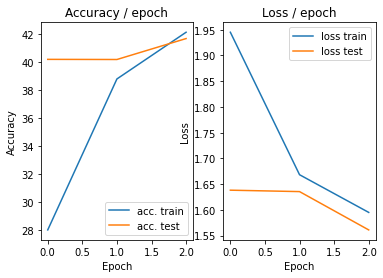

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.186s (0.186s)	Loss 1.5050 (1.5050)	Prec@1  43.8 ( 43.8)	Prec@5  90.6 ( 90.6)


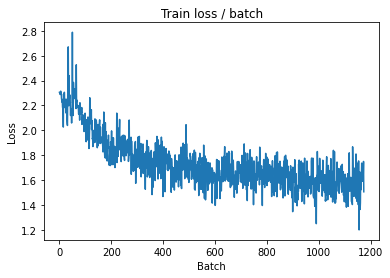

[TRAIN Batch 200/391]	Time 0.022s (0.046s)	Loss 1.5718 (1.5307)	Prec@1  40.6 ( 44.9)	Prec@5  89.8 ( 90.9)


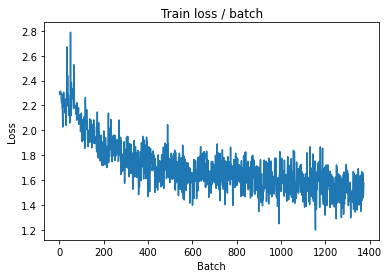


===============> Total time 18s	Avg loss 1.5346	Avg Prec@1 44.75 %	Avg Prec@5 90.76 %

[EVAL Batch 000/079]	Time 0.154s (0.154s)	Loss 1.4870 (1.4870)	Prec@1  52.3 ( 52.3)	Prec@5  94.5 ( 94.5)

===============> Total time 2s	Avg loss 1.4927	Avg Prec@1 47.59 %	Avg Prec@5 90.34 %



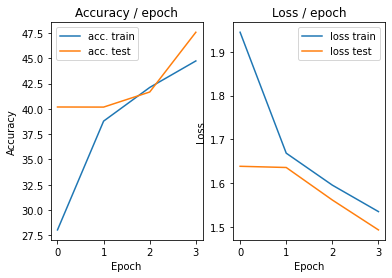

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.208s (0.208s)	Loss 1.4217 (1.4217)	Prec@1  50.0 ( 50.0)	Prec@5  93.0 ( 93.0)


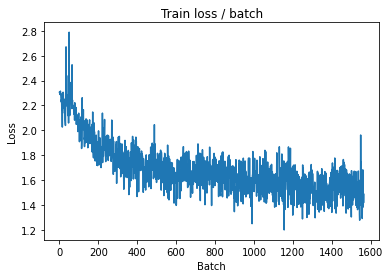

[TRAIN Batch 200/391]	Time 0.030s (0.048s)	Loss 1.6172 (1.4736)	Prec@1  42.2 ( 47.6)	Prec@5  91.4 ( 91.6)


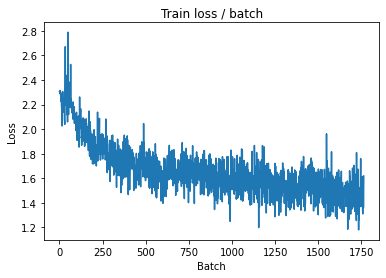


===============> Total time 18s	Avg loss 1.4857	Avg Prec@1 47.10 %	Avg Prec@5 91.31 %

[EVAL Batch 000/079]	Time 0.183s (0.183s)	Loss 1.5315 (1.5315)	Prec@1  50.0 ( 50.0)	Prec@5  90.6 ( 90.6)

===============> Total time 2s	Avg loss 1.4457	Avg Prec@1 47.95 %	Avg Prec@5 92.07 %



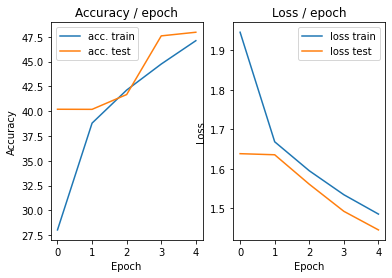

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.186s (0.186s)	Loss 1.5833 (1.5833)	Prec@1  50.0 ( 50.0)	Prec@5  88.3 ( 88.3)


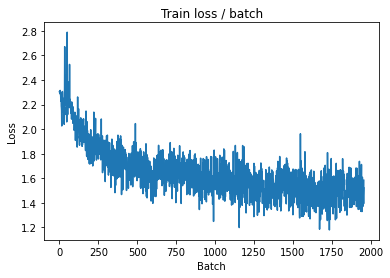

[TRAIN Batch 200/391]	Time 0.018s (0.047s)	Loss 1.5340 (1.4387)	Prec@1  48.4 ( 49.1)	Prec@5  91.4 ( 92.0)


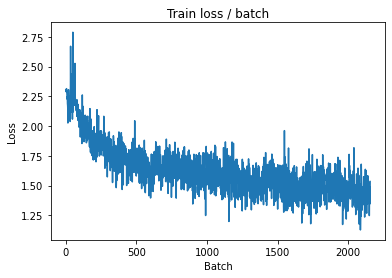


===============> Total time 18s	Avg loss 1.4304	Avg Prec@1 49.46 %	Avg Prec@5 92.07 %

[EVAL Batch 000/079]	Time 0.178s (0.178s)	Loss 1.3686 (1.3686)	Prec@1  49.2 ( 49.2)	Prec@5  93.8 ( 93.8)

===============> Total time 2s	Avg loss 1.3851	Avg Prec@1 51.54 %	Avg Prec@5 92.53 %



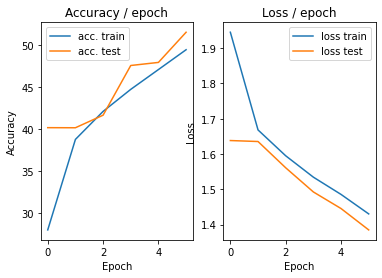

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.208s (0.208s)	Loss 1.6336 (1.6336)	Prec@1  43.0 ( 43.0)	Prec@5  85.2 ( 85.2)


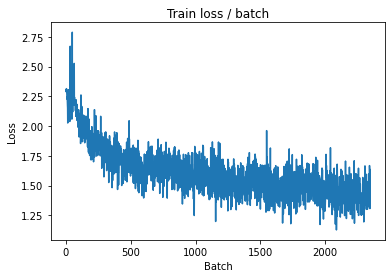

[TRAIN Batch 200/391]	Time 0.083s (0.050s)	Loss 1.2584 (1.4149)	Prec@1  53.1 ( 50.3)	Prec@5  92.2 ( 92.5)


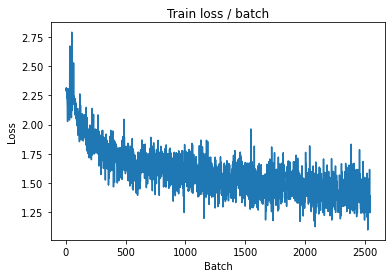


===============> Total time 18s	Avg loss 1.3912	Avg Prec@1 51.11 %	Avg Prec@5 92.73 %

[EVAL Batch 000/079]	Time 0.181s (0.181s)	Loss 1.4266 (1.4266)	Prec@1  50.0 ( 50.0)	Prec@5  92.2 ( 92.2)

===============> Total time 2s	Avg loss 1.3510	Avg Prec@1 52.87 %	Avg Prec@5 93.27 %



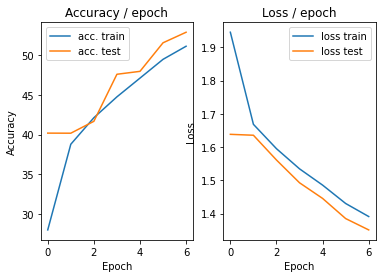

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.189s (0.189s)	Loss 1.3880 (1.3880)	Prec@1  54.7 ( 54.7)	Prec@5  93.8 ( 93.8)


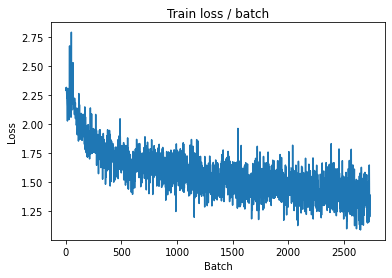

[TRAIN Batch 200/391]	Time 0.056s (0.048s)	Loss 1.6064 (1.3396)	Prec@1  48.4 ( 53.2)	Prec@5  91.4 ( 93.3)


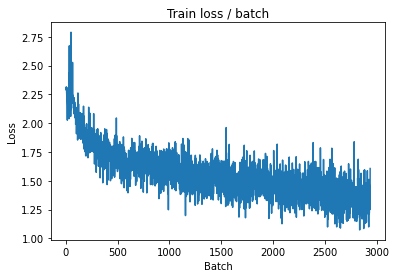


===============> Total time 18s	Avg loss 1.3367	Avg Prec@1 53.41 %	Avg Prec@5 93.15 %

[EVAL Batch 000/079]	Time 0.175s (0.175s)	Loss 1.2687 (1.2687)	Prec@1  60.2 ( 60.2)	Prec@5  94.5 ( 94.5)

===============> Total time 2s	Avg loss 1.2697	Avg Prec@1 56.38 %	Avg Prec@5 94.46 %



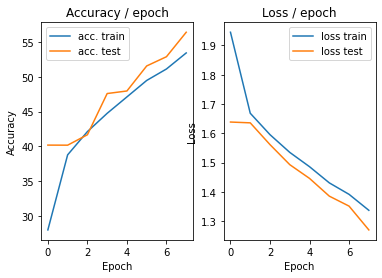

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.193s (0.193s)	Loss 1.1789 (1.1789)	Prec@1  59.4 ( 59.4)	Prec@5  98.4 ( 98.4)


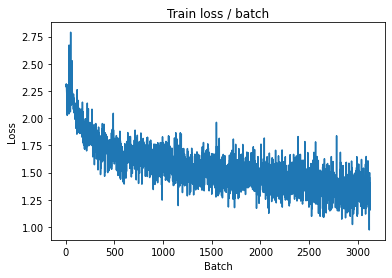

[TRAIN Batch 200/391]	Time 0.019s (0.049s)	Loss 1.3880 (1.3136)	Prec@1  51.6 ( 54.8)	Prec@5  94.5 ( 93.4)


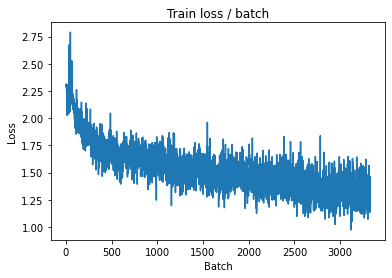


===============> Total time 18s	Avg loss 1.2858	Avg Prec@1 55.43 %	Avg Prec@5 93.86 %

[EVAL Batch 000/079]	Time 0.176s (0.176s)	Loss 1.4115 (1.4115)	Prec@1  54.7 ( 54.7)	Prec@5  93.0 ( 93.0)

===============> Total time 2s	Avg loss 1.2480	Avg Prec@1 56.31 %	Avg Prec@5 94.02 %



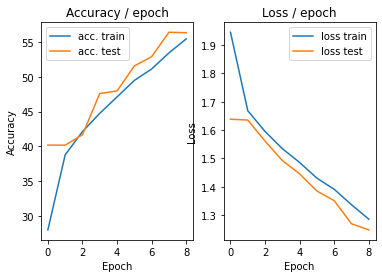

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.194s (0.194s)	Loss 1.3220 (1.3220)	Prec@1  53.1 ( 53.1)	Prec@5  94.5 ( 94.5)


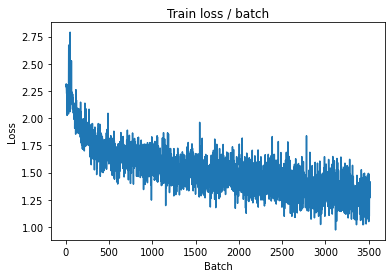

[TRAIN Batch 200/391]	Time 0.063s (0.048s)	Loss 1.2108 (1.2172)	Prec@1  56.2 ( 57.8)	Prec@5  92.2 ( 94.4)


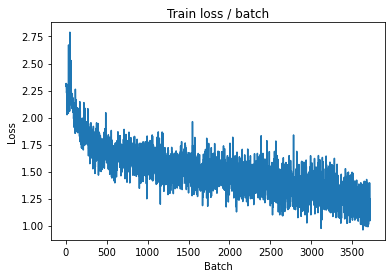


===============> Total time 18s	Avg loss 1.2317	Avg Prec@1 57.43 %	Avg Prec@5 94.18 %

[EVAL Batch 000/079]	Time 0.168s (0.168s)	Loss 1.1604 (1.1604)	Prec@1  61.7 ( 61.7)	Prec@5  91.4 ( 91.4)

===============> Total time 2s	Avg loss 1.2290	Avg Prec@1 57.53 %	Avg Prec@5 94.05 %



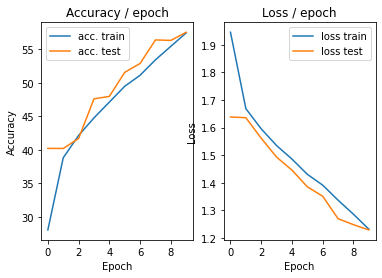

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.203s (0.203s)	Loss 1.1614 (1.1614)	Prec@1  63.3 ( 63.3)	Prec@5  97.7 ( 97.7)


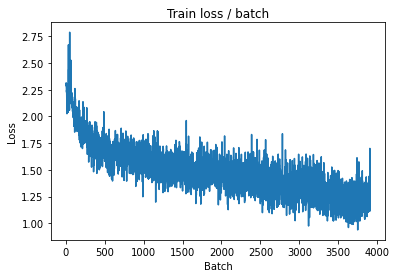

[TRAIN Batch 200/391]	Time 0.025s (0.047s)	Loss 1.1783 (1.2258)	Prec@1  56.2 ( 58.2)	Prec@5  94.5 ( 94.2)


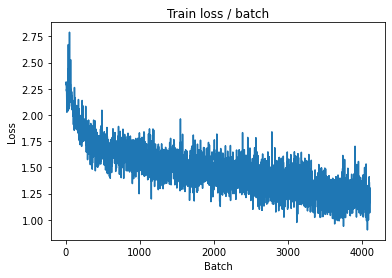


===============> Total time 18s	Avg loss 1.2096	Avg Prec@1 58.70 %	Avg Prec@5 94.54 %

[EVAL Batch 000/079]	Time 0.180s (0.180s)	Loss 1.2439 (1.2439)	Prec@1  62.5 ( 62.5)	Prec@5  95.3 ( 95.3)

===============> Total time 2s	Avg loss 1.1985	Avg Prec@1 59.61 %	Avg Prec@5 94.97 %



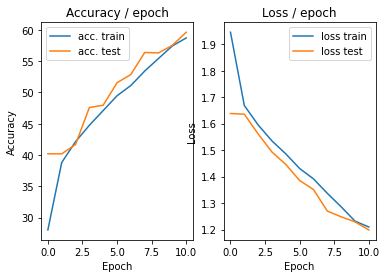

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.221s (0.221s)	Loss 1.1859 (1.1859)	Prec@1  57.8 ( 57.8)	Prec@5  96.1 ( 96.1)


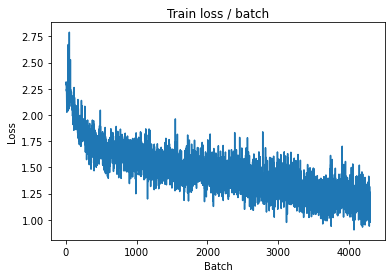

[TRAIN Batch 200/391]	Time 0.080s (0.046s)	Loss 1.1577 (1.1734)	Prec@1  58.6 ( 59.6)	Prec@5  93.8 ( 94.7)


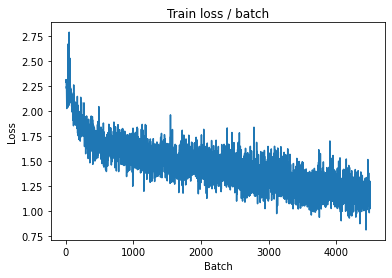


===============> Total time 18s	Avg loss 1.1718	Avg Prec@1 59.88 %	Avg Prec@5 94.88 %

[EVAL Batch 000/079]	Time 0.186s (0.186s)	Loss 1.2208 (1.2208)	Prec@1  60.9 ( 60.9)	Prec@5  94.5 ( 94.5)

===============> Total time 3s	Avg loss 1.1799	Avg Prec@1 58.86 %	Avg Prec@5 94.87 %



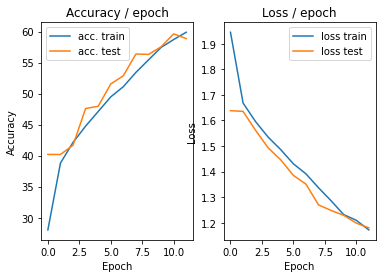

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.224s (0.224s)	Loss 1.0646 (1.0646)	Prec@1  62.5 ( 62.5)	Prec@5  96.1 ( 96.1)


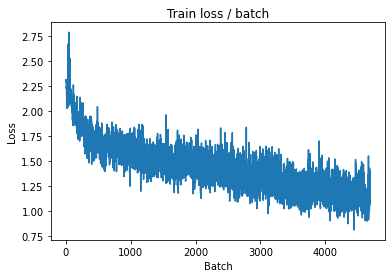

[TRAIN Batch 200/391]	Time 0.075s (0.047s)	Loss 1.1020 (1.1509)	Prec@1  66.4 ( 60.5)	Prec@5  95.3 ( 95.2)


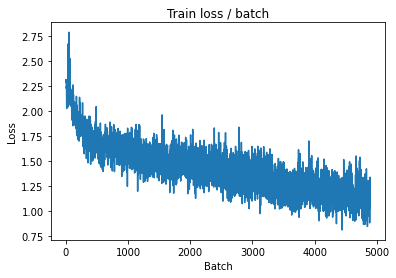


===============> Total time 17s	Avg loss 1.1448	Avg Prec@1 60.87 %	Avg Prec@5 95.17 %

[EVAL Batch 000/079]	Time 0.174s (0.174s)	Loss 0.9275 (0.9275)	Prec@1  65.6 ( 65.6)	Prec@5  94.5 ( 94.5)

===============> Total time 2s	Avg loss 1.1099	Avg Prec@1 62.78 %	Avg Prec@5 95.26 %



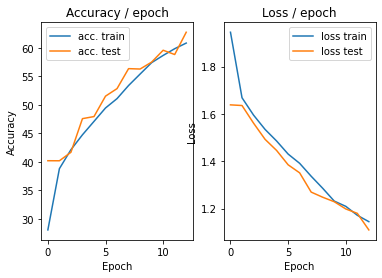

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.213s (0.213s)	Loss 1.2793 (1.2793)	Prec@1  59.4 ( 59.4)	Prec@5  93.8 ( 93.8)


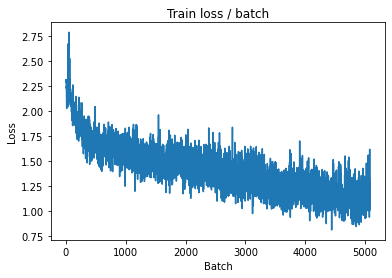

[TRAIN Batch 200/391]	Time 0.032s (0.047s)	Loss 1.0833 (1.1018)	Prec@1  62.5 ( 62.8)	Prec@5  93.8 ( 95.5)


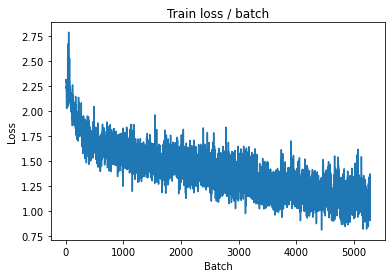


===============> Total time 18s	Avg loss 1.1017	Avg Prec@1 62.59 %	Avg Prec@5 95.44 %

[EVAL Batch 000/079]	Time 0.168s (0.168s)	Loss 1.0518 (1.0518)	Prec@1  65.6 ( 65.6)	Prec@5  95.3 ( 95.3)

===============> Total time 2s	Avg loss 1.0416	Avg Prec@1 64.88 %	Avg Prec@5 95.73 %



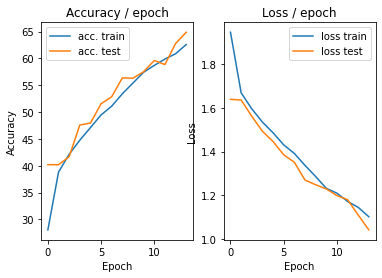

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.223s (0.223s)	Loss 1.0640 (1.0640)	Prec@1  67.2 ( 67.2)	Prec@5  95.3 ( 95.3)


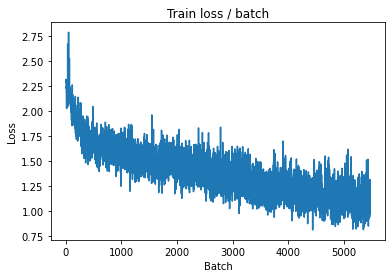

[TRAIN Batch 200/391]	Time 0.067s (0.048s)	Loss 0.9533 (1.0695)	Prec@1  68.0 ( 63.3)	Prec@5  95.3 ( 95.8)


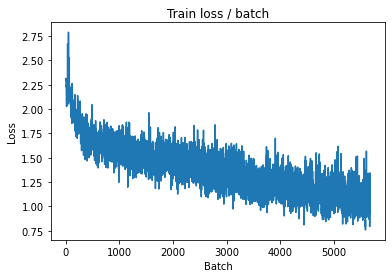


===============> Total time 18s	Avg loss 1.0702	Avg Prec@1 63.44 %	Avg Prec@5 95.69 %

[EVAL Batch 000/079]	Time 0.167s (0.167s)	Loss 1.0161 (1.0161)	Prec@1  66.4 ( 66.4)	Prec@5  94.5 ( 94.5)

===============> Total time 2s	Avg loss 1.0330	Avg Prec@1 65.21 %	Avg Prec@5 96.07 %



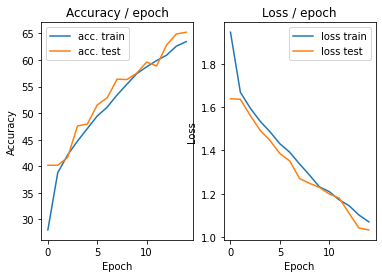

=== EPOCH 16 =====

[TRAIN Batch 000/391]	Time 0.213s (0.213s)	Loss 0.8262 (0.8262)	Prec@1  70.3 ( 70.3)	Prec@5  96.1 ( 96.1)


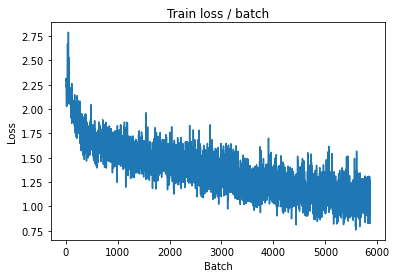

[TRAIN Batch 200/391]	Time 0.020s (0.047s)	Loss 1.1569 (1.0506)	Prec@1  62.5 ( 64.4)	Prec@5  93.0 ( 95.7)


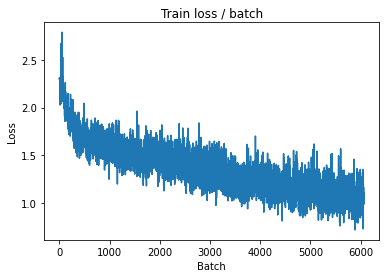


===============> Total time 18s	Avg loss 1.0378	Avg Prec@1 64.97 %	Avg Prec@5 95.89 %

[EVAL Batch 000/079]	Time 0.169s (0.169s)	Loss 1.1984 (1.1984)	Prec@1  63.3 ( 63.3)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 1.0533	Avg Prec@1 65.98 %	Avg Prec@5 96.03 %



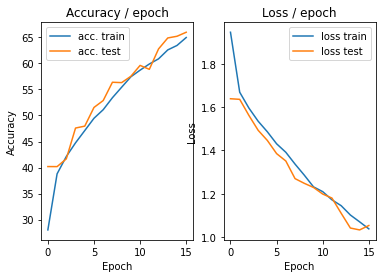

=== EPOCH 17 =====

[TRAIN Batch 000/391]	Time 0.208s (0.208s)	Loss 0.9275 (0.9275)	Prec@1  63.3 ( 63.3)	Prec@5  96.1 ( 96.1)


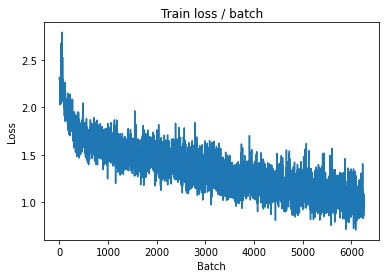

[TRAIN Batch 200/391]	Time 0.058s (0.047s)	Loss 1.0242 (1.0050)	Prec@1  63.3 ( 65.7)	Prec@5  94.5 ( 96.2)


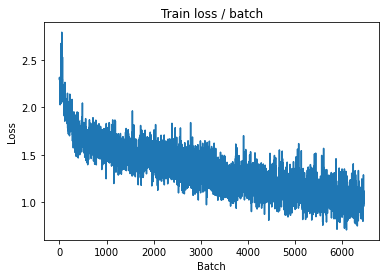


===============> Total time 18s	Avg loss 1.0013	Avg Prec@1 65.91 %	Avg Prec@5 96.15 %

[EVAL Batch 000/079]	Time 0.167s (0.167s)	Loss 0.8745 (0.8745)	Prec@1  71.1 ( 71.1)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 0.9958	Avg Prec@1 67.33 %	Avg Prec@5 95.92 %



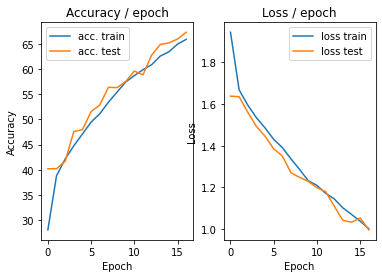

=== EPOCH 18 =====

[TRAIN Batch 000/391]	Time 0.180s (0.180s)	Loss 1.1242 (1.1242)	Prec@1  66.4 ( 66.4)	Prec@5  93.8 ( 93.8)


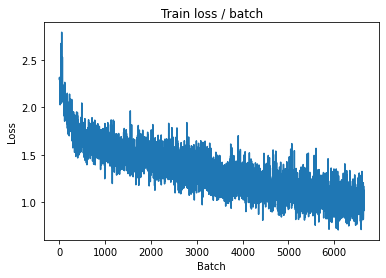

[TRAIN Batch 200/391]	Time 0.064s (0.048s)	Loss 1.0092 (0.9534)	Prec@1  73.4 ( 67.7)	Prec@5  95.3 ( 96.6)


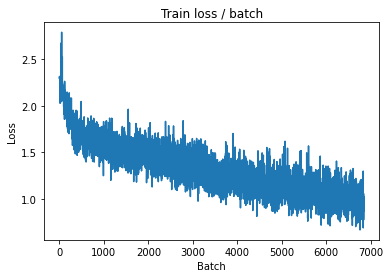


===============> Total time 18s	Avg loss 0.9731	Avg Prec@1 67.10 %	Avg Prec@5 96.47 %

[EVAL Batch 000/079]	Time 0.161s (0.161s)	Loss 0.8845 (0.8845)	Prec@1  64.8 ( 64.8)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 1.0227	Avg Prec@1 66.11 %	Avg Prec@5 96.50 %



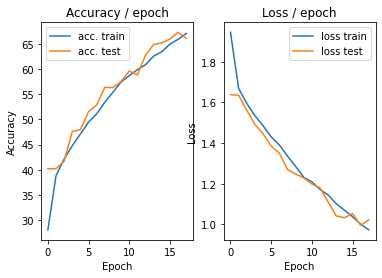

=== EPOCH 19 =====

[TRAIN Batch 000/391]	Time 0.216s (0.216s)	Loss 1.0167 (1.0167)	Prec@1  70.3 ( 70.3)	Prec@5  97.7 ( 97.7)


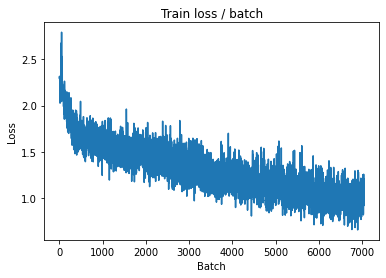

[TRAIN Batch 200/391]	Time 0.031s (0.048s)	Loss 1.0755 (0.9261)	Prec@1  60.9 ( 68.4)	Prec@5  94.5 ( 97.0)


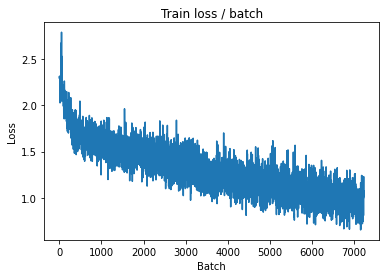


===============> Total time 18s	Avg loss 0.9377	Avg Prec@1 68.05 %	Avg Prec@5 96.72 %

[EVAL Batch 000/079]	Time 0.185s (0.185s)	Loss 0.9658 (0.9658)	Prec@1  68.0 ( 68.0)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.9636	Avg Prec@1 68.56 %	Avg Prec@5 96.62 %



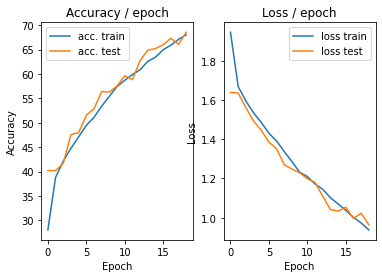

=== EPOCH 20 =====

[TRAIN Batch 000/391]	Time 0.209s (0.209s)	Loss 0.9337 (0.9337)	Prec@1  68.8 ( 68.8)	Prec@5  98.4 ( 98.4)


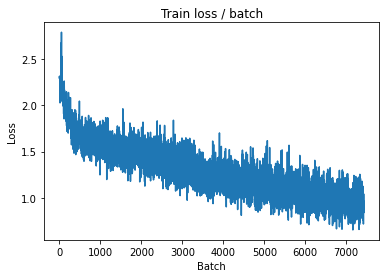

[TRAIN Batch 200/391]	Time 0.019s (0.048s)	Loss 0.9583 (0.9190)	Prec@1  63.3 ( 68.9)	Prec@5  96.9 ( 96.8)


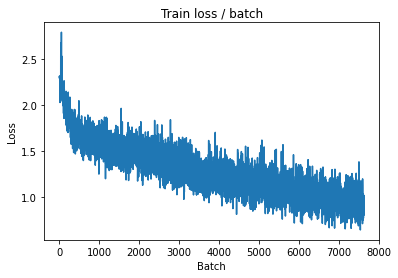


===============> Total time 18s	Avg loss 0.9096	Avg Prec@1 69.34 %	Avg Prec@5 96.83 %

[EVAL Batch 000/079]	Time 0.169s (0.169s)	Loss 0.9702 (0.9702)	Prec@1  70.3 ( 70.3)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 0.9730	Avg Prec@1 68.07 %	Avg Prec@5 96.37 %



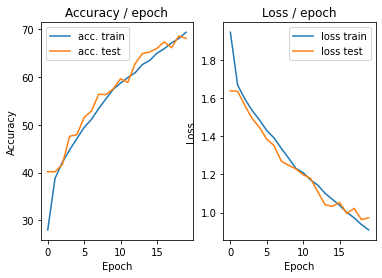

=== EPOCH 21 =====

[TRAIN Batch 000/391]	Time 0.212s (0.212s)	Loss 1.0020 (1.0020)	Prec@1  70.3 ( 70.3)	Prec@5  95.3 ( 95.3)


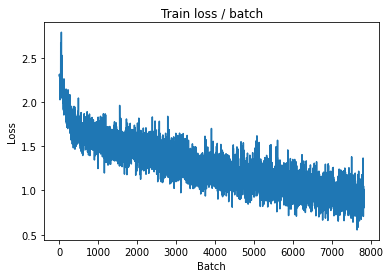

[TRAIN Batch 200/391]	Time 0.058s (0.047s)	Loss 1.0125 (0.8709)	Prec@1  61.7 ( 70.6)	Prec@5  96.9 ( 97.2)


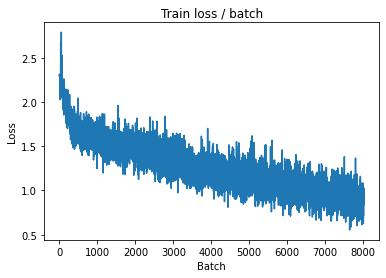


===============> Total time 18s	Avg loss 0.8740	Avg Prec@1 70.51 %	Avg Prec@5 97.19 %

[EVAL Batch 000/079]	Time 0.182s (0.182s)	Loss 0.9070 (0.9070)	Prec@1  70.3 ( 70.3)	Prec@5  95.3 ( 95.3)

===============> Total time 2s	Avg loss 0.9743	Avg Prec@1 68.55 %	Avg Prec@5 96.66 %



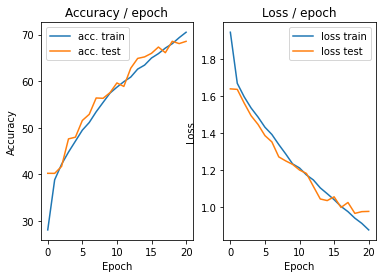

=== EPOCH 22 =====

[TRAIN Batch 000/391]	Time 0.207s (0.207s)	Loss 0.8529 (0.8529)	Prec@1  70.3 ( 70.3)	Prec@5  96.9 ( 96.9)


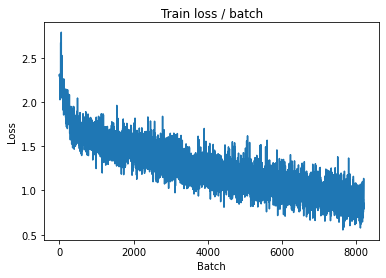

[TRAIN Batch 200/391]	Time 0.048s (0.046s)	Loss 0.8176 (0.8483)	Prec@1  70.3 ( 71.2)	Prec@5  97.7 ( 97.3)


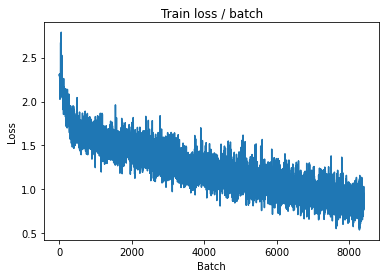


===============> Total time 17s	Avg loss 0.8465	Avg Prec@1 71.29 %	Avg Prec@5 97.40 %

[EVAL Batch 000/079]	Time 0.186s (0.186s)	Loss 1.0437 (1.0437)	Prec@1  63.3 ( 63.3)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.9644	Avg Prec@1 67.80 %	Avg Prec@5 96.72 %



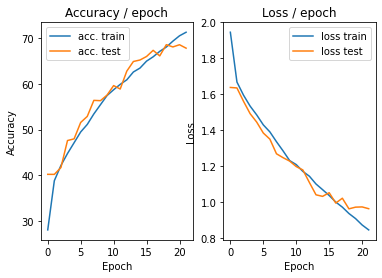

=== EPOCH 23 =====

[TRAIN Batch 000/391]	Time 0.222s (0.222s)	Loss 0.8323 (0.8323)	Prec@1  71.1 ( 71.1)	Prec@5  99.2 ( 99.2)


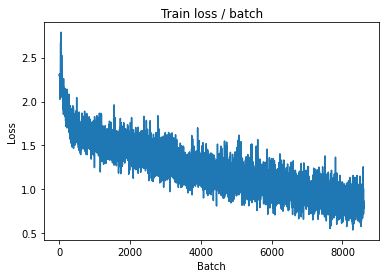

[TRAIN Batch 200/391]	Time 0.030s (0.045s)	Loss 0.9013 (0.8185)	Prec@1  67.2 ( 72.3)	Prec@5  96.9 ( 97.6)


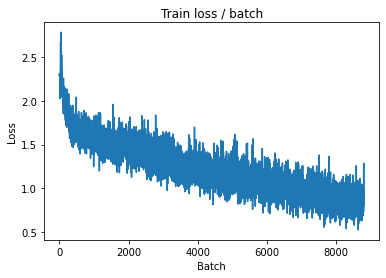


===============> Total time 17s	Avg loss 0.8221	Avg Prec@1 72.26 %	Avg Prec@5 97.57 %

[EVAL Batch 000/079]	Time 0.184s (0.184s)	Loss 0.8991 (0.8991)	Prec@1  72.7 ( 72.7)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.8930	Avg Prec@1 70.08 %	Avg Prec@5 97.04 %



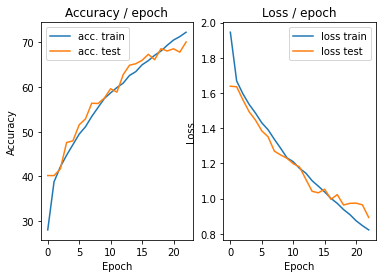

=== EPOCH 24 =====

[TRAIN Batch 000/391]	Time 0.224s (0.224s)	Loss 0.7349 (0.7349)	Prec@1  72.7 ( 72.7)	Prec@5  96.1 ( 96.1)


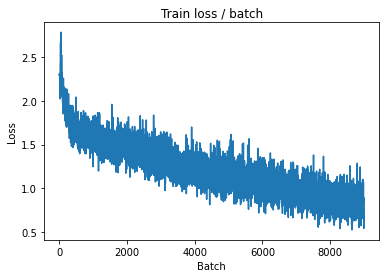

[TRAIN Batch 200/391]	Time 0.069s (0.048s)	Loss 0.8892 (0.7958)	Prec@1  67.2 ( 73.0)	Prec@5  98.4 ( 97.8)


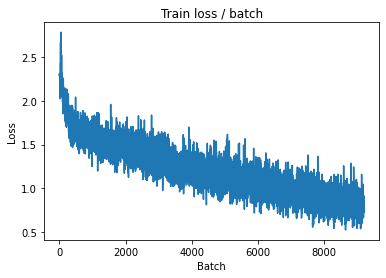


===============> Total time 18s	Avg loss 0.7984	Avg Prec@1 72.91 %	Avg Prec@5 97.68 %

[EVAL Batch 000/079]	Time 0.195s (0.195s)	Loss 0.8723 (0.8723)	Prec@1  72.7 ( 72.7)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.9181	Avg Prec@1 69.45 %	Avg Prec@5 96.93 %



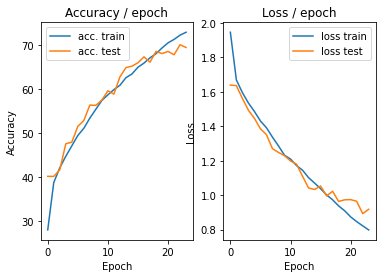

=== EPOCH 25 =====

[TRAIN Batch 000/391]	Time 0.218s (0.218s)	Loss 0.7982 (0.7982)	Prec@1  76.6 ( 76.6)	Prec@5  98.4 ( 98.4)


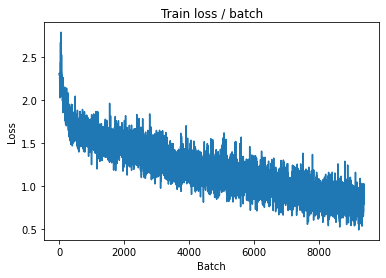

[TRAIN Batch 200/391]	Time 0.041s (0.048s)	Loss 0.6797 (0.7530)	Prec@1  78.9 ( 74.5)	Prec@5  96.9 ( 98.0)


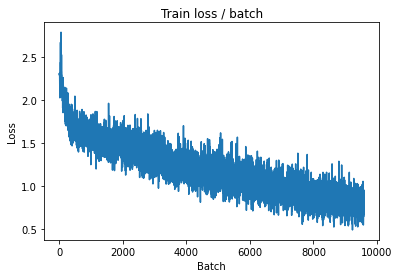


===============> Total time 18s	Avg loss 0.7611	Avg Prec@1 74.21 %	Avg Prec@5 97.88 %

[EVAL Batch 000/079]	Time 0.169s (0.169s)	Loss 0.7773 (0.7773)	Prec@1  73.4 ( 73.4)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.8310	Avg Prec@1 72.16 %	Avg Prec@5 97.24 %



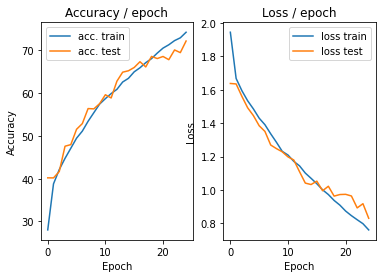

=== EPOCH 26 =====

[TRAIN Batch 000/391]	Time 0.221s (0.221s)	Loss 0.7192 (0.7192)	Prec@1  77.3 ( 77.3)	Prec@5  99.2 ( 99.2)


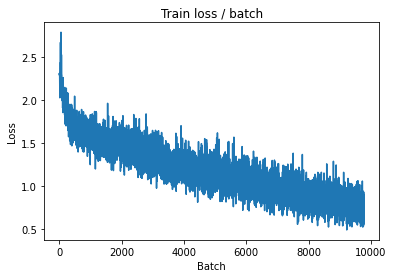

[TRAIN Batch 200/391]	Time 0.025s (0.047s)	Loss 0.9392 (0.7420)	Prec@1  66.4 ( 74.6)	Prec@5  96.9 ( 98.1)


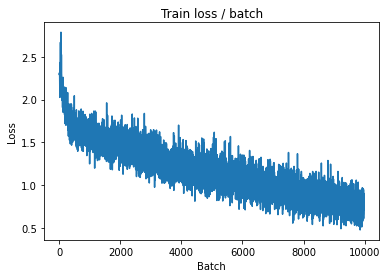


===============> Total time 18s	Avg loss 0.7389	Avg Prec@1 74.81 %	Avg Prec@5 98.10 %

[EVAL Batch 000/079]	Time 0.164s (0.164s)	Loss 0.7320 (0.7320)	Prec@1  74.2 ( 74.2)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.8284	Avg Prec@1 72.74 %	Avg Prec@5 97.40 %



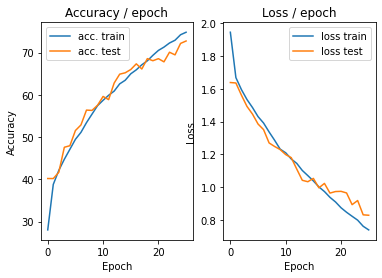

=== EPOCH 27 =====

[TRAIN Batch 000/391]	Time 0.204s (0.204s)	Loss 0.7529 (0.7529)	Prec@1  72.7 ( 72.7)	Prec@5  96.9 ( 96.9)


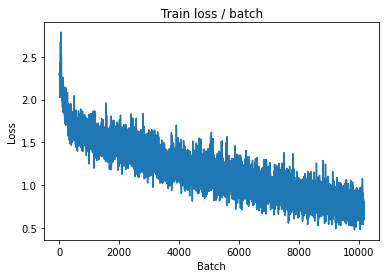

[TRAIN Batch 200/391]	Time 0.023s (0.047s)	Loss 0.8864 (0.7241)	Prec@1  72.7 ( 75.5)	Prec@5  98.4 ( 98.0)


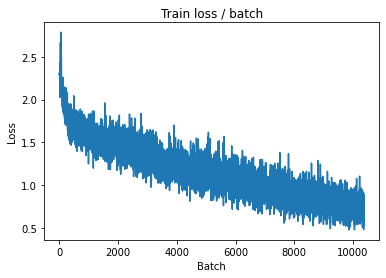


===============> Total time 17s	Avg loss 0.7315	Avg Prec@1 75.07 %	Avg Prec@5 98.04 %

[EVAL Batch 000/079]	Time 0.204s (0.204s)	Loss 0.7468 (0.7468)	Prec@1  73.4 ( 73.4)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.8202	Avg Prec@1 73.11 %	Avg Prec@5 97.54 %



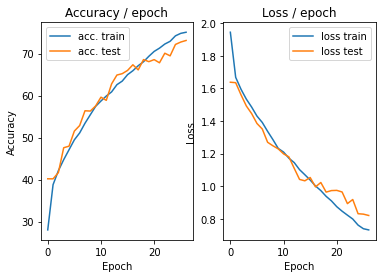

=== EPOCH 28 =====

[TRAIN Batch 000/391]	Time 0.222s (0.222s)	Loss 0.7303 (0.7303)	Prec@1  73.4 ( 73.4)	Prec@5 100.0 (100.0)


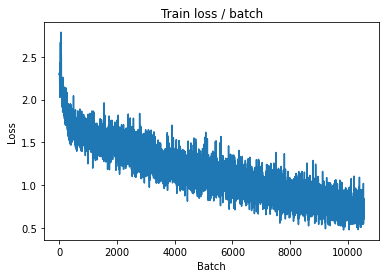

[TRAIN Batch 200/391]	Time 0.072s (0.049s)	Loss 0.7220 (0.7016)	Prec@1  75.8 ( 76.3)	Prec@5  98.4 ( 98.4)


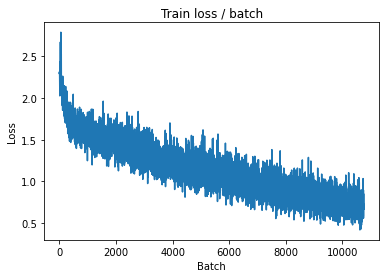


===============> Total time 18s	Avg loss 0.6987	Avg Prec@1 76.16 %	Avg Prec@5 98.37 %

[EVAL Batch 000/079]	Time 0.165s (0.165s)	Loss 0.8803 (0.8803)	Prec@1  72.7 ( 72.7)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.7998	Avg Prec@1 73.86 %	Avg Prec@5 97.61 %



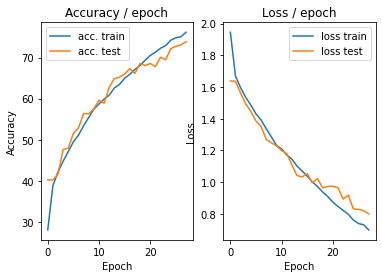

=== EPOCH 29 =====

[TRAIN Batch 000/391]	Time 0.216s (0.216s)	Loss 0.6032 (0.6032)	Prec@1  78.1 ( 78.1)	Prec@5  97.7 ( 97.7)


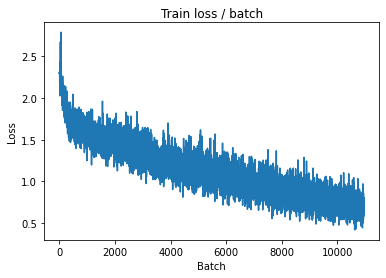

[TRAIN Batch 200/391]	Time 0.026s (0.048s)	Loss 0.7533 (0.6692)	Prec@1  71.9 ( 77.3)	Prec@5  98.4 ( 98.3)


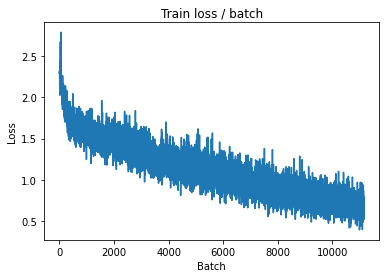


===============> Total time 18s	Avg loss 0.6668	Avg Prec@1 77.07 %	Avg Prec@5 98.36 %

[EVAL Batch 000/079]	Time 0.186s (0.186s)	Loss 0.7380 (0.7380)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.7996	Avg Prec@1 73.77 %	Avg Prec@5 97.41 %



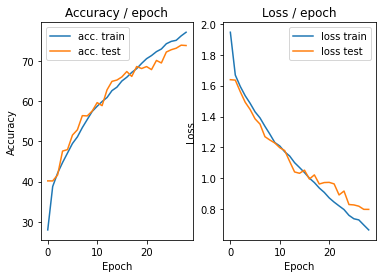

=== EPOCH 30 =====

[TRAIN Batch 000/391]	Time 0.191s (0.191s)	Loss 0.4916 (0.4916)	Prec@1  81.2 ( 81.2)	Prec@5  99.2 ( 99.2)


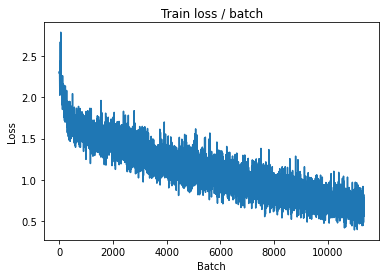

[TRAIN Batch 200/391]	Time 0.062s (0.047s)	Loss 0.6442 (0.6323)	Prec@1  78.1 ( 78.3)	Prec@5  99.2 ( 98.6)


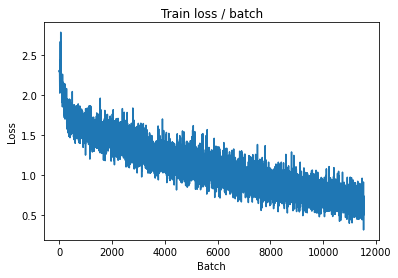


===============> Total time 18s	Avg loss 0.6432	Avg Prec@1 77.99 %	Avg Prec@5 98.50 %

[EVAL Batch 000/079]	Time 0.172s (0.172s)	Loss 0.7601 (0.7601)	Prec@1  75.0 ( 75.0)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.7955	Avg Prec@1 73.94 %	Avg Prec@5 97.49 %



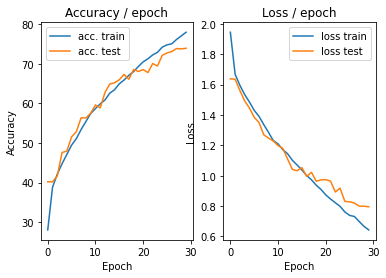

=== EPOCH 31 =====

[TRAIN Batch 000/391]	Time 0.191s (0.191s)	Loss 0.7350 (0.7350)	Prec@1  76.6 ( 76.6)	Prec@5  98.4 ( 98.4)


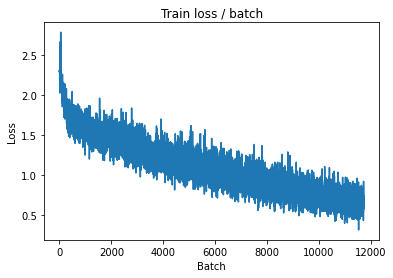

[TRAIN Batch 200/391]	Time 0.019s (0.047s)	Loss 0.6750 (0.6218)	Prec@1  76.6 ( 78.6)	Prec@5  97.7 ( 98.7)


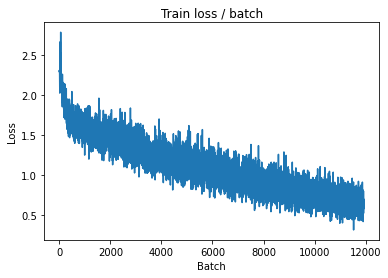


===============> Total time 18s	Avg loss 0.6286	Avg Prec@1 78.43 %	Avg Prec@5 98.62 %

[EVAL Batch 000/079]	Time 0.167s (0.167s)	Loss 0.7666 (0.7666)	Prec@1  72.7 ( 72.7)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.7697	Avg Prec@1 75.09 %	Avg Prec@5 97.75 %



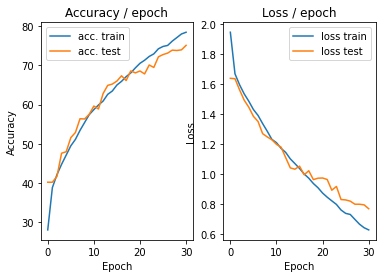

=== EPOCH 32 =====

[TRAIN Batch 000/391]	Time 0.226s (0.226s)	Loss 0.5029 (0.5029)	Prec@1  84.4 ( 84.4)	Prec@5 100.0 (100.0)


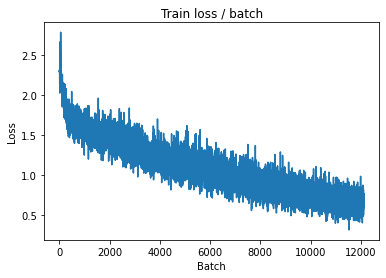

[TRAIN Batch 200/391]	Time 0.025s (0.047s)	Loss 0.6659 (0.5971)	Prec@1  81.2 ( 79.5)	Prec@5  99.2 ( 98.7)


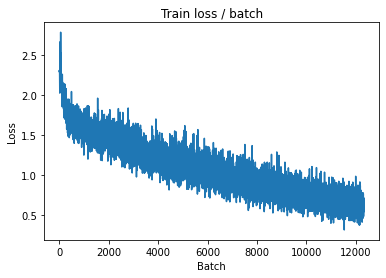


===============> Total time 18s	Avg loss 0.6000	Avg Prec@1 79.34 %	Avg Prec@5 98.72 %

[EVAL Batch 000/079]	Time 0.187s (0.187s)	Loss 0.6855 (0.6855)	Prec@1  77.3 ( 77.3)	Prec@5  96.9 ( 96.9)

===============> Total time 3s	Avg loss 0.7810	Avg Prec@1 74.69 %	Avg Prec@5 97.54 %



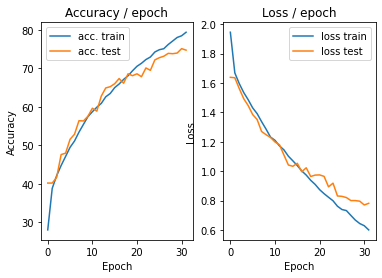

=== EPOCH 33 =====

[TRAIN Batch 000/391]	Time 0.203s (0.203s)	Loss 0.5991 (0.5991)	Prec@1  75.0 ( 75.0)	Prec@5  97.7 ( 97.7)


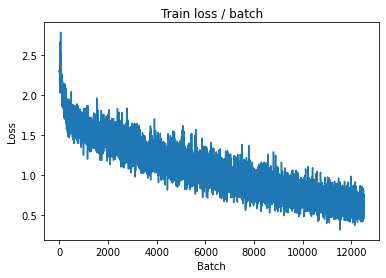

[TRAIN Batch 200/391]	Time 0.030s (0.048s)	Loss 0.5306 (0.5794)	Prec@1  81.2 ( 80.3)	Prec@5  98.4 ( 98.7)


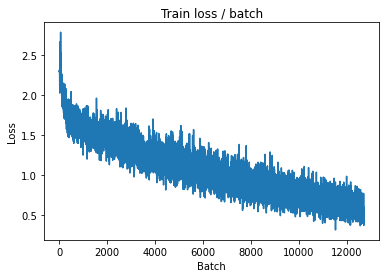


===============> Total time 18s	Avg loss 0.5779	Avg Prec@1 80.29 %	Avg Prec@5 98.71 %

[EVAL Batch 000/079]	Time 0.183s (0.183s)	Loss 0.6787 (0.6787)	Prec@1  79.7 ( 79.7)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.7721	Avg Prec@1 75.85 %	Avg Prec@5 98.01 %



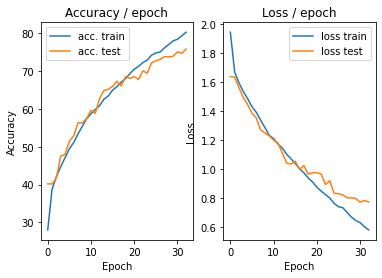

=== EPOCH 34 =====

[TRAIN Batch 000/391]	Time 0.211s (0.211s)	Loss 0.3192 (0.3192)	Prec@1  90.6 ( 90.6)	Prec@5 100.0 (100.0)


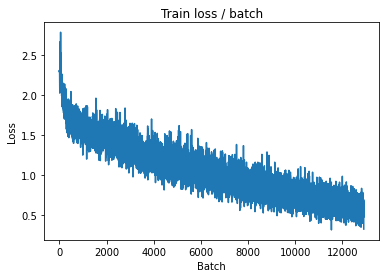

[TRAIN Batch 200/391]	Time 0.030s (0.046s)	Loss 0.5510 (0.5566)	Prec@1  78.9 ( 80.9)	Prec@5 100.0 ( 98.7)


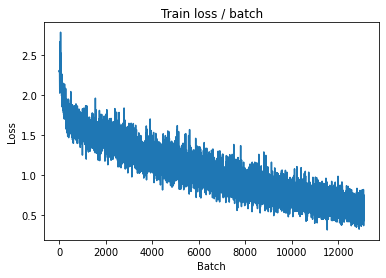


===============> Total time 18s	Avg loss 0.5638	Avg Prec@1 80.66 %	Avg Prec@5 98.78 %

[EVAL Batch 000/079]	Time 0.181s (0.181s)	Loss 0.6975 (0.6975)	Prec@1  77.3 ( 77.3)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.7884	Avg Prec@1 75.10 %	Avg Prec@5 97.79 %



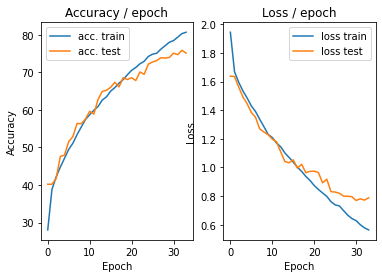

=== EPOCH 35 =====

[TRAIN Batch 000/391]	Time 0.211s (0.211s)	Loss 0.5226 (0.5226)	Prec@1  84.4 ( 84.4)	Prec@5 100.0 (100.0)


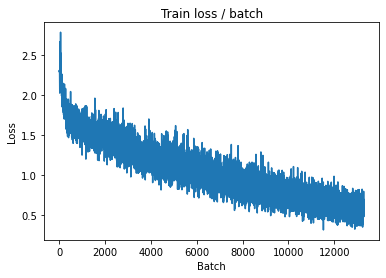

[TRAIN Batch 200/391]	Time 0.025s (0.046s)	Loss 0.3277 (0.5414)	Prec@1  88.3 ( 81.3)	Prec@5 100.0 ( 98.9)


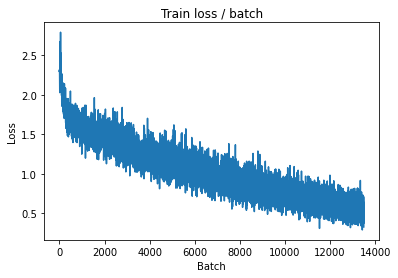


===============> Total time 17s	Avg loss 0.5426	Avg Prec@1 81.16 %	Avg Prec@5 98.98 %

[EVAL Batch 000/079]	Time 0.199s (0.199s)	Loss 0.6372 (0.6372)	Prec@1  82.0 ( 82.0)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.7732	Avg Prec@1 75.62 %	Avg Prec@5 97.81 %



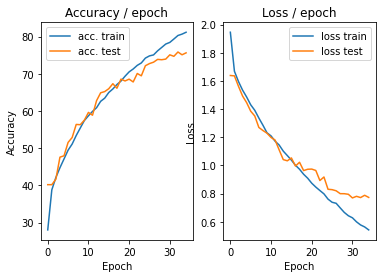

=== EPOCH 36 =====

[TRAIN Batch 000/391]	Time 0.200s (0.200s)	Loss 0.5783 (0.5783)	Prec@1  81.2 ( 81.2)	Prec@5  99.2 ( 99.2)


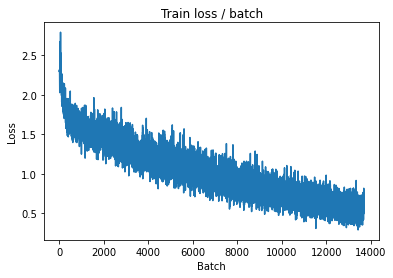

[TRAIN Batch 200/391]	Time 0.080s (0.047s)	Loss 0.4093 (0.5269)	Prec@1  83.6 ( 81.6)	Prec@5  99.2 ( 99.1)


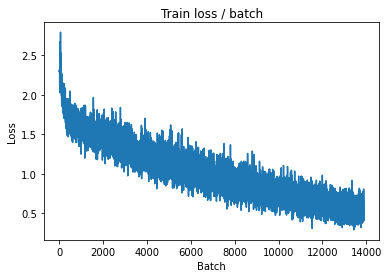


===============> Total time 18s	Avg loss 0.5216	Avg Prec@1 81.84 %	Avg Prec@5 99.14 %

[EVAL Batch 000/079]	Time 0.204s (0.204s)	Loss 0.7723 (0.7723)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.7576	Avg Prec@1 76.24 %	Avg Prec@5 98.15 %



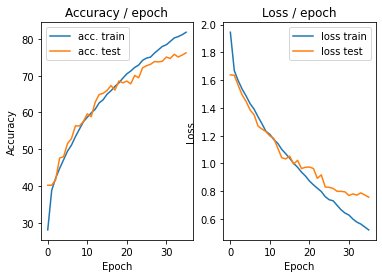

=== EPOCH 37 =====

[TRAIN Batch 000/391]	Time 0.240s (0.240s)	Loss 0.5014 (0.5014)	Prec@1  83.6 ( 83.6)	Prec@5  98.4 ( 98.4)


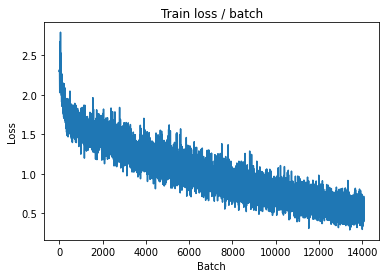

[TRAIN Batch 200/391]	Time 0.019s (0.047s)	Loss 0.4416 (0.4855)	Prec@1  82.8 ( 83.1)	Prec@5  98.4 ( 99.2)


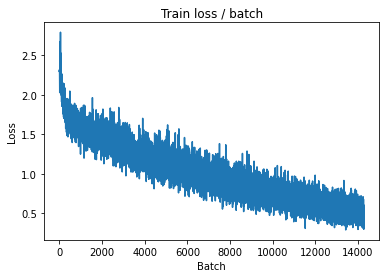


===============> Total time 18s	Avg loss 0.5027	Avg Prec@1 82.59 %	Avg Prec@5 99.21 %

[EVAL Batch 000/079]	Time 0.165s (0.165s)	Loss 0.6205 (0.6205)	Prec@1  82.8 ( 82.8)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.7625	Avg Prec@1 76.24 %	Avg Prec@5 98.02 %



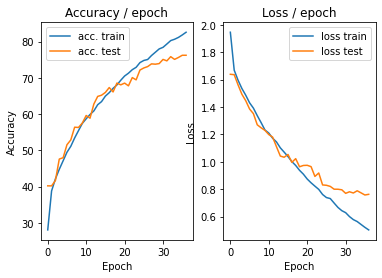

=== EPOCH 38 =====

[TRAIN Batch 000/391]	Time 0.222s (0.222s)	Loss 0.6577 (0.6577)	Prec@1  78.1 ( 78.1)	Prec@5  99.2 ( 99.2)


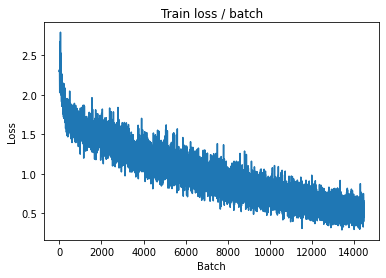

[TRAIN Batch 200/391]	Time 0.022s (0.046s)	Loss 0.5634 (0.4819)	Prec@1  80.5 ( 83.4)	Prec@5  97.7 ( 99.2)


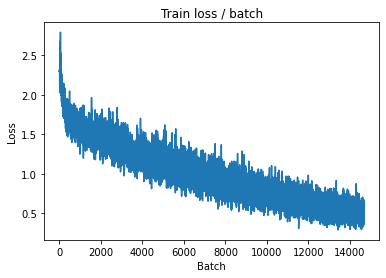


===============> Total time 18s	Avg loss 0.4895	Avg Prec@1 83.28 %	Avg Prec@5 99.15 %

[EVAL Batch 000/079]	Time 0.189s (0.189s)	Loss 0.6151 (0.6151)	Prec@1  81.2 ( 81.2)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.7478	Avg Prec@1 76.78 %	Avg Prec@5 97.96 %



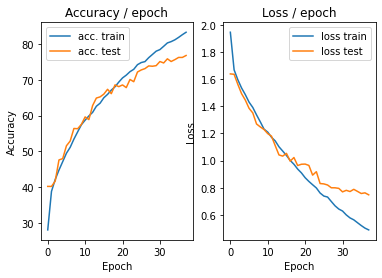

=== EPOCH 39 =====

[TRAIN Batch 000/391]	Time 0.208s (0.208s)	Loss 0.5165 (0.5165)	Prec@1  83.6 ( 83.6)	Prec@5  97.7 ( 97.7)


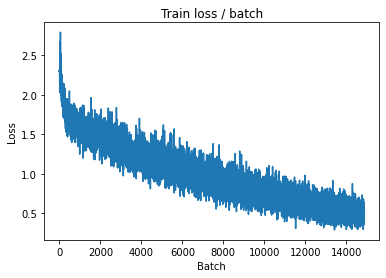

[TRAIN Batch 200/391]	Time 0.070s (0.046s)	Loss 0.4010 (0.4619)	Prec@1  85.9 ( 83.9)	Prec@5  99.2 ( 99.2)


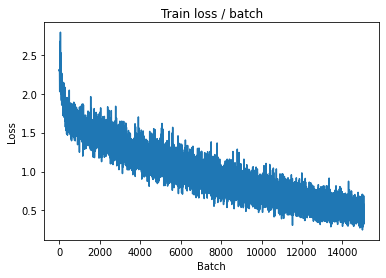


===============> Total time 17s	Avg loss 0.4673	Avg Prec@1 83.82 %	Avg Prec@5 99.21 %

[EVAL Batch 000/079]	Time 0.184s (0.184s)	Loss 0.6947 (0.6947)	Prec@1  80.5 ( 80.5)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.7450	Avg Prec@1 77.69 %	Avg Prec@5 98.19 %



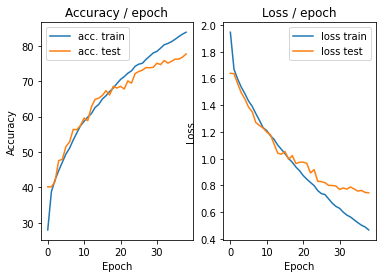

=== EPOCH 40 =====

[TRAIN Batch 000/391]	Time 0.241s (0.241s)	Loss 0.5233 (0.5233)	Prec@1  84.4 ( 84.4)	Prec@5  99.2 ( 99.2)


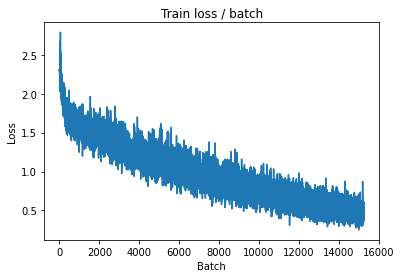

[TRAIN Batch 200/391]	Time 0.029s (0.049s)	Loss 0.5085 (0.4438)	Prec@1  85.2 ( 84.6)	Prec@5 100.0 ( 99.4)


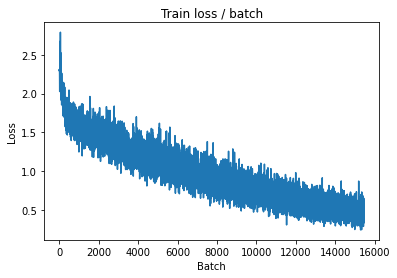


===============> Total time 18s	Avg loss 0.4517	Avg Prec@1 84.35 %	Avg Prec@5 99.38 %

[EVAL Batch 000/079]	Time 0.192s (0.192s)	Loss 0.6894 (0.6894)	Prec@1  76.6 ( 76.6)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.7693	Avg Prec@1 76.84 %	Avg Prec@5 97.97 %



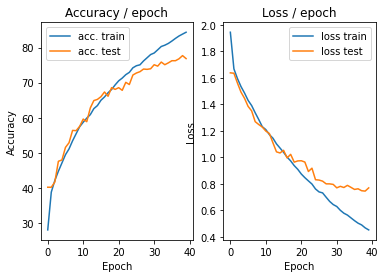

=== EPOCH 41 =====

[TRAIN Batch 000/391]	Time 0.233s (0.233s)	Loss 0.4823 (0.4823)	Prec@1  87.5 ( 87.5)	Prec@5  99.2 ( 99.2)


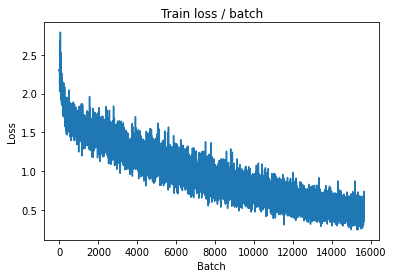

[TRAIN Batch 200/391]	Time 0.068s (0.046s)	Loss 0.3503 (0.4330)	Prec@1  83.6 ( 84.9)	Prec@5 100.0 ( 99.4)


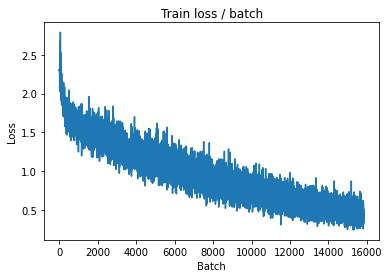


===============> Total time 17s	Avg loss 0.4437	Avg Prec@1 84.51 %	Avg Prec@5 99.39 %

[EVAL Batch 000/079]	Time 0.188s (0.188s)	Loss 0.6694 (0.6694)	Prec@1  81.2 ( 81.2)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.7522	Avg Prec@1 77.04 %	Avg Prec@5 98.13 %



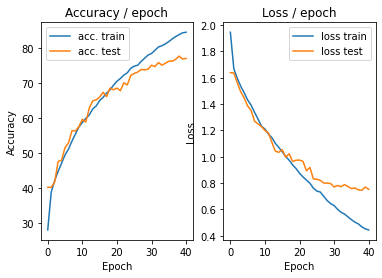

=== EPOCH 42 =====

[TRAIN Batch 000/391]	Time 0.227s (0.227s)	Loss 0.4592 (0.4592)	Prec@1  83.6 ( 83.6)	Prec@5 100.0 (100.0)


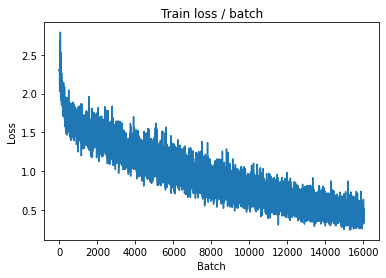

[TRAIN Batch 200/391]	Time 0.075s (0.047s)	Loss 0.4222 (0.4253)	Prec@1  82.8 ( 85.2)	Prec@5 100.0 ( 99.4)


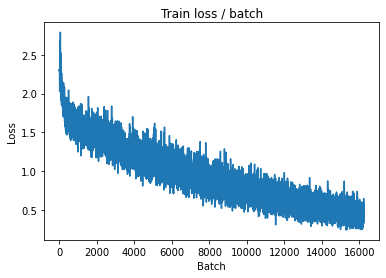


===============> Total time 17s	Avg loss 0.4285	Avg Prec@1 85.10 %	Avg Prec@5 99.39 %

[EVAL Batch 000/079]	Time 0.188s (0.188s)	Loss 0.5790 (0.5790)	Prec@1  83.6 ( 83.6)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.7634	Avg Prec@1 77.67 %	Avg Prec@5 98.16 %



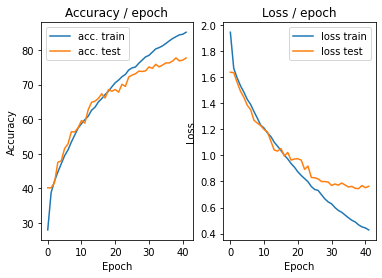

=== EPOCH 43 =====

[TRAIN Batch 000/391]	Time 0.219s (0.219s)	Loss 0.3851 (0.3851)	Prec@1  89.8 ( 89.8)	Prec@5  98.4 ( 98.4)


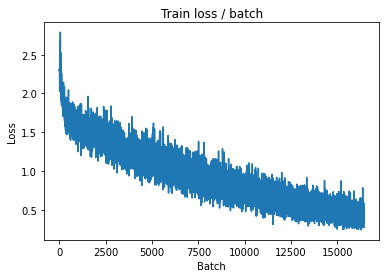

[TRAIN Batch 200/391]	Time 0.028s (0.046s)	Loss 0.3233 (0.3930)	Prec@1  92.2 ( 86.4)	Prec@5  99.2 ( 99.5)


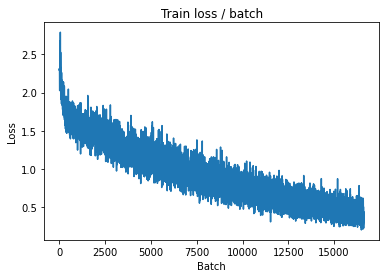


===============> Total time 18s	Avg loss 0.4055	Avg Prec@1 86.02 %	Avg Prec@5 99.48 %

[EVAL Batch 000/079]	Time 0.201s (0.201s)	Loss 0.6129 (0.6129)	Prec@1  82.8 ( 82.8)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.7580	Avg Prec@1 77.43 %	Avg Prec@5 98.21 %



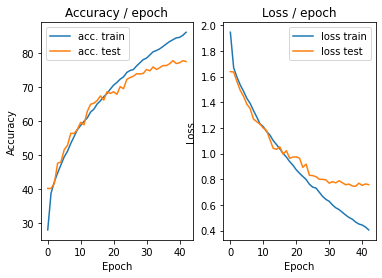

=== EPOCH 44 =====

[TRAIN Batch 000/391]	Time 0.220s (0.220s)	Loss 0.3818 (0.3818)	Prec@1  85.9 ( 85.9)	Prec@5 100.0 (100.0)


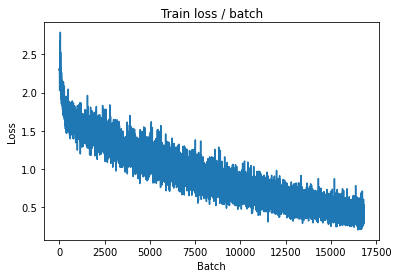

[TRAIN Batch 200/391]	Time 0.019s (0.050s)	Loss 0.2755 (0.3903)	Prec@1  89.8 ( 86.4)	Prec@5 100.0 ( 99.5)


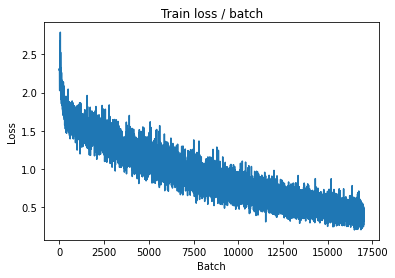


===============> Total time 19s	Avg loss 0.3924	Avg Prec@1 86.38 %	Avg Prec@5 99.53 %

[EVAL Batch 000/079]	Time 0.203s (0.203s)	Loss 0.6380 (0.6380)	Prec@1  83.6 ( 83.6)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.7691	Avg Prec@1 77.19 %	Avg Prec@5 98.12 %



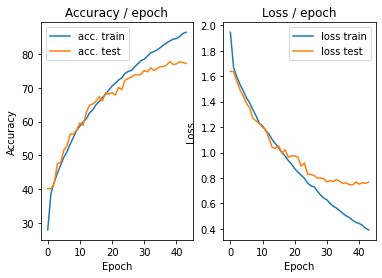

=== EPOCH 45 =====

[TRAIN Batch 000/391]	Time 0.232s (0.232s)	Loss 0.3119 (0.3119)	Prec@1  90.6 ( 90.6)	Prec@5  99.2 ( 99.2)


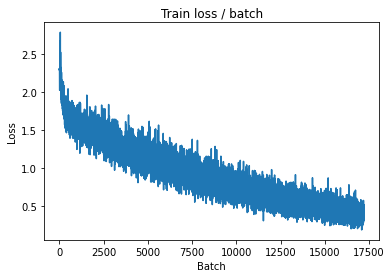

[TRAIN Batch 200/391]	Time 0.019s (0.048s)	Loss 0.5269 (0.3750)	Prec@1  84.4 ( 87.1)	Prec@5  99.2 ( 99.5)


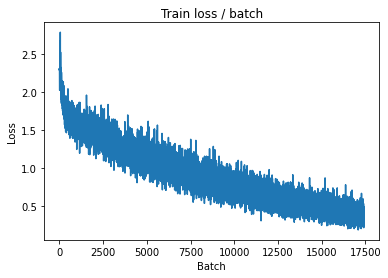


===============> Total time 18s	Avg loss 0.3783	Avg Prec@1 86.98 %	Avg Prec@5 99.48 %

[EVAL Batch 000/079]	Time 0.183s (0.183s)	Loss 0.6445 (0.6445)	Prec@1  82.0 ( 82.0)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.7647	Avg Prec@1 77.01 %	Avg Prec@5 98.16 %



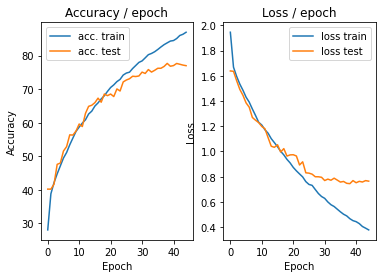

=== EPOCH 46 =====

[TRAIN Batch 000/391]	Time 0.227s (0.227s)	Loss 0.2503 (0.2503)	Prec@1  90.6 ( 90.6)	Prec@5 100.0 (100.0)


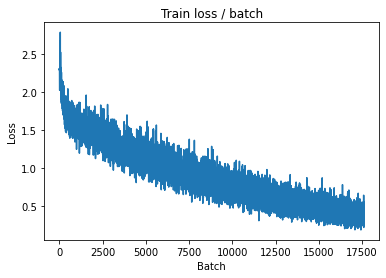

[TRAIN Batch 200/391]	Time 0.051s (0.048s)	Loss 0.4038 (0.3717)	Prec@1  85.2 ( 87.0)	Prec@5  99.2 ( 99.6)


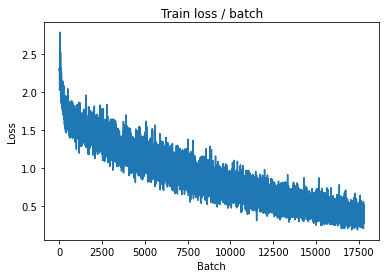


===============> Total time 18s	Avg loss 0.3663	Avg Prec@1 87.25 %	Avg Prec@5 99.62 %

[EVAL Batch 000/079]	Time 0.199s (0.199s)	Loss 0.6405 (0.6405)	Prec@1  84.4 ( 84.4)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.7645	Avg Prec@1 77.89 %	Avg Prec@5 98.21 %



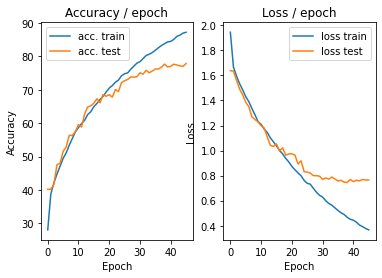

=== EPOCH 47 =====

[TRAIN Batch 000/391]	Time 0.220s (0.220s)	Loss 0.4659 (0.4659)	Prec@1  82.0 ( 82.0)	Prec@5  99.2 ( 99.2)


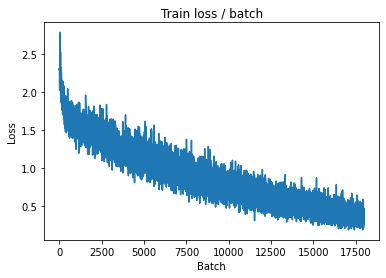

[TRAIN Batch 200/391]	Time 0.066s (0.048s)	Loss 0.3252 (0.3509)	Prec@1  89.8 ( 87.9)	Prec@5 100.0 ( 99.7)


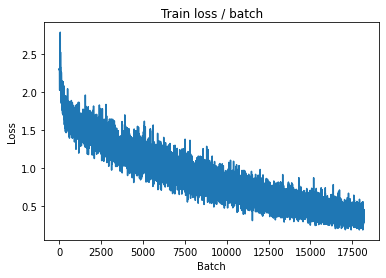


===============> Total time 18s	Avg loss 0.3518	Avg Prec@1 87.66 %	Avg Prec@5 99.67 %

[EVAL Batch 000/079]	Time 0.216s (0.216s)	Loss 0.6471 (0.6471)	Prec@1  79.7 ( 79.7)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.7724	Avg Prec@1 78.03 %	Avg Prec@5 98.10 %



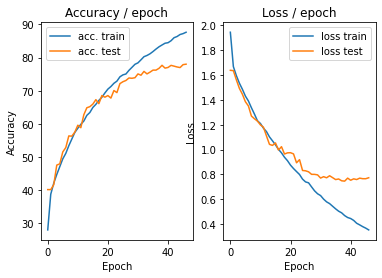

=== EPOCH 48 =====

[TRAIN Batch 000/391]	Time 0.246s (0.246s)	Loss 0.3244 (0.3244)	Prec@1  91.4 ( 91.4)	Prec@5  99.2 ( 99.2)


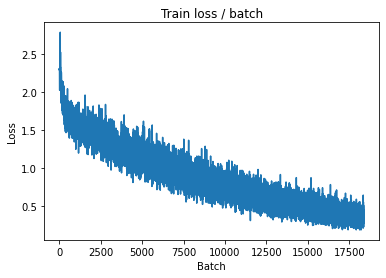

[TRAIN Batch 200/391]	Time 0.071s (0.049s)	Loss 0.2746 (0.3385)	Prec@1  89.1 ( 88.1)	Prec@5 100.0 ( 99.7)


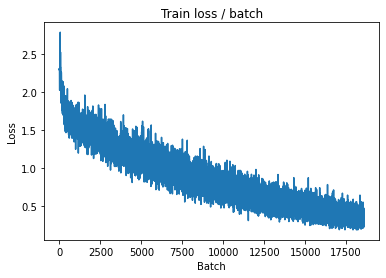


===============> Total time 18s	Avg loss 0.3437	Avg Prec@1 87.98 %	Avg Prec@5 99.63 %

[EVAL Batch 000/079]	Time 0.193s (0.193s)	Loss 0.6837 (0.6837)	Prec@1  81.2 ( 81.2)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.7885	Avg Prec@1 77.55 %	Avg Prec@5 98.16 %



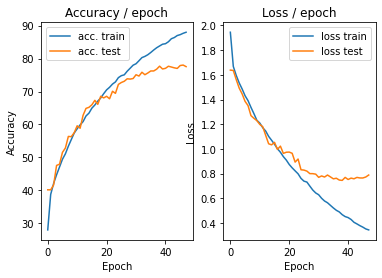

=== EPOCH 49 =====

[TRAIN Batch 000/391]	Time 0.235s (0.235s)	Loss 0.5051 (0.5051)	Prec@1  82.0 ( 82.0)	Prec@5 100.0 (100.0)


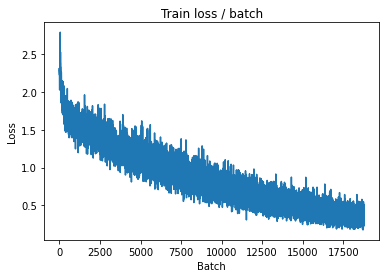

[TRAIN Batch 200/391]	Time 0.090s (0.049s)	Loss 0.4473 (0.3260)	Prec@1  86.7 ( 88.8)	Prec@5 100.0 ( 99.6)


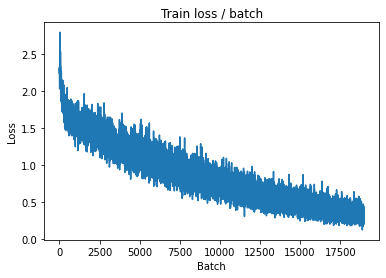


===============> Total time 18s	Avg loss 0.3323	Avg Prec@1 88.56 %	Avg Prec@5 99.62 %

[EVAL Batch 000/079]	Time 0.193s (0.193s)	Loss 0.6115 (0.6115)	Prec@1  82.8 ( 82.8)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.7787	Avg Prec@1 78.33 %	Avg Prec@5 98.30 %



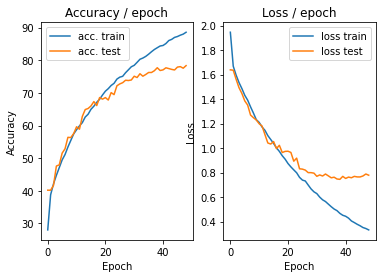

=== EPOCH 50 =====

[TRAIN Batch 000/391]	Time 0.241s (0.241s)	Loss 0.3547 (0.3547)	Prec@1  88.3 ( 88.3)	Prec@5 100.0 (100.0)


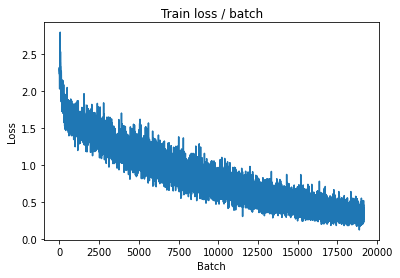

[TRAIN Batch 200/391]	Time 0.070s (0.047s)	Loss 0.2513 (0.3131)	Prec@1  93.0 ( 89.2)	Prec@5 100.0 ( 99.7)


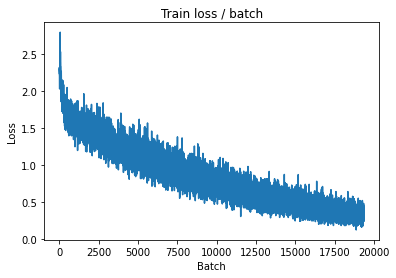


===============> Total time 18s	Avg loss 0.3171	Avg Prec@1 89.13 %	Avg Prec@5 99.68 %

[EVAL Batch 000/079]	Time 0.181s (0.181s)	Loss 0.5728 (0.5728)	Prec@1  83.6 ( 83.6)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.7978	Avg Prec@1 78.13 %	Avg Prec@5 98.34 %



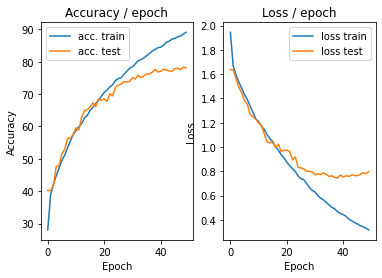

=== EPOCH 51 =====

[TRAIN Batch 000/391]	Time 0.208s (0.208s)	Loss 0.4279 (0.4279)	Prec@1  85.2 ( 85.2)	Prec@5  99.2 ( 99.2)


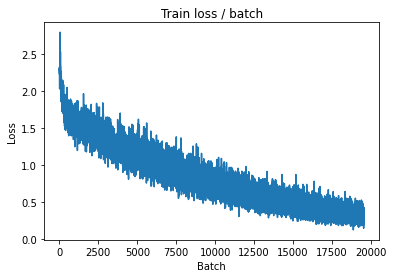

[TRAIN Batch 200/391]	Time 0.050s (0.047s)	Loss 0.2648 (0.3137)	Prec@1  89.8 ( 89.0)	Prec@5 100.0 ( 99.7)


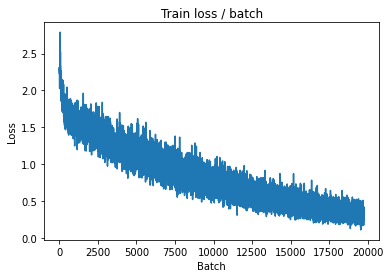


===============> Total time 18s	Avg loss 0.3092	Avg Prec@1 89.08 %	Avg Prec@5 99.72 %

[EVAL Batch 000/079]	Time 0.180s (0.180s)	Loss 0.7142 (0.7142)	Prec@1  79.7 ( 79.7)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.7942	Avg Prec@1 77.79 %	Avg Prec@5 98.22 %



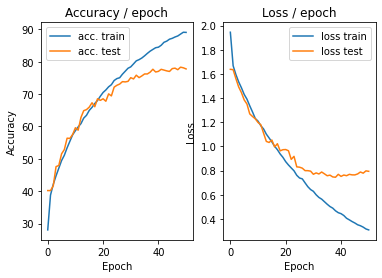

In [11]:
main(128, 0.1, epochs=51, cuda=True)

## **CIFAR-10 : Dropout**

In [15]:
#Classe ConvNet avec l'architecture donnée
class ConvNet2(nn.Module):
    """
    This class defines the structure of the neural network
    """

    def __init__(self):
        super(ConvNet2, self).__init__()
        # We first define the convolution and pooling layers as a features extractor
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(32, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(64, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0, ceil_mode=True)
        )
        # We then define fully connected layers as a classifier
        self.classifier = nn.Sequential(
            nn.Linear(1024, 1000), #64 * 4 * 4 (4 pcq 32 divisé par 8)
            nn.ReLU(),
            nn.Dropout(),
            nn.Linear(1000, 10),
            #nn.Softmax()
            # Reminder: The softmax is included in the loss, do not put it here
        )

    # Method called when we apply the network to an input batch
    def forward(self, input):
        bsize = input.size(0) # batch size
        output = self.features(input) # output of the conv layers
        output = output.view(bsize, -1) # we flatten the 2D feature maps into one 1D vector for each input
        output = self.classifier(output) # we compute the output of the fc layers
        return output

Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.210s (0.210s)	Loss 2.3060 (2.3060)	Prec@1   6.2 (  6.2)	Prec@5  42.2 ( 42.2)


<Figure size 432x288 with 0 Axes>

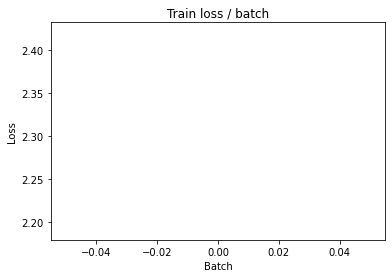

[TRAIN Batch 200/391]	Time 0.070s (0.047s)	Loss 1.8318 (2.0785)	Prec@1  32.0 ( 23.4)	Prec@5  85.9 ( 76.3)


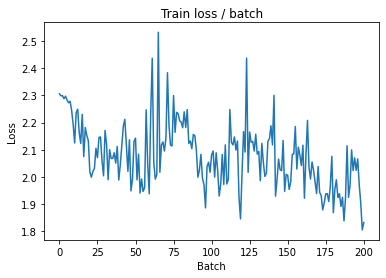


===============> Total time 18s	Avg loss 1.9732	Avg Prec@1 27.32 %	Avg Prec@5 79.97 %

[EVAL Batch 000/079]	Time 0.169s (0.169s)	Loss 1.7062 (1.7062)	Prec@1  39.1 ( 39.1)	Prec@5  85.9 ( 85.9)

===============> Total time 2s	Avg loss 1.7583	Avg Prec@1 36.07 %	Avg Prec@5 86.06 %



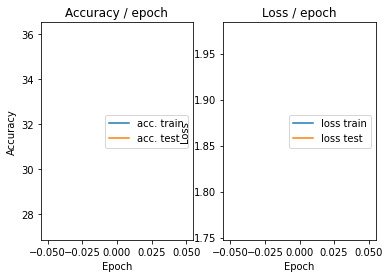

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.219s (0.219s)	Loss 1.8199 (1.8199)	Prec@1  29.7 ( 29.7)	Prec@5  86.7 ( 86.7)


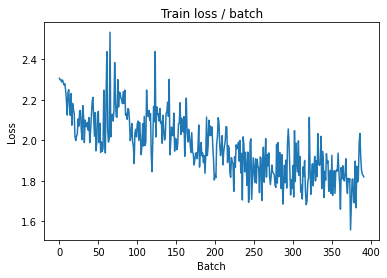

[TRAIN Batch 200/391]	Time 0.075s (0.048s)	Loss 1.8882 (1.8796)	Prec@1  34.4 ( 31.2)	Prec@5  85.9 ( 83.4)


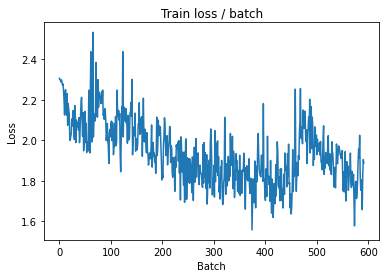


===============> Total time 18s	Avg loss 1.8368	Avg Prec@1 32.88 %	Avg Prec@5 84.60 %

[EVAL Batch 000/079]	Time 0.183s (0.183s)	Loss 1.6924 (1.6924)	Prec@1  40.6 ( 40.6)	Prec@5  88.3 ( 88.3)

===============> Total time 2s	Avg loss 1.6968	Avg Prec@1 37.13 %	Avg Prec@5 87.84 %



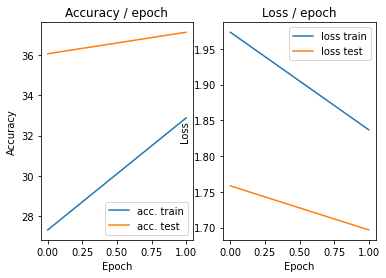

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.201s (0.201s)	Loss 1.7891 (1.7891)	Prec@1  32.0 ( 32.0)	Prec@5  90.6 ( 90.6)


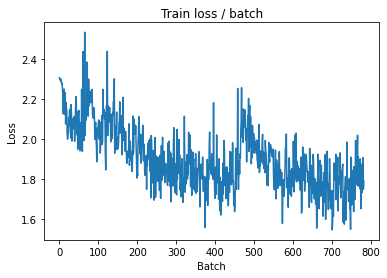

[TRAIN Batch 200/391]	Time 0.075s (0.048s)	Loss 1.7660 (1.7704)	Prec@1  32.8 ( 35.2)	Prec@5  86.7 ( 86.6)


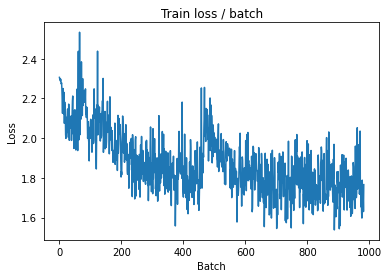


===============> Total time 18s	Avg loss 1.7625	Avg Prec@1 35.46 %	Avg Prec@5 86.62 %

[EVAL Batch 000/079]	Time 0.173s (0.173s)	Loss 1.7106 (1.7106)	Prec@1  40.6 ( 40.6)	Prec@5  86.7 ( 86.7)

===============> Total time 2s	Avg loss 1.6890	Avg Prec@1 38.68 %	Avg Prec@5 88.07 %



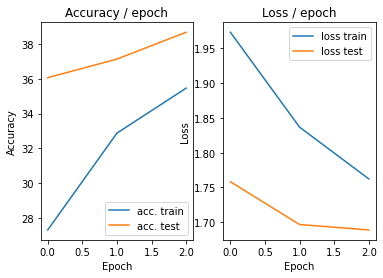

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.196s (0.196s)	Loss 1.9086 (1.9086)	Prec@1  32.0 ( 32.0)	Prec@5  79.7 ( 79.7)


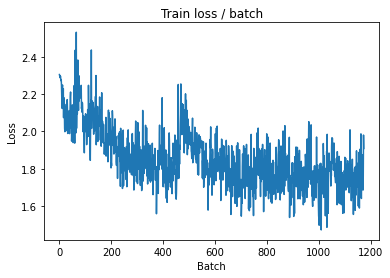

[TRAIN Batch 200/391]	Time 0.065s (0.049s)	Loss 1.6166 (1.7216)	Prec@1  43.0 ( 37.3)	Prec@5  88.3 ( 87.4)


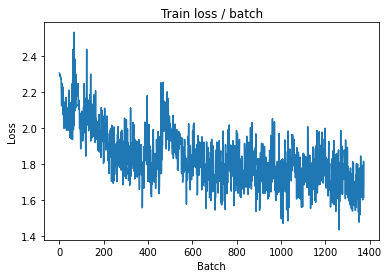


===============> Total time 18s	Avg loss 1.7001	Avg Prec@1 38.17 %	Avg Prec@5 87.82 %

[EVAL Batch 000/079]	Time 0.177s (0.177s)	Loss 1.6377 (1.6377)	Prec@1  46.9 ( 46.9)	Prec@5  89.1 ( 89.1)

===============> Total time 2s	Avg loss 1.6196	Avg Prec@1 40.96 %	Avg Prec@5 89.54 %



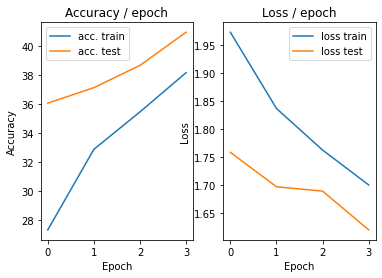

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.208s (0.208s)	Loss 1.7834 (1.7834)	Prec@1  42.2 ( 42.2)	Prec@5  87.5 ( 87.5)


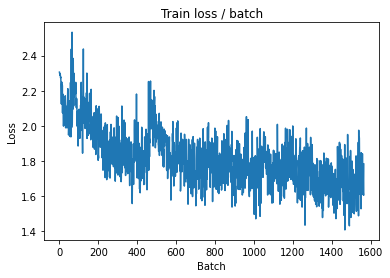

[TRAIN Batch 200/391]	Time 0.026s (0.047s)	Loss 1.6323 (1.6781)	Prec@1  39.1 ( 39.2)	Prec@5  86.7 ( 88.1)


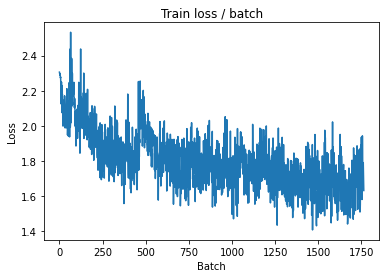


===============> Total time 18s	Avg loss 1.6531	Avg Prec@1 40.21 %	Avg Prec@5 88.54 %

[EVAL Batch 000/079]	Time 0.162s (0.162s)	Loss 1.6262 (1.6262)	Prec@1  45.3 ( 45.3)	Prec@5  90.6 ( 90.6)

===============> Total time 2s	Avg loss 1.5680	Avg Prec@1 43.48 %	Avg Prec@5 89.83 %



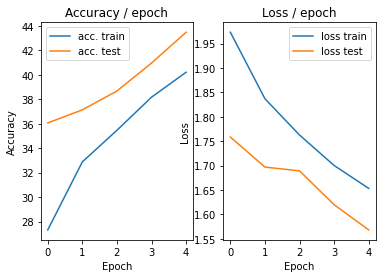

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.233s (0.233s)	Loss 1.7184 (1.7184)	Prec@1  40.6 ( 40.6)	Prec@5  89.1 ( 89.1)


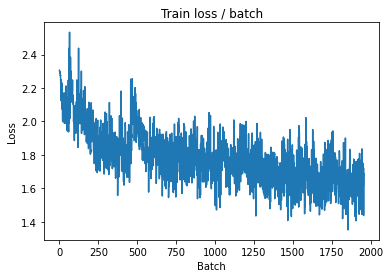

[TRAIN Batch 200/391]	Time 0.028s (0.048s)	Loss 1.4113 (1.6660)	Prec@1  50.0 ( 40.7)	Prec@5  89.1 ( 88.1)


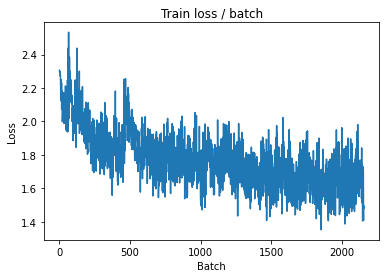


===============> Total time 18s	Avg loss 1.6264	Avg Prec@1 42.13 %	Avg Prec@5 88.83 %

[EVAL Batch 000/079]	Time 0.171s (0.171s)	Loss 1.4257 (1.4257)	Prec@1  54.7 ( 54.7)	Prec@5  90.6 ( 90.6)

===============> Total time 2s	Avg loss 1.4668	Avg Prec@1 47.77 %	Avg Prec@5 91.80 %



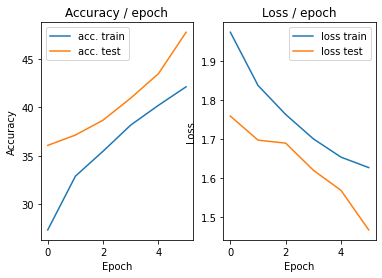

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.225s (0.225s)	Loss 1.5775 (1.5775)	Prec@1  44.5 ( 44.5)	Prec@5  87.5 ( 87.5)


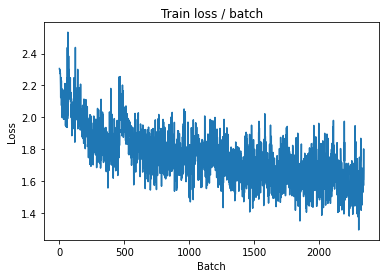

[TRAIN Batch 200/391]	Time 0.051s (0.047s)	Loss 1.7640 (1.5421)	Prec@1  37.5 ( 45.4)	Prec@5  89.1 ( 90.4)


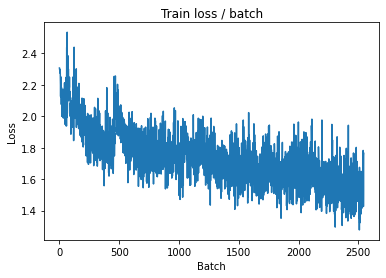


===============> Total time 18s	Avg loss 1.5601	Avg Prec@1 44.92 %	Avg Prec@5 90.00 %

[EVAL Batch 000/079]	Time 0.188s (0.188s)	Loss 1.3431 (1.3431)	Prec@1  51.6 ( 51.6)	Prec@5  91.4 ( 91.4)

===============> Total time 2s	Avg loss 1.4322	Avg Prec@1 48.78 %	Avg Prec@5 91.74 %



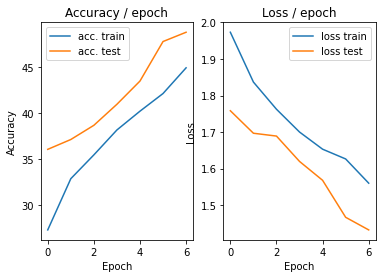

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.230s (0.230s)	Loss 1.6145 (1.6145)	Prec@1  38.3 ( 38.3)	Prec@5  89.8 ( 89.8)


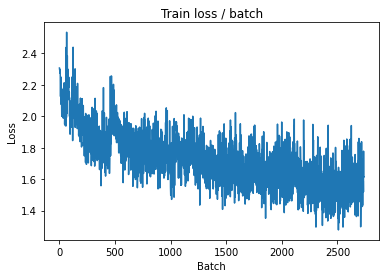

[TRAIN Batch 200/391]	Time 0.081s (0.049s)	Loss 1.4279 (1.5092)	Prec@1  53.1 ( 47.2)	Prec@5  89.1 ( 90.4)


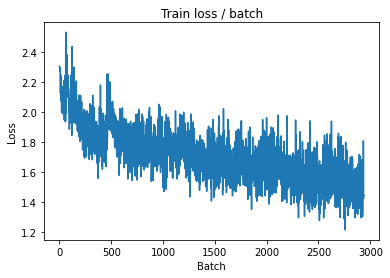


===============> Total time 18s	Avg loss 1.5224	Avg Prec@1 46.81 %	Avg Prec@5 90.43 %

[EVAL Batch 000/079]	Time 0.172s (0.172s)	Loss 1.3138 (1.3138)	Prec@1  51.6 ( 51.6)	Prec@5  93.8 ( 93.8)

===============> Total time 2s	Avg loss 1.4011	Avg Prec@1 50.87 %	Avg Prec@5 92.12 %



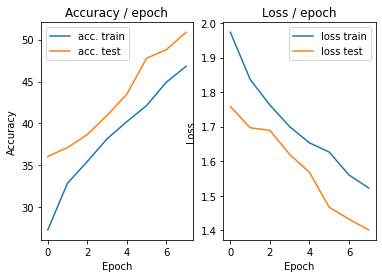

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.188s (0.188s)	Loss 1.6644 (1.6644)	Prec@1  41.4 ( 41.4)	Prec@5  90.6 ( 90.6)


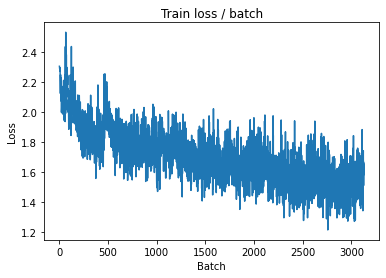

[TRAIN Batch 200/391]	Time 0.049s (0.047s)	Loss 1.5143 (1.4875)	Prec@1  43.0 ( 48.2)	Prec@5  92.2 ( 90.8)


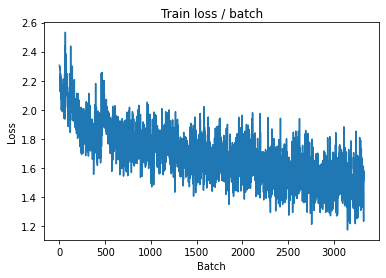


===============> Total time 18s	Avg loss 1.4826	Avg Prec@1 48.22 %	Avg Prec@5 90.73 %

[EVAL Batch 000/079]	Time 0.183s (0.183s)	Loss 1.3518 (1.3518)	Prec@1  55.5 ( 55.5)	Prec@5  93.0 ( 93.0)

===============> Total time 2s	Avg loss 1.3904	Avg Prec@1 51.92 %	Avg Prec@5 92.84 %



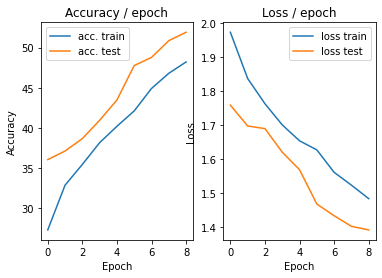

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.231s (0.231s)	Loss 1.3270 (1.3270)	Prec@1  50.0 ( 50.0)	Prec@5  93.0 ( 93.0)


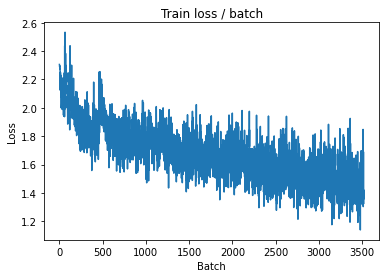

[TRAIN Batch 200/391]	Time 0.061s (0.048s)	Loss 1.4428 (1.4807)	Prec@1  54.7 ( 48.6)	Prec@5  90.6 ( 91.3)


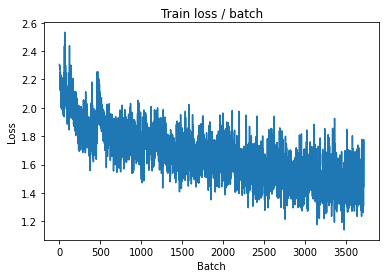


===============> Total time 18s	Avg loss 1.4673	Avg Prec@1 49.19 %	Avg Prec@5 91.27 %

[EVAL Batch 000/079]	Time 0.184s (0.184s)	Loss 1.2819 (1.2819)	Prec@1  57.8 ( 57.8)	Prec@5  92.2 ( 92.2)

===============> Total time 2s	Avg loss 1.2904	Avg Prec@1 55.11 %	Avg Prec@5 93.33 %



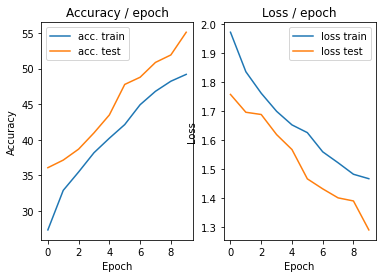

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.247s (0.247s)	Loss 1.6244 (1.6244)	Prec@1  45.3 ( 45.3)	Prec@5  95.3 ( 95.3)


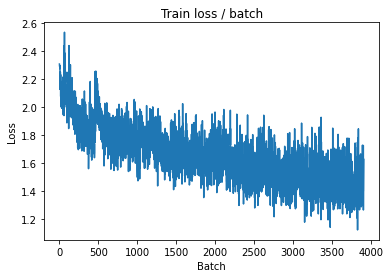

[TRAIN Batch 200/391]	Time 0.069s (0.046s)	Loss 1.4331 (1.4251)	Prec@1  52.3 ( 50.3)	Prec@5  93.8 ( 91.8)


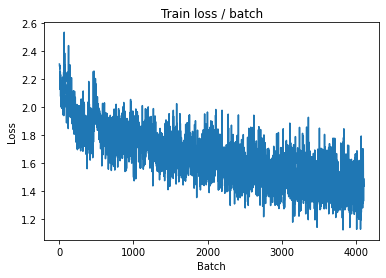


===============> Total time 18s	Avg loss 1.4130	Avg Prec@1 50.82 %	Avg Prec@5 91.87 %

[EVAL Batch 000/079]	Time 0.190s (0.190s)	Loss 1.3392 (1.3392)	Prec@1  49.2 ( 49.2)	Prec@5  93.0 ( 93.0)

===============> Total time 2s	Avg loss 1.3609	Avg Prec@1 51.72 %	Avg Prec@5 92.25 %



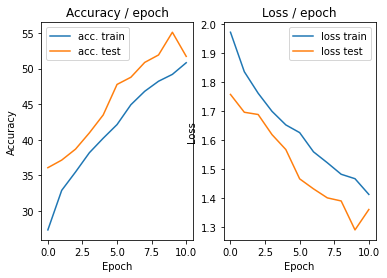

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.222s (0.222s)	Loss 1.4778 (1.4778)	Prec@1  48.4 ( 48.4)	Prec@5  92.2 ( 92.2)


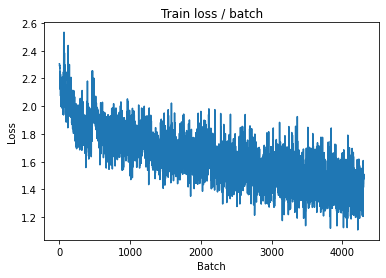

[TRAIN Batch 200/391]	Time 0.056s (0.047s)	Loss 1.1849 (1.3743)	Prec@1  62.5 ( 52.3)	Prec@5  96.9 ( 92.4)


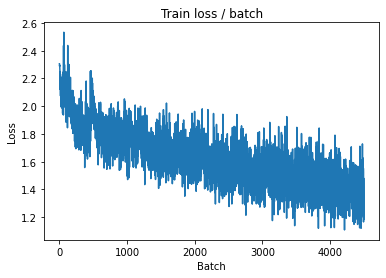


===============> Total time 18s	Avg loss 1.3789	Avg Prec@1 52.37 %	Avg Prec@5 92.28 %

[EVAL Batch 000/079]	Time 0.176s (0.176s)	Loss 1.2804 (1.2804)	Prec@1  54.7 ( 54.7)	Prec@5  93.0 ( 93.0)

===============> Total time 2s	Avg loss 1.2443	Avg Prec@1 56.60 %	Avg Prec@5 93.92 %



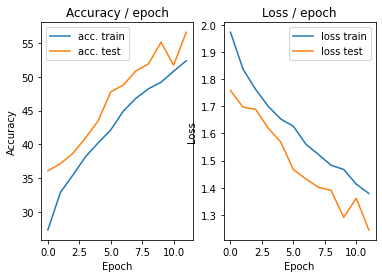

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.215s (0.215s)	Loss 1.3568 (1.3568)	Prec@1  53.9 ( 53.9)	Prec@5  92.2 ( 92.2)


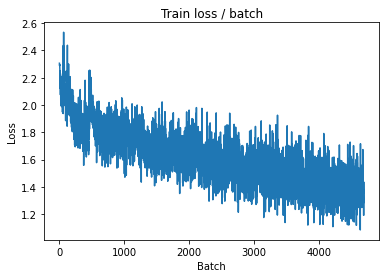

[TRAIN Batch 200/391]	Time 0.067s (0.048s)	Loss 1.2601 (1.3703)	Prec@1  56.2 ( 52.6)	Prec@5  93.0 ( 92.6)


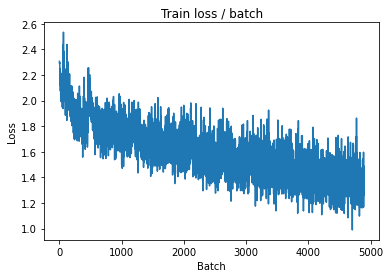


===============> Total time 18s	Avg loss 1.3552	Avg Prec@1 53.27 %	Avg Prec@5 92.61 %

[EVAL Batch 000/079]	Time 0.192s (0.192s)	Loss 1.2685 (1.2685)	Prec@1  58.6 ( 58.6)	Prec@5  95.3 ( 95.3)

===============> Total time 2s	Avg loss 1.2596	Avg Prec@1 57.18 %	Avg Prec@5 93.93 %



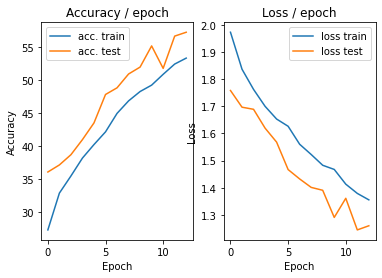

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.204s (0.204s)	Loss 1.4998 (1.4998)	Prec@1  55.5 ( 55.5)	Prec@5  94.5 ( 94.5)


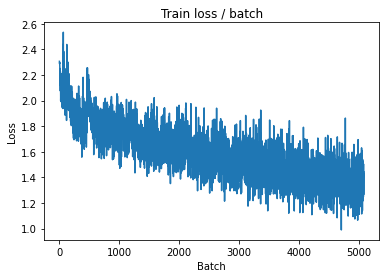

[TRAIN Batch 200/391]	Time 0.034s (0.046s)	Loss 1.4073 (1.3126)	Prec@1  51.6 ( 55.0)	Prec@5  90.6 ( 93.1)


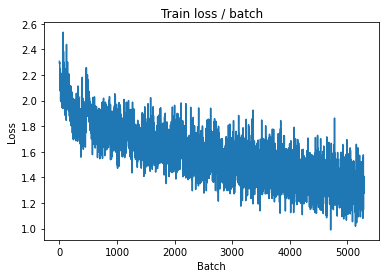


===============> Total time 17s	Avg loss 1.3091	Avg Prec@1 55.13 %	Avg Prec@5 93.11 %

[EVAL Batch 000/079]	Time 0.185s (0.185s)	Loss 1.1365 (1.1365)	Prec@1  63.3 ( 63.3)	Prec@5  94.5 ( 94.5)

===============> Total time 2s	Avg loss 1.1687	Avg Prec@1 59.73 %	Avg Prec@5 94.72 %



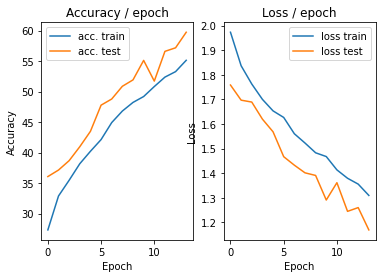

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.236s (0.236s)	Loss 1.2010 (1.2010)	Prec@1  57.8 ( 57.8)	Prec@5  95.3 ( 95.3)


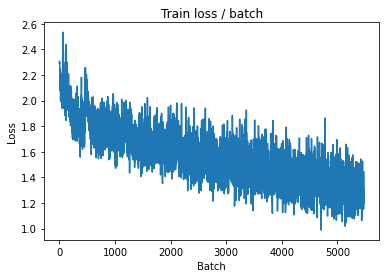

[TRAIN Batch 200/391]	Time 0.057s (0.046s)	Loss 1.3446 (1.2519)	Prec@1  55.5 ( 57.2)	Prec@5  92.2 ( 93.9)


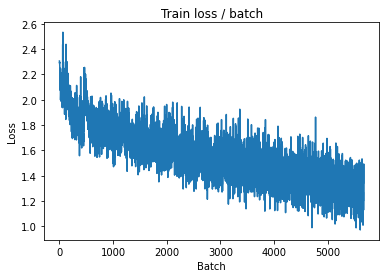


===============> Total time 17s	Avg loss 1.2692	Avg Prec@1 56.44 %	Avg Prec@5 93.66 %

[EVAL Batch 000/079]	Time 0.178s (0.178s)	Loss 1.2377 (1.2377)	Prec@1  60.9 ( 60.9)	Prec@5  93.8 ( 93.8)

===============> Total time 2s	Avg loss 1.2371	Avg Prec@1 57.13 %	Avg Prec@5 94.23 %



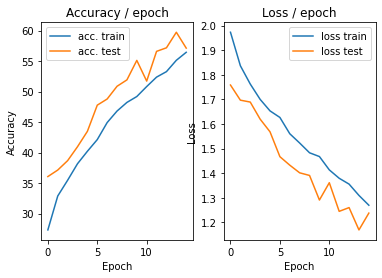

=== EPOCH 16 =====

[TRAIN Batch 000/391]	Time 0.228s (0.228s)	Loss 1.2026 (1.2026)	Prec@1  56.2 ( 56.2)	Prec@5  94.5 ( 94.5)


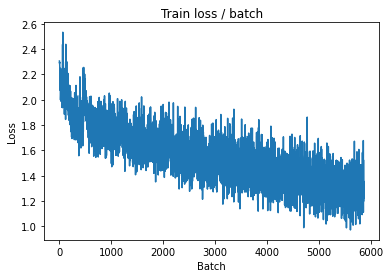

[TRAIN Batch 200/391]	Time 0.026s (0.048s)	Loss 1.1073 (1.2338)	Prec@1  57.8 ( 58.0)	Prec@5  96.9 ( 93.9)


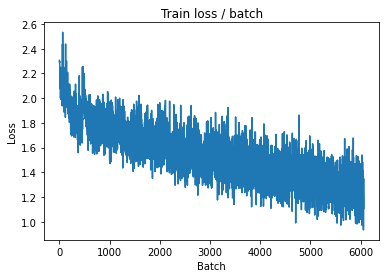


===============> Total time 18s	Avg loss 1.2355	Avg Prec@1 58.01 %	Avg Prec@5 93.98 %

[EVAL Batch 000/079]	Time 0.173s (0.173s)	Loss 1.1675 (1.1675)	Prec@1  57.0 ( 57.0)	Prec@5  93.8 ( 93.8)

===============> Total time 2s	Avg loss 1.1540	Avg Prec@1 60.26 %	Avg Prec@5 95.22 %



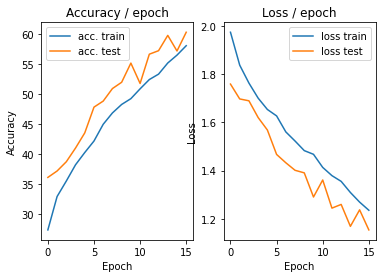

=== EPOCH 17 =====

[TRAIN Batch 000/391]	Time 0.240s (0.240s)	Loss 1.1284 (1.1284)	Prec@1  63.3 ( 63.3)	Prec@5  95.3 ( 95.3)


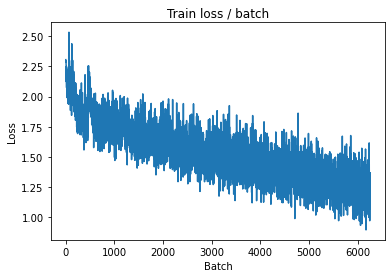

[TRAIN Batch 200/391]	Time 0.045s (0.046s)	Loss 1.3317 (1.2141)	Prec@1  50.8 ( 58.3)	Prec@5  90.6 ( 94.2)


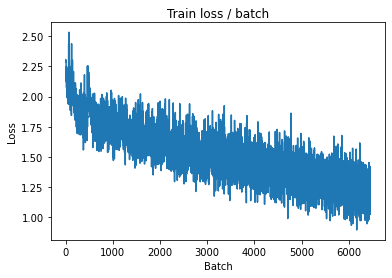


===============> Total time 18s	Avg loss 1.2015	Avg Prec@1 58.83 %	Avg Prec@5 94.42 %

[EVAL Batch 000/079]	Time 0.191s (0.191s)	Loss 1.2425 (1.2425)	Prec@1  60.2 ( 60.2)	Prec@5  90.6 ( 90.6)

===============> Total time 2s	Avg loss 1.1012	Avg Prec@1 62.09 %	Avg Prec@5 95.50 %



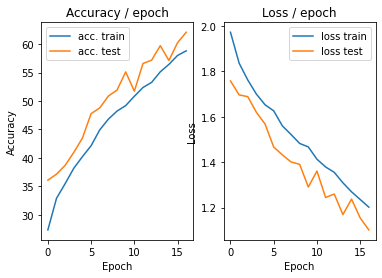

=== EPOCH 18 =====

[TRAIN Batch 000/391]	Time 0.204s (0.204s)	Loss 1.1865 (1.1865)	Prec@1  57.8 ( 57.8)	Prec@5  94.5 ( 94.5)


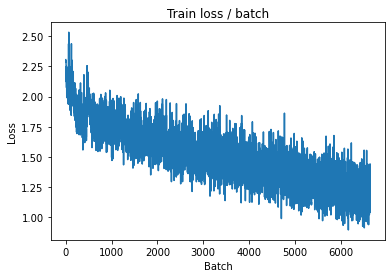

[TRAIN Batch 200/391]	Time 0.024s (0.047s)	Loss 1.1339 (1.1731)	Prec@1  63.3 ( 59.8)	Prec@5  95.3 ( 94.6)


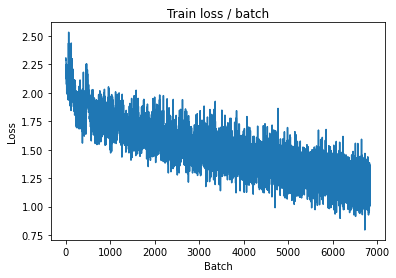


===============> Total time 18s	Avg loss 1.1727	Avg Prec@1 59.93 %	Avg Prec@5 94.59 %

[EVAL Batch 000/079]	Time 0.181s (0.181s)	Loss 1.1589 (1.1589)	Prec@1  61.7 ( 61.7)	Prec@5  93.8 ( 93.8)

===============> Total time 2s	Avg loss 1.0919	Avg Prec@1 62.46 %	Avg Prec@5 95.41 %



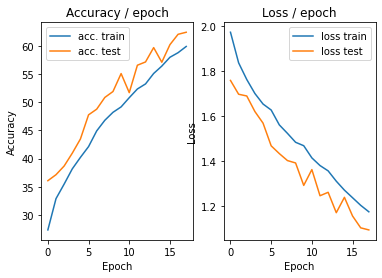

=== EPOCH 19 =====

[TRAIN Batch 000/391]	Time 0.254s (0.254s)	Loss 1.0642 (1.0642)	Prec@1  61.7 ( 61.7)	Prec@5  93.0 ( 93.0)


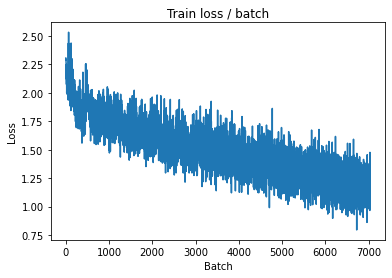

[TRAIN Batch 200/391]	Time 0.047s (0.046s)	Loss 1.3182 (1.1236)	Prec@1  50.0 ( 61.7)	Prec@5  96.1 ( 94.9)


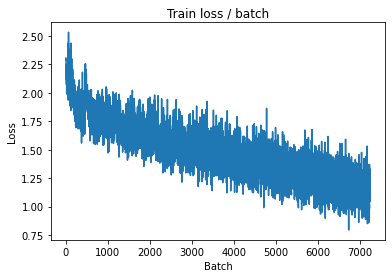


===============> Total time 17s	Avg loss 1.1311	Avg Prec@1 61.56 %	Avg Prec@5 94.89 %

[EVAL Batch 000/079]	Time 0.166s (0.166s)	Loss 1.0820 (1.0820)	Prec@1  64.1 ( 64.1)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 1.0459	Avg Prec@1 64.87 %	Avg Prec@5 95.95 %



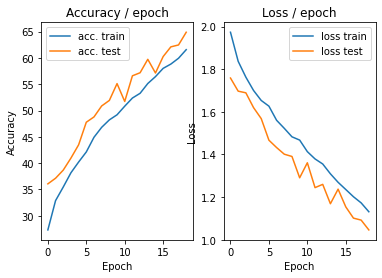

=== EPOCH 20 =====

[TRAIN Batch 000/391]	Time 0.214s (0.214s)	Loss 1.0142 (1.0142)	Prec@1  65.6 ( 65.6)	Prec@5  94.5 ( 94.5)


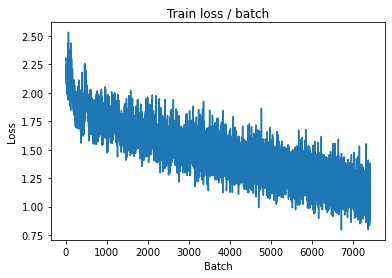

[TRAIN Batch 200/391]	Time 0.072s (0.047s)	Loss 1.4092 (1.0985)	Prec@1  59.4 ( 62.7)	Prec@5  94.5 ( 95.4)


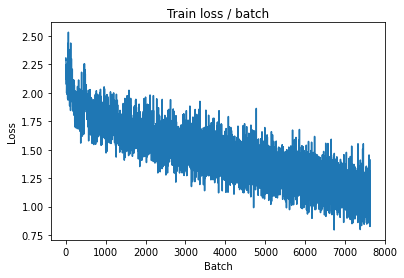


===============> Total time 17s	Avg loss 1.0993	Avg Prec@1 62.64 %	Avg Prec@5 95.32 %

[EVAL Batch 000/079]	Time 0.204s (0.204s)	Loss 1.0155 (1.0155)	Prec@1  71.1 ( 71.1)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 1.0275	Avg Prec@1 65.56 %	Avg Prec@5 96.00 %



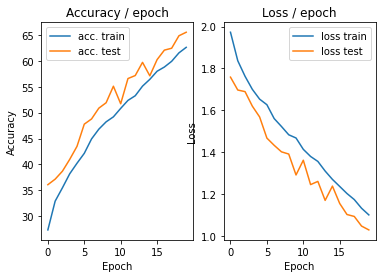

=== EPOCH 21 =====

[TRAIN Batch 000/391]	Time 0.200s (0.200s)	Loss 1.0294 (1.0294)	Prec@1  64.8 ( 64.8)	Prec@5  96.9 ( 96.9)


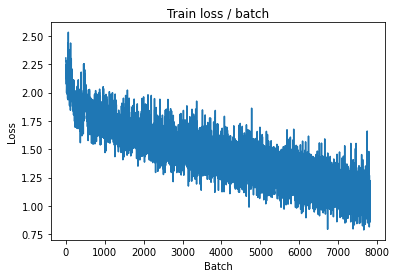

[TRAIN Batch 200/391]	Time 0.055s (0.048s)	Loss 1.0654 (1.0786)	Prec@1  57.8 ( 63.5)	Prec@5  95.3 ( 95.4)


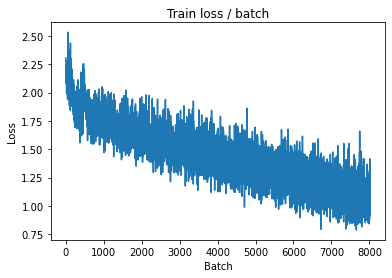


===============> Total time 18s	Avg loss 1.0713	Avg Prec@1 63.72 %	Avg Prec@5 95.36 %

[EVAL Batch 000/079]	Time 0.171s (0.171s)	Loss 1.1138 (1.1138)	Prec@1  63.3 ( 63.3)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 1.0260	Avg Prec@1 66.05 %	Avg Prec@5 96.14 %



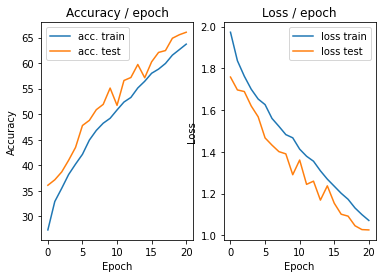

=== EPOCH 22 =====

[TRAIN Batch 000/391]	Time 0.221s (0.221s)	Loss 1.0488 (1.0488)	Prec@1  64.1 ( 64.1)	Prec@5  96.9 ( 96.9)


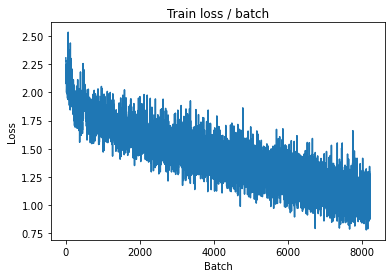

[TRAIN Batch 200/391]	Time 0.022s (0.047s)	Loss 0.8651 (1.0443)	Prec@1  67.2 ( 64.7)	Prec@5  94.5 ( 95.6)


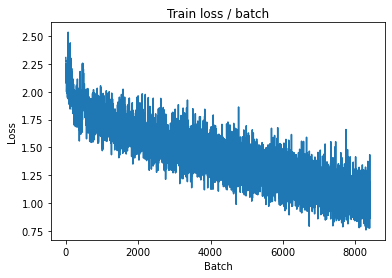


===============> Total time 18s	Avg loss 1.0392	Avg Prec@1 64.84 %	Avg Prec@5 95.68 %

[EVAL Batch 000/079]	Time 0.195s (0.195s)	Loss 0.9669 (0.9669)	Prec@1  72.7 ( 72.7)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.9976	Avg Prec@1 67.10 %	Avg Prec@5 96.17 %



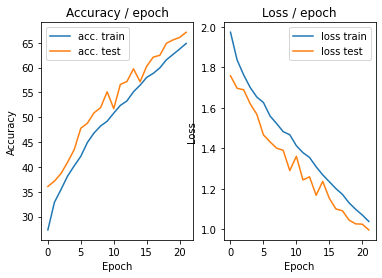

=== EPOCH 23 =====

[TRAIN Batch 000/391]	Time 0.210s (0.210s)	Loss 1.0497 (1.0497)	Prec@1  64.1 ( 64.1)	Prec@5  94.5 ( 94.5)


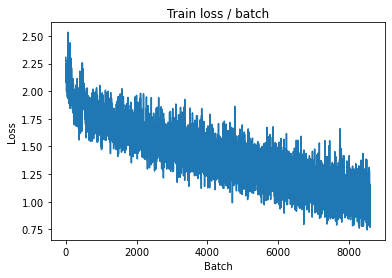

[TRAIN Batch 200/391]	Time 0.019s (0.048s)	Loss 0.8626 (0.9976)	Prec@1  67.2 ( 66.3)	Prec@5  96.9 ( 96.2)


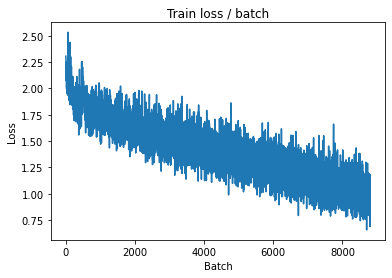


===============> Total time 18s	Avg loss 1.0078	Avg Prec@1 65.94 %	Avg Prec@5 96.01 %

[EVAL Batch 000/079]	Time 0.196s (0.196s)	Loss 0.9119 (0.9119)	Prec@1  70.3 ( 70.3)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.9557	Avg Prec@1 68.20 %	Avg Prec@5 96.41 %



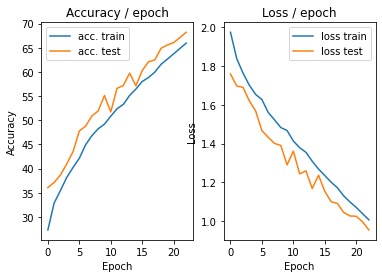

=== EPOCH 24 =====

[TRAIN Batch 000/391]	Time 0.208s (0.208s)	Loss 0.8606 (0.8606)	Prec@1  68.0 ( 68.0)	Prec@5  98.4 ( 98.4)


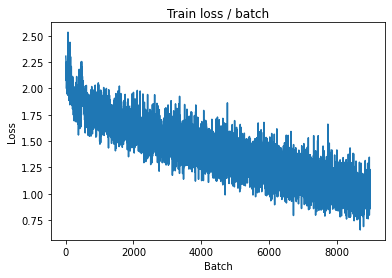

[TRAIN Batch 200/391]	Time 0.079s (0.047s)	Loss 0.8694 (0.9800)	Prec@1  72.7 ( 66.6)	Prec@5  98.4 ( 96.2)


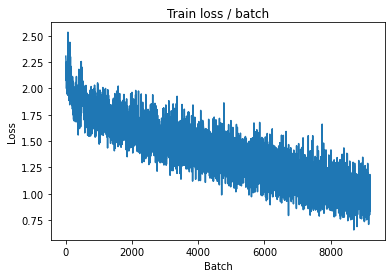


===============> Total time 18s	Avg loss 0.9901	Avg Prec@1 66.26 %	Avg Prec@5 96.08 %

[EVAL Batch 000/079]	Time 0.192s (0.192s)	Loss 0.9068 (0.9068)	Prec@1  66.4 ( 66.4)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.9668	Avg Prec@1 68.05 %	Avg Prec@5 96.60 %



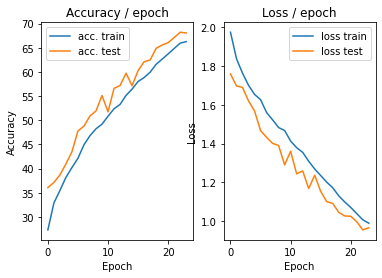

=== EPOCH 25 =====

[TRAIN Batch 000/391]	Time 0.210s (0.210s)	Loss 0.9282 (0.9282)	Prec@1  66.4 ( 66.4)	Prec@5  98.4 ( 98.4)


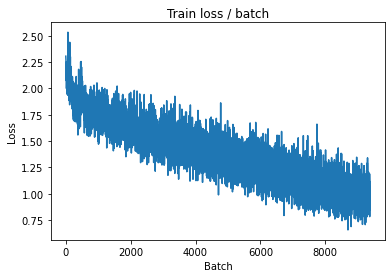

[TRAIN Batch 200/391]	Time 0.032s (0.047s)	Loss 0.8339 (0.9639)	Prec@1  68.0 ( 67.0)	Prec@5  98.4 ( 96.4)


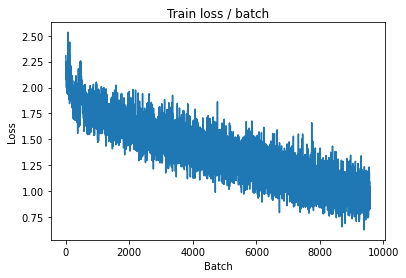


===============> Total time 18s	Avg loss 0.9642	Avg Prec@1 67.27 %	Avg Prec@5 96.39 %

[EVAL Batch 000/079]	Time 0.184s (0.184s)	Loss 0.8575 (0.8575)	Prec@1  69.5 ( 69.5)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.8885	Avg Prec@1 70.20 %	Avg Prec@5 96.96 %



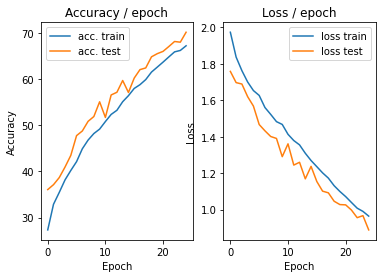

=== EPOCH 26 =====

[TRAIN Batch 000/391]	Time 0.216s (0.216s)	Loss 1.0001 (1.0001)	Prec@1  67.2 ( 67.2)	Prec@5  96.9 ( 96.9)


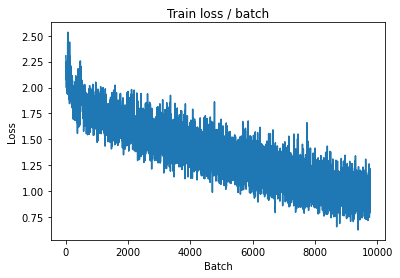

[TRAIN Batch 200/391]	Time 0.053s (0.046s)	Loss 1.0330 (0.9344)	Prec@1  63.3 ( 68.4)	Prec@5  97.7 ( 96.5)


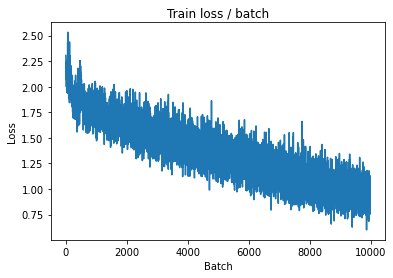


===============> Total time 17s	Avg loss 0.9365	Avg Prec@1 68.23 %	Avg Prec@5 96.51 %

[EVAL Batch 000/079]	Time 0.207s (0.207s)	Loss 0.8772 (0.8772)	Prec@1  68.8 ( 68.8)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.8999	Avg Prec@1 70.09 %	Avg Prec@5 96.88 %



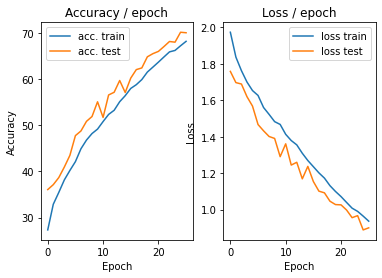

=== EPOCH 27 =====

[TRAIN Batch 000/391]	Time 0.220s (0.220s)	Loss 0.8446 (0.8446)	Prec@1  68.0 ( 68.0)	Prec@5  98.4 ( 98.4)


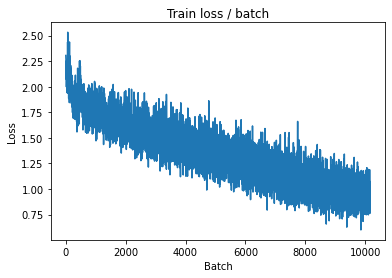

[TRAIN Batch 200/391]	Time 0.070s (0.046s)	Loss 0.8313 (0.9215)	Prec@1  69.5 ( 68.6)	Prec@5  99.2 ( 96.8)


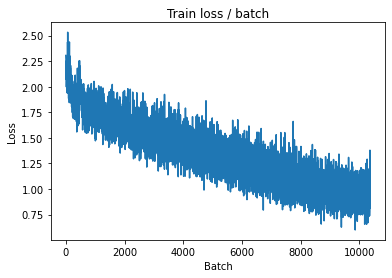


===============> Total time 17s	Avg loss 0.9145	Avg Prec@1 68.93 %	Avg Prec@5 96.72 %

[EVAL Batch 000/079]	Time 0.194s (0.194s)	Loss 0.9858 (0.9858)	Prec@1  68.8 ( 68.8)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 0.8814	Avg Prec@1 70.97 %	Avg Prec@5 96.95 %



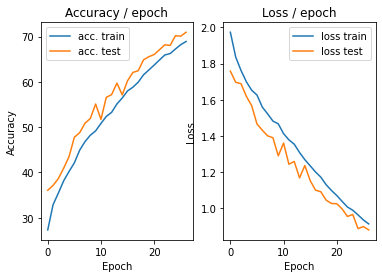

=== EPOCH 28 =====

[TRAIN Batch 000/391]	Time 0.235s (0.235s)	Loss 0.7462 (0.7462)	Prec@1  72.7 ( 72.7)	Prec@5  99.2 ( 99.2)


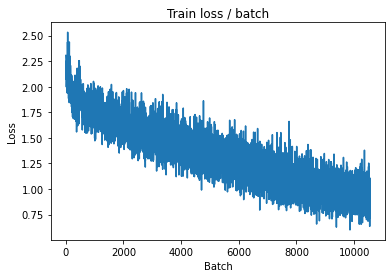

[TRAIN Batch 200/391]	Time 0.067s (0.048s)	Loss 0.9146 (0.8953)	Prec@1  62.5 ( 69.7)	Prec@5  97.7 ( 96.9)


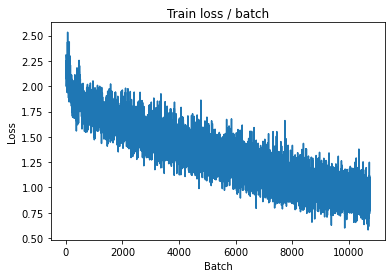


===============> Total time 18s	Avg loss 0.9025	Avg Prec@1 69.41 %	Avg Prec@5 96.86 %

[EVAL Batch 000/079]	Time 0.194s (0.194s)	Loss 0.9135 (0.9135)	Prec@1  70.3 ( 70.3)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.8865	Avg Prec@1 70.74 %	Avg Prec@5 96.81 %



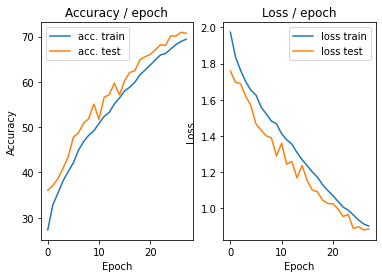

=== EPOCH 29 =====

[TRAIN Batch 000/391]	Time 0.236s (0.236s)	Loss 0.9841 (0.9841)	Prec@1  67.2 ( 67.2)	Prec@5  95.3 ( 95.3)


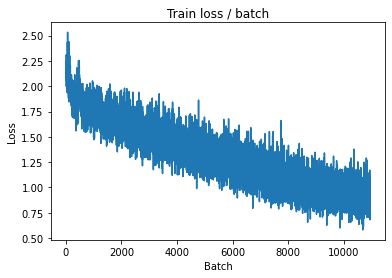

[TRAIN Batch 200/391]	Time 0.062s (0.047s)	Loss 0.8861 (0.8782)	Prec@1  71.1 ( 70.2)	Prec@5  97.7 ( 97.1)


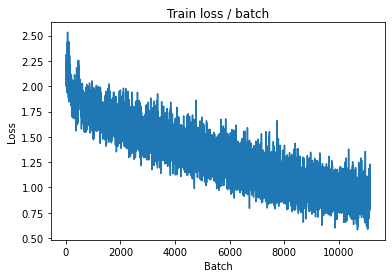


===============> Total time 18s	Avg loss 0.8725	Avg Prec@1 70.45 %	Avg Prec@5 97.07 %

[EVAL Batch 000/079]	Time 0.191s (0.191s)	Loss 0.9577 (0.9577)	Prec@1  67.2 ( 67.2)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.8456	Avg Prec@1 71.68 %	Avg Prec@5 97.21 %



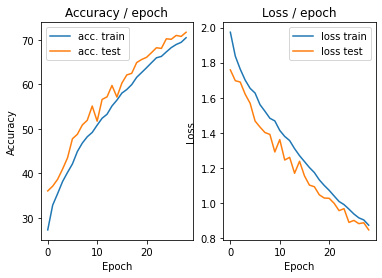

=== EPOCH 30 =====

[TRAIN Batch 000/391]	Time 0.216s (0.216s)	Loss 0.8509 (0.8509)	Prec@1  71.1 ( 71.1)	Prec@5  98.4 ( 98.4)


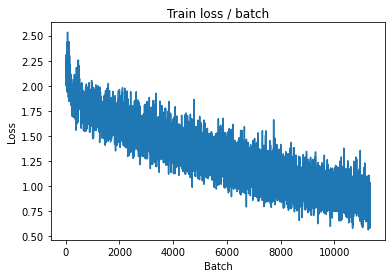

[TRAIN Batch 200/391]	Time 0.025s (0.047s)	Loss 0.8330 (0.8401)	Prec@1  68.8 ( 71.7)	Prec@5  96.9 ( 97.1)


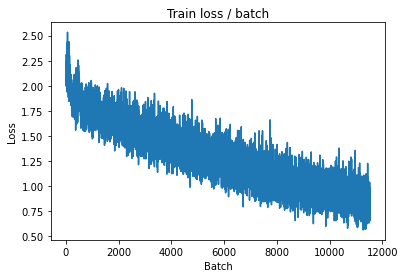


===============> Total time 18s	Avg loss 0.8509	Avg Prec@1 71.04 %	Avg Prec@5 97.09 %

[EVAL Batch 000/079]	Time 0.182s (0.182s)	Loss 0.8321 (0.8321)	Prec@1  70.3 ( 70.3)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 0.8316	Avg Prec@1 72.21 %	Avg Prec@5 97.39 %



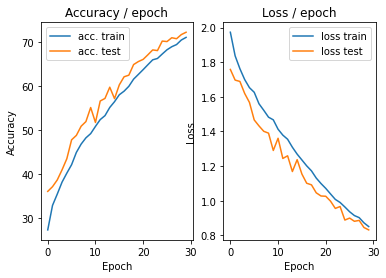

=== EPOCH 31 =====

[TRAIN Batch 000/391]	Time 0.227s (0.227s)	Loss 0.7705 (0.7705)	Prec@1  71.1 ( 71.1)	Prec@5  96.9 ( 96.9)


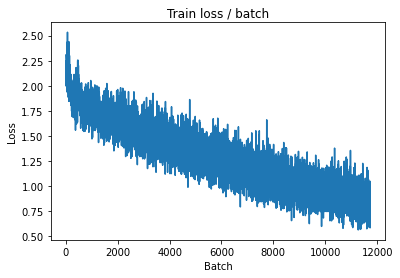

[TRAIN Batch 200/391]	Time 0.056s (0.047s)	Loss 0.6897 (0.8386)	Prec@1  78.9 ( 71.7)	Prec@5  98.4 ( 97.1)


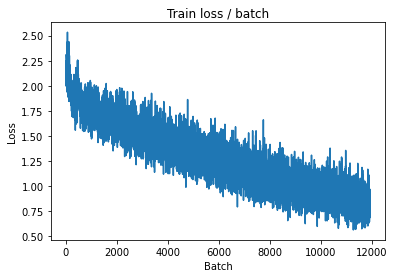


===============> Total time 18s	Avg loss 0.8282	Avg Prec@1 71.79 %	Avg Prec@5 97.28 %

[EVAL Batch 000/079]	Time 0.189s (0.189s)	Loss 0.7820 (0.7820)	Prec@1  71.9 ( 71.9)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.8074	Avg Prec@1 73.32 %	Avg Prec@5 97.41 %



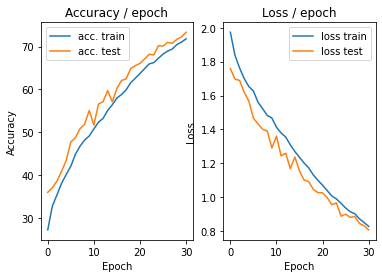

=== EPOCH 32 =====

[TRAIN Batch 000/391]	Time 0.214s (0.214s)	Loss 0.7467 (0.7467)	Prec@1  76.6 ( 76.6)	Prec@5  96.9 ( 96.9)


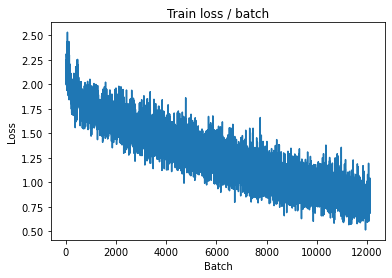

[TRAIN Batch 200/391]	Time 0.022s (0.048s)	Loss 0.8400 (0.8104)	Prec@1  68.8 ( 72.5)	Prec@5  96.9 ( 97.5)


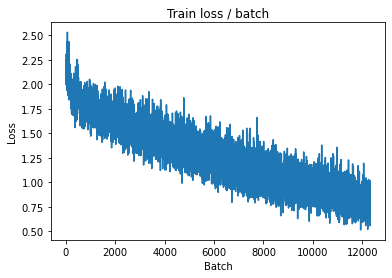


===============> Total time 18s	Avg loss 0.8096	Avg Prec@1 72.55 %	Avg Prec@5 97.40 %

[EVAL Batch 000/079]	Time 0.191s (0.191s)	Loss 0.8033 (0.8033)	Prec@1  72.7 ( 72.7)	Prec@5  97.7 ( 97.7)

===============> Total time 3s	Avg loss 0.8220	Avg Prec@1 73.24 %	Avg Prec@5 97.37 %



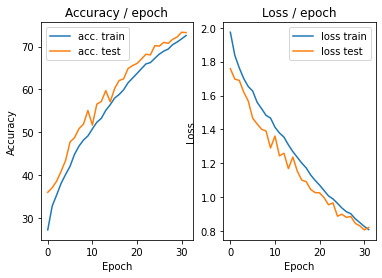

=== EPOCH 33 =====

[TRAIN Batch 000/391]	Time 0.233s (0.233s)	Loss 0.7352 (0.7352)	Prec@1  77.3 ( 77.3)	Prec@5  97.7 ( 97.7)


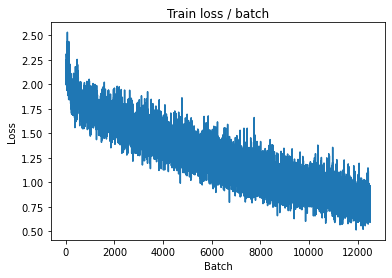

[TRAIN Batch 200/391]	Time 0.058s (0.046s)	Loss 0.7824 (0.7954)	Prec@1  70.3 ( 72.9)	Prec@5  96.9 ( 97.5)


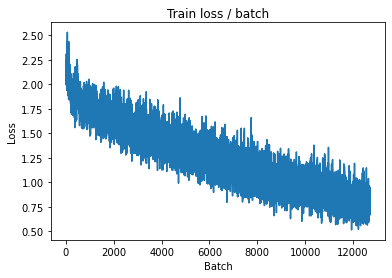


===============> Total time 17s	Avg loss 0.8002	Avg Prec@1 72.77 %	Avg Prec@5 97.45 %

[EVAL Batch 000/079]	Time 0.174s (0.174s)	Loss 0.7775 (0.7775)	Prec@1  71.1 ( 71.1)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.8195	Avg Prec@1 73.11 %	Avg Prec@5 97.38 %



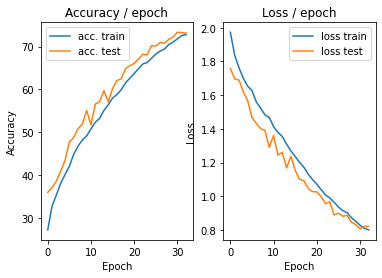

=== EPOCH 34 =====

[TRAIN Batch 000/391]	Time 0.224s (0.224s)	Loss 0.7738 (0.7738)	Prec@1  71.1 ( 71.1)	Prec@5  97.7 ( 97.7)


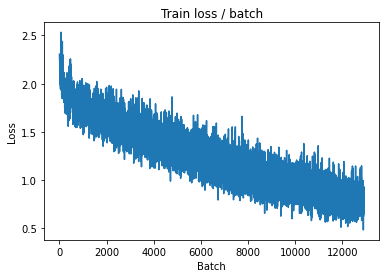

[TRAIN Batch 200/391]	Time 0.070s (0.046s)	Loss 0.8861 (0.7790)	Prec@1  73.4 ( 73.4)	Prec@5  93.8 ( 97.7)


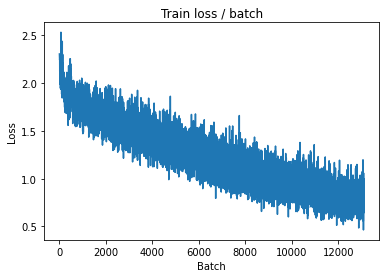


===============> Total time 17s	Avg loss 0.7803	Avg Prec@1 73.35 %	Avg Prec@5 97.65 %

[EVAL Batch 000/079]	Time 0.174s (0.174s)	Loss 0.7709 (0.7709)	Prec@1  72.7 ( 72.7)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.7899	Avg Prec@1 73.46 %	Avg Prec@5 97.70 %



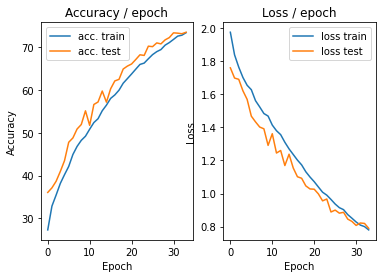

=== EPOCH 35 =====

[TRAIN Batch 000/391]	Time 0.227s (0.227s)	Loss 0.7579 (0.7579)	Prec@1  71.9 ( 71.9)	Prec@5  97.7 ( 97.7)


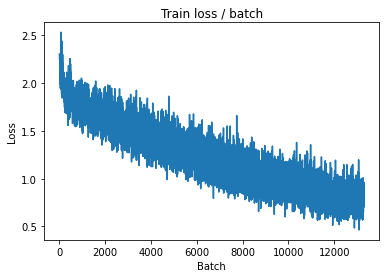

[TRAIN Batch 200/391]	Time 0.067s (0.047s)	Loss 0.6287 (0.7534)	Prec@1  79.7 ( 74.1)	Prec@5  96.9 ( 97.8)


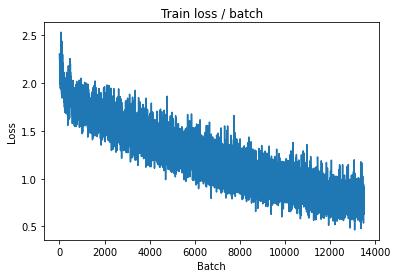


===============> Total time 18s	Avg loss 0.7608	Avg Prec@1 73.98 %	Avg Prec@5 97.77 %

[EVAL Batch 000/079]	Time 0.179s (0.179s)	Loss 0.7083 (0.7083)	Prec@1  71.9 ( 71.9)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.7879	Avg Prec@1 74.04 %	Avg Prec@5 97.75 %



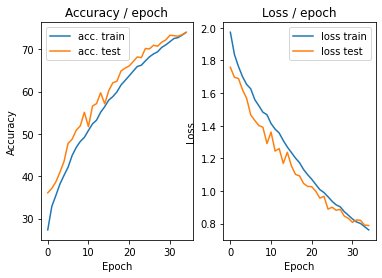

=== EPOCH 36 =====

[TRAIN Batch 000/391]	Time 0.239s (0.239s)	Loss 0.8676 (0.8676)	Prec@1  71.9 ( 71.9)	Prec@5  96.9 ( 96.9)


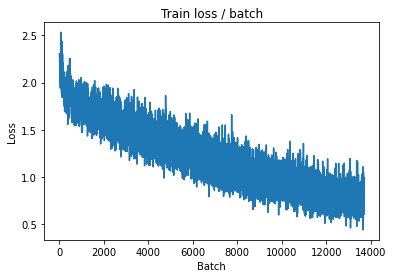

[TRAIN Batch 200/391]	Time 0.069s (0.049s)	Loss 0.8849 (0.7454)	Prec@1  71.1 ( 74.6)	Prec@5  98.4 ( 97.8)


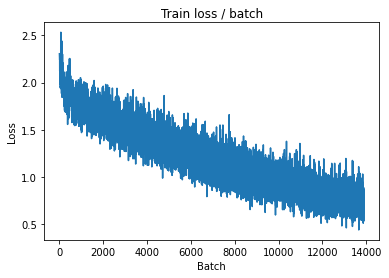


===============> Total time 18s	Avg loss 0.7466	Avg Prec@1 74.52 %	Avg Prec@5 97.81 %

[EVAL Batch 000/079]	Time 0.198s (0.198s)	Loss 0.7156 (0.7156)	Prec@1  74.2 ( 74.2)	Prec@5  97.7 ( 97.7)

===============> Total time 3s	Avg loss 0.7840	Avg Prec@1 73.93 %	Avg Prec@5 97.60 %



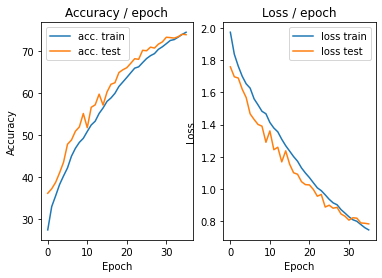

=== EPOCH 37 =====

[TRAIN Batch 000/391]	Time 0.243s (0.243s)	Loss 0.7621 (0.7621)	Prec@1  74.2 ( 74.2)	Prec@5  98.4 ( 98.4)


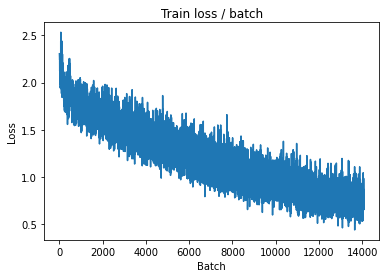

[TRAIN Batch 200/391]	Time 0.051s (0.047s)	Loss 0.6287 (0.7306)	Prec@1  75.0 ( 74.7)	Prec@5  99.2 ( 98.1)


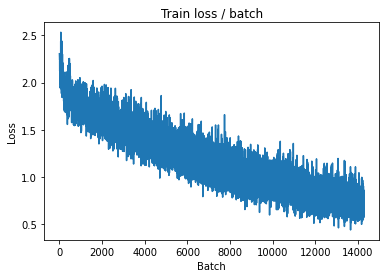


===============> Total time 18s	Avg loss 0.7245	Avg Prec@1 75.04 %	Avg Prec@5 98.08 %

[EVAL Batch 000/079]	Time 0.202s (0.202s)	Loss 0.6928 (0.6928)	Prec@1  74.2 ( 74.2)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.7750	Avg Prec@1 74.69 %	Avg Prec@5 97.65 %



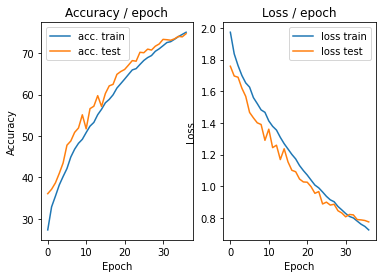

=== EPOCH 38 =====

[TRAIN Batch 000/391]	Time 0.222s (0.222s)	Loss 0.8021 (0.8021)	Prec@1  72.7 ( 72.7)	Prec@5  96.1 ( 96.1)


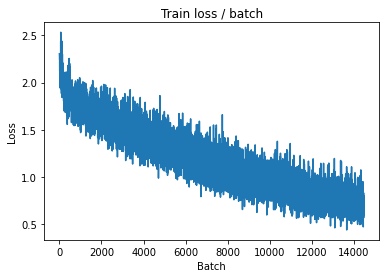

[TRAIN Batch 200/391]	Time 0.056s (0.047s)	Loss 0.9071 (0.7203)	Prec@1  68.0 ( 74.9)	Prec@5  96.9 ( 98.1)


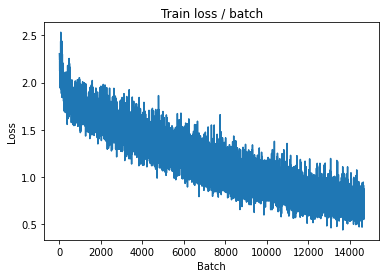


===============> Total time 18s	Avg loss 0.7180	Avg Prec@1 75.18 %	Avg Prec@5 98.03 %

[EVAL Batch 000/079]	Time 0.192s (0.192s)	Loss 0.7026 (0.7026)	Prec@1  75.0 ( 75.0)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.7560	Avg Prec@1 75.72 %	Avg Prec@5 97.86 %



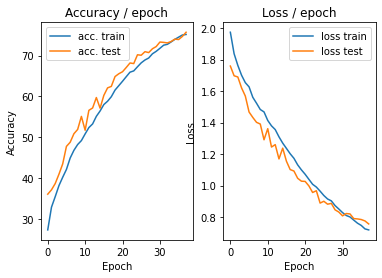

=== EPOCH 39 =====

[TRAIN Batch 000/391]	Time 0.260s (0.260s)	Loss 0.6905 (0.6905)	Prec@1  79.7 ( 79.7)	Prec@5  98.4 ( 98.4)


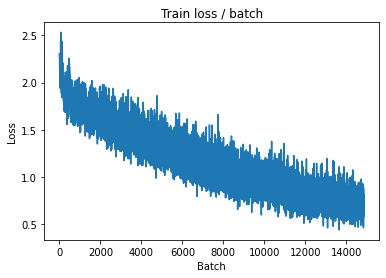

[TRAIN Batch 200/391]	Time 0.060s (0.048s)	Loss 0.6273 (0.7051)	Prec@1  77.3 ( 75.9)	Prec@5  99.2 ( 98.1)


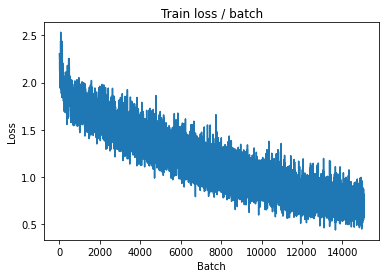


===============> Total time 18s	Avg loss 0.6985	Avg Prec@1 76.16 %	Avg Prec@5 98.03 %

[EVAL Batch 000/079]	Time 0.205s (0.205s)	Loss 0.6436 (0.6436)	Prec@1  80.5 ( 80.5)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.7587	Avg Prec@1 75.30 %	Avg Prec@5 97.80 %



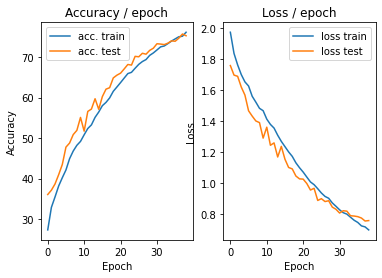

=== EPOCH 40 =====

[TRAIN Batch 000/391]	Time 0.251s (0.251s)	Loss 0.7566 (0.7566)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)


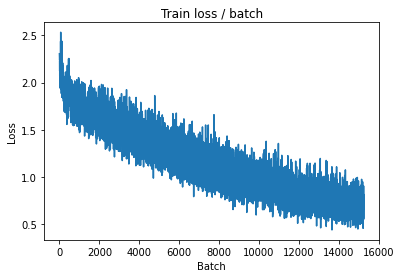

[TRAIN Batch 200/391]	Time 0.023s (0.049s)	Loss 0.7886 (0.6908)	Prec@1  73.4 ( 76.2)	Prec@5  99.2 ( 98.2)


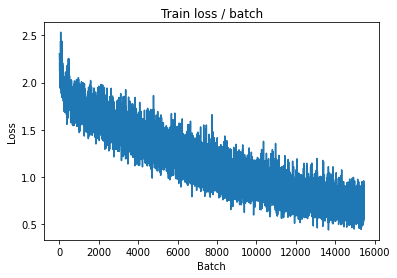


===============> Total time 18s	Avg loss 0.6894	Avg Prec@1 76.36 %	Avg Prec@5 98.24 %

[EVAL Batch 000/079]	Time 0.201s (0.201s)	Loss 0.7003 (0.7003)	Prec@1  78.9 ( 78.9)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 0.7398	Avg Prec@1 75.98 %	Avg Prec@5 97.90 %



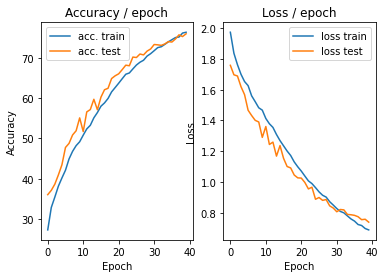

=== EPOCH 41 =====

[TRAIN Batch 000/391]	Time 0.227s (0.227s)	Loss 0.8056 (0.8056)	Prec@1  75.0 ( 75.0)	Prec@5  98.4 ( 98.4)


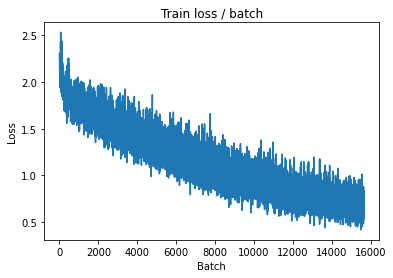

[TRAIN Batch 200/391]	Time 0.024s (0.048s)	Loss 0.6577 (0.6700)	Prec@1  77.3 ( 77.0)	Prec@5  96.9 ( 98.3)


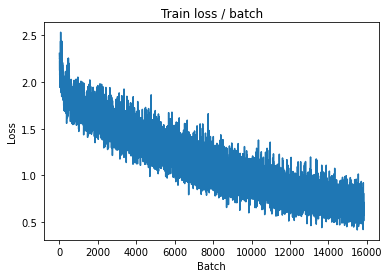


===============> Total time 18s	Avg loss 0.6727	Avg Prec@1 76.90 %	Avg Prec@5 98.26 %

[EVAL Batch 000/079]	Time 0.203s (0.203s)	Loss 0.6454 (0.6454)	Prec@1  78.9 ( 78.9)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.7472	Avg Prec@1 75.68 %	Avg Prec@5 97.93 %



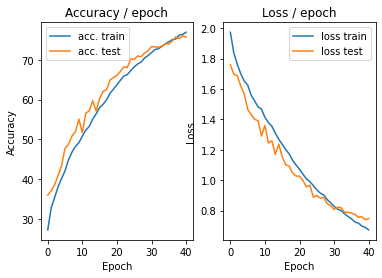

=== EPOCH 42 =====

[TRAIN Batch 000/391]	Time 0.255s (0.255s)	Loss 0.7936 (0.7936)	Prec@1  74.2 ( 74.2)	Prec@5  96.9 ( 96.9)


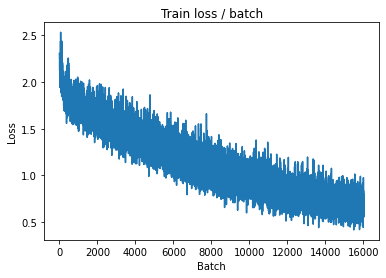

[TRAIN Batch 200/391]	Time 0.028s (0.047s)	Loss 0.4265 (0.6638)	Prec@1  82.8 ( 77.1)	Prec@5 100.0 ( 98.4)


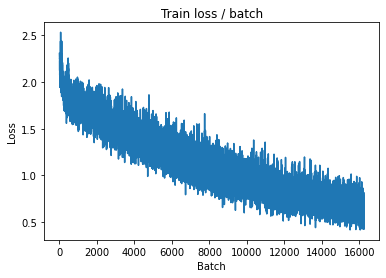


===============> Total time 18s	Avg loss 0.6647	Avg Prec@1 77.00 %	Avg Prec@5 98.34 %

[EVAL Batch 000/079]	Time 0.189s (0.189s)	Loss 0.7063 (0.7063)	Prec@1  79.7 ( 79.7)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.7400	Avg Prec@1 76.08 %	Avg Prec@5 97.88 %



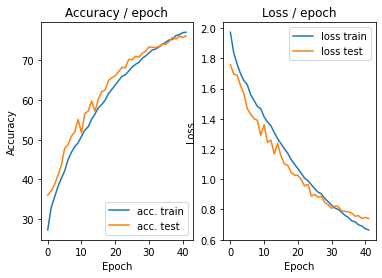

=== EPOCH 43 =====

[TRAIN Batch 000/391]	Time 0.239s (0.239s)	Loss 0.5224 (0.5224)	Prec@1  84.4 ( 84.4)	Prec@5  98.4 ( 98.4)


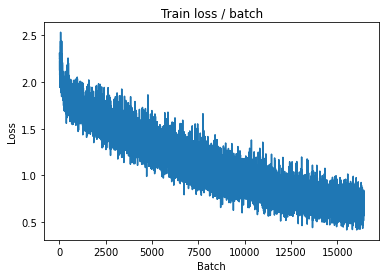

[TRAIN Batch 200/391]	Time 0.040s (0.047s)	Loss 0.8819 (0.6584)	Prec@1  71.9 ( 77.4)	Prec@5  96.9 ( 98.3)


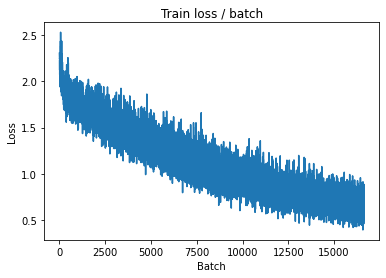


===============> Total time 18s	Avg loss 0.6574	Avg Prec@1 77.36 %	Avg Prec@5 98.38 %

[EVAL Batch 000/079]	Time 0.209s (0.209s)	Loss 0.6554 (0.6554)	Prec@1  77.3 ( 77.3)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.7392	Avg Prec@1 75.85 %	Avg Prec@5 97.85 %



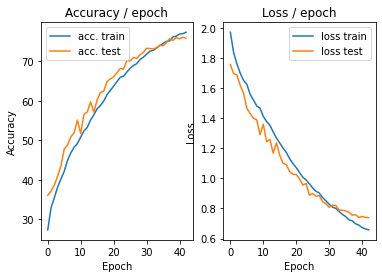

=== EPOCH 44 =====

[TRAIN Batch 000/391]	Time 0.236s (0.236s)	Loss 0.7084 (0.7084)	Prec@1  73.4 ( 73.4)	Prec@5  98.4 ( 98.4)


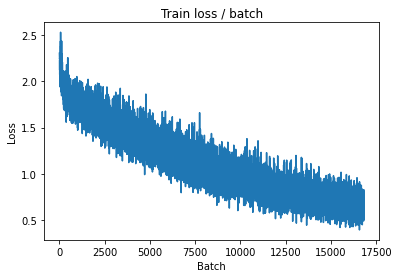

[TRAIN Batch 200/391]	Time 0.027s (0.048s)	Loss 0.6495 (0.6461)	Prec@1  73.4 ( 77.5)	Prec@5 100.0 ( 98.4)


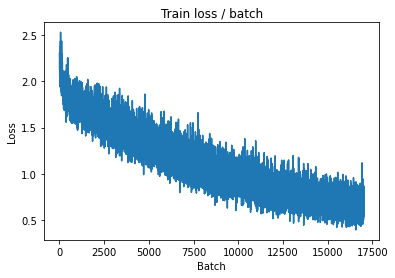


===============> Total time 18s	Avg loss 0.6428	Avg Prec@1 77.86 %	Avg Prec@5 98.47 %

[EVAL Batch 000/079]	Time 0.210s (0.210s)	Loss 0.6865 (0.6865)	Prec@1  75.0 ( 75.0)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.7128	Avg Prec@1 76.29 %	Avg Prec@5 98.00 %



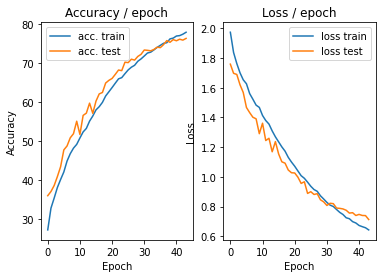

=== EPOCH 45 =====

[TRAIN Batch 000/391]	Time 0.249s (0.249s)	Loss 0.5861 (0.5861)	Prec@1  78.9 ( 78.9)	Prec@5 100.0 (100.0)


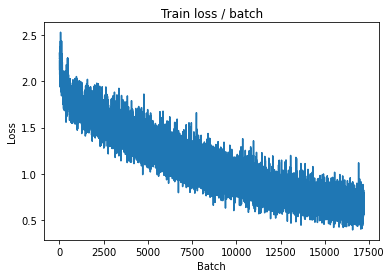

[TRAIN Batch 200/391]	Time 0.071s (0.049s)	Loss 0.5675 (0.6333)	Prec@1  79.7 ( 78.4)	Prec@5 100.0 ( 98.4)


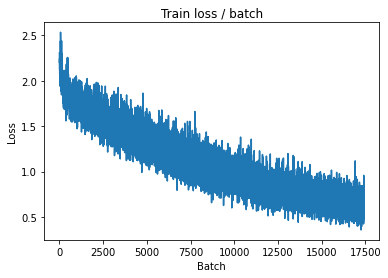


===============> Total time 18s	Avg loss 0.6349	Avg Prec@1 78.12 %	Avg Prec@5 98.46 %

[EVAL Batch 000/079]	Time 0.185s (0.185s)	Loss 0.6913 (0.6913)	Prec@1  78.9 ( 78.9)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.7218	Avg Prec@1 76.46 %	Avg Prec@5 98.09 %



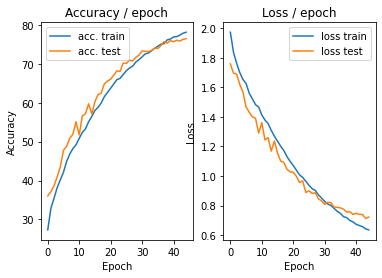

=== EPOCH 46 =====

[TRAIN Batch 000/391]	Time 0.249s (0.249s)	Loss 0.6435 (0.6435)	Prec@1  75.8 ( 75.8)	Prec@5  96.1 ( 96.1)


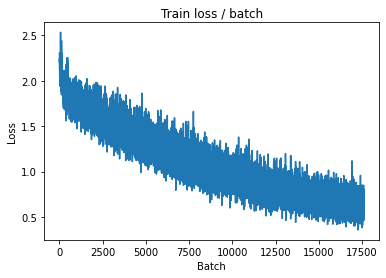

[TRAIN Batch 200/391]	Time 0.019s (0.046s)	Loss 0.6364 (0.6162)	Prec@1  75.0 ( 78.5)	Prec@5  99.2 ( 98.7)


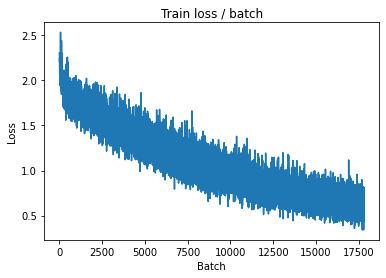


===============> Total time 18s	Avg loss 0.6241	Avg Prec@1 78.30 %	Avg Prec@5 98.58 %

[EVAL Batch 000/079]	Time 0.191s (0.191s)	Loss 0.7029 (0.7029)	Prec@1  79.7 ( 79.7)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.7170	Avg Prec@1 76.85 %	Avg Prec@5 98.24 %



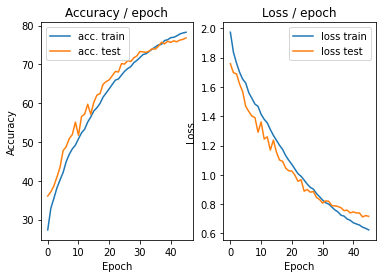

=== EPOCH 47 =====

[TRAIN Batch 000/391]	Time 0.242s (0.242s)	Loss 0.7218 (0.7218)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)


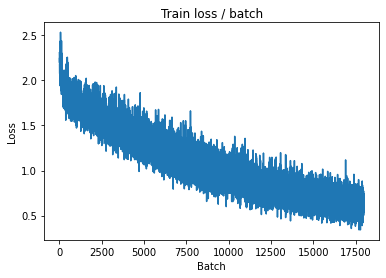

[TRAIN Batch 200/391]	Time 0.031s (0.047s)	Loss 0.6663 (0.6219)	Prec@1  75.8 ( 78.4)	Prec@5  96.9 ( 98.5)


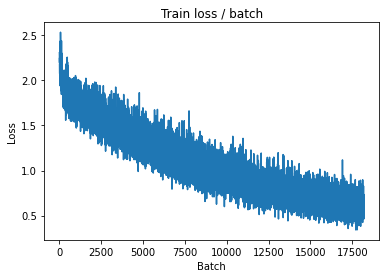


===============> Total time 18s	Avg loss 0.6212	Avg Prec@1 78.42 %	Avg Prec@5 98.52 %

[EVAL Batch 000/079]	Time 0.193s (0.193s)	Loss 0.6182 (0.6182)	Prec@1  81.2 ( 81.2)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.7099	Avg Prec@1 76.93 %	Avg Prec@5 97.97 %



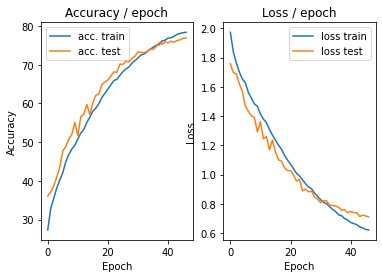

=== EPOCH 48 =====

[TRAIN Batch 000/391]	Time 0.212s (0.212s)	Loss 0.7863 (0.7863)	Prec@1  74.2 ( 74.2)	Prec@5  96.9 ( 96.9)


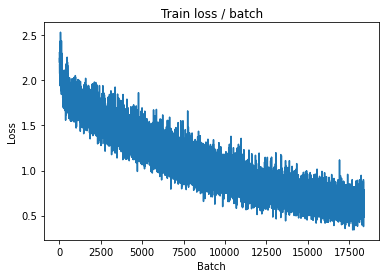

[TRAIN Batch 200/391]	Time 0.033s (0.049s)	Loss 0.6619 (0.6066)	Prec@1  76.6 ( 79.1)	Prec@5  99.2 ( 98.7)


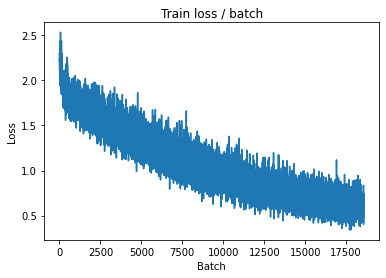


===============> Total time 18s	Avg loss 0.6117	Avg Prec@1 78.90 %	Avg Prec@5 98.66 %

[EVAL Batch 000/079]	Time 0.189s (0.189s)	Loss 0.6000 (0.6000)	Prec@1  80.5 ( 80.5)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.6930	Avg Prec@1 77.29 %	Avg Prec@5 98.08 %



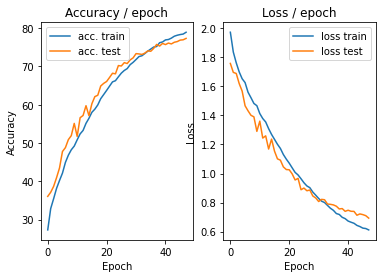

=== EPOCH 49 =====

[TRAIN Batch 000/391]	Time 0.224s (0.224s)	Loss 0.5640 (0.5640)	Prec@1  80.5 ( 80.5)	Prec@5  98.4 ( 98.4)


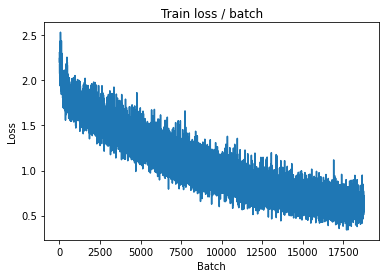

[TRAIN Batch 200/391]	Time 0.038s (0.046s)	Loss 0.5891 (0.5927)	Prec@1  80.5 ( 79.3)	Prec@5  98.4 ( 98.7)


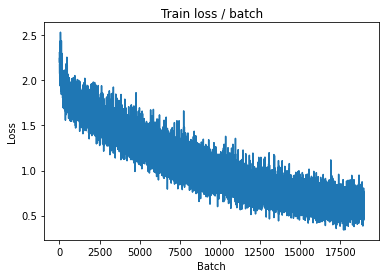


===============> Total time 18s	Avg loss 0.5970	Avg Prec@1 79.09 %	Avg Prec@5 98.58 %

[EVAL Batch 000/079]	Time 0.192s (0.192s)	Loss 0.6119 (0.6119)	Prec@1  81.2 ( 81.2)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.6954	Avg Prec@1 77.28 %	Avg Prec@5 98.13 %



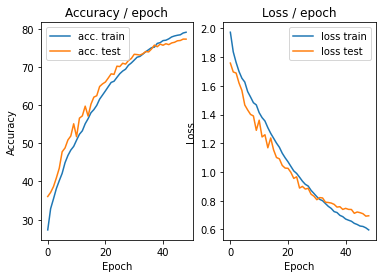

=== EPOCH 50 =====

[TRAIN Batch 000/391]	Time 0.229s (0.229s)	Loss 0.4877 (0.4877)	Prec@1  85.2 ( 85.2)	Prec@5 100.0 (100.0)


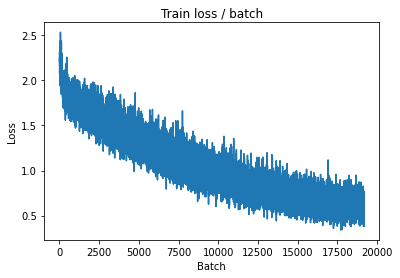

[TRAIN Batch 200/391]	Time 0.024s (0.046s)	Loss 0.6448 (0.5796)	Prec@1  75.8 ( 79.9)	Prec@5  97.7 ( 98.8)


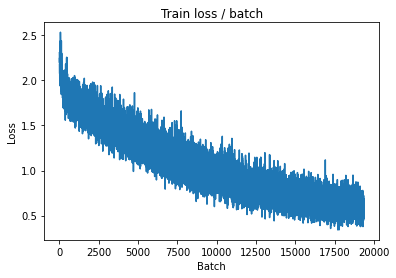


===============> Total time 17s	Avg loss 0.5878	Avg Prec@1 79.59 %	Avg Prec@5 98.73 %

[EVAL Batch 000/079]	Time 0.188s (0.188s)	Loss 0.5564 (0.5564)	Prec@1  82.8 ( 82.8)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6830	Avg Prec@1 77.57 %	Avg Prec@5 98.11 %



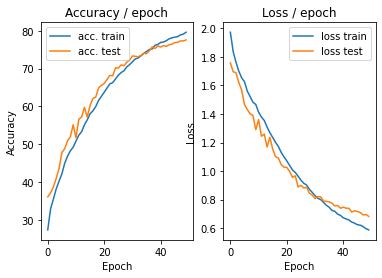

=== EPOCH 51 =====

[TRAIN Batch 000/391]	Time 0.281s (0.281s)	Loss 0.5319 (0.5319)	Prec@1  78.9 ( 78.9)	Prec@5 100.0 (100.0)


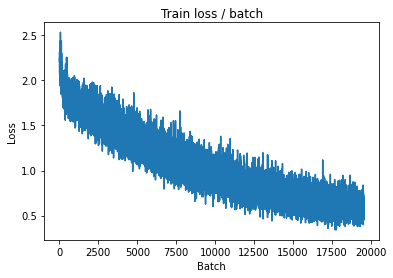

[TRAIN Batch 200/391]	Time 0.034s (0.047s)	Loss 0.6149 (0.5869)	Prec@1  78.9 ( 79.8)	Prec@5  97.7 ( 98.7)


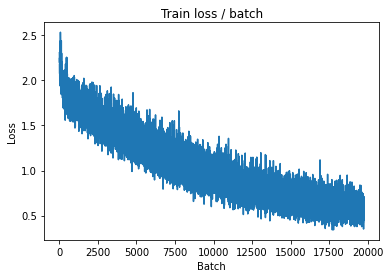


===============> Total time 18s	Avg loss 0.5817	Avg Prec@1 79.79 %	Avg Prec@5 98.72 %

[EVAL Batch 000/079]	Time 0.205s (0.205s)	Loss 0.6709 (0.6709)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6860	Avg Prec@1 77.64 %	Avg Prec@5 98.17 %



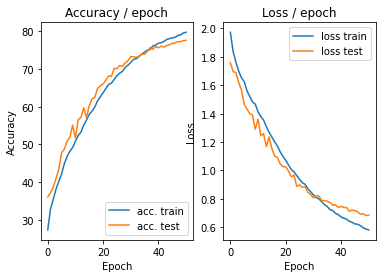

In [16]:
main(128, 0.1, epochs=51, cuda=True)

## **CIFAR-10 :  Batch Normalization**

In [16]:
#Classe ConvNet avec l'architecture donnée
class ConvNet2(nn.Module):
    """
    This class defines the structure of the neural network
    """

    def __init__(self):
        super(ConvNet2, self).__init__()
        # We first define the convolution and pooling layers as a features extractor
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, (5, 5), stride=1, padding=2),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(32, 64, (5, 5), stride=1, padding=2),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(64, 64, (5, 5), stride=1, padding=2),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0, ceil_mode=True)
        )
        # We then define fully connected layers as a classifier
        self.classifier = nn.Sequential(
            nn.Linear(1024, 1000), #64 * 4 * 4 (4 pcq 32 divisé par 8)
            nn.ReLU(),
            nn.Dropout(),
            nn.Linear(1000, 10),
            #nn.Softmax()
            # Reminder: The softmax is included in the loss, do not put it here
        )

    # Method called when we apply the network to an input batch
    def forward(self, input):
        bsize = input.size(0) # batch size
        output = self.features(input) # output of the conv layers
        output = output.view(bsize, -1) # we flatten the 2D feature maps into one 1D vector for each input
        output = self.classifier(output) # we compute the output of the fc layers
        return output

Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.208s (0.208s)	Loss 2.3482 (2.3482)	Prec@1   8.6 (  8.6)	Prec@5  49.2 ( 49.2)


<Figure size 432x288 with 0 Axes>

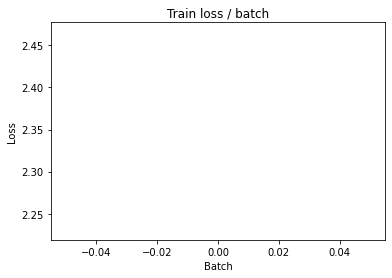

[TRAIN Batch 200/391]	Time 0.073s (0.049s)	Loss 1.5015 (1.7683)	Prec@1  46.1 ( 34.9)	Prec@5  91.4 ( 86.5)


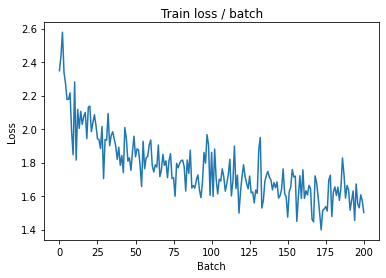


===============> Total time 18s	Avg loss 1.6020	Avg Prec@1 41.42 %	Avg Prec@5 89.57 %

[EVAL Batch 000/079]	Time 0.179s (0.179s)	Loss 1.3365 (1.3365)	Prec@1  57.0 ( 57.0)	Prec@5  91.4 ( 91.4)

===============> Total time 2s	Avg loss 1.4172	Avg Prec@1 49.88 %	Avg Prec@5 93.18 %



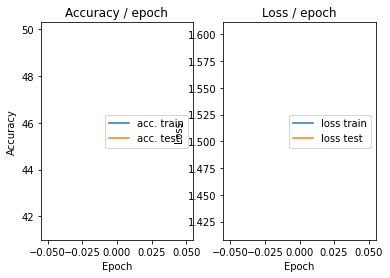

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.209s (0.209s)	Loss 1.2763 (1.2763)	Prec@1  52.3 ( 52.3)	Prec@5  94.5 ( 94.5)


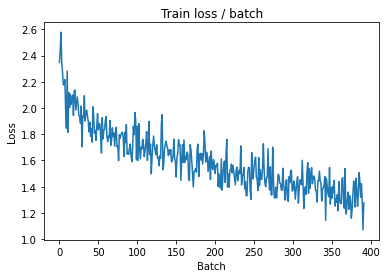

[TRAIN Batch 200/391]	Time 0.068s (0.048s)	Loss 1.2526 (1.2316)	Prec@1  54.7 ( 56.2)	Prec@5  93.8 ( 94.9)


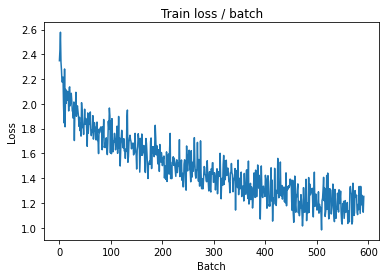


===============> Total time 18s	Avg loss 1.1710	Avg Prec@1 58.71 %	Avg Prec@5 95.30 %

[EVAL Batch 000/079]	Time 0.175s (0.175s)	Loss 1.0617 (1.0617)	Prec@1  67.2 ( 67.2)	Prec@5  93.8 ( 93.8)

===============> Total time 2s	Avg loss 1.0317	Avg Prec@1 63.32 %	Avg Prec@5 95.46 %



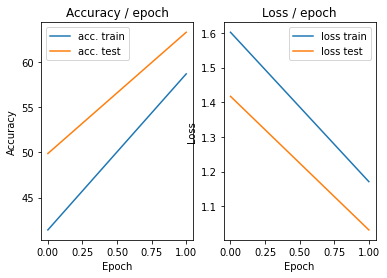

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.205s (0.205s)	Loss 1.0268 (1.0268)	Prec@1  60.2 ( 60.2)	Prec@5  96.1 ( 96.1)


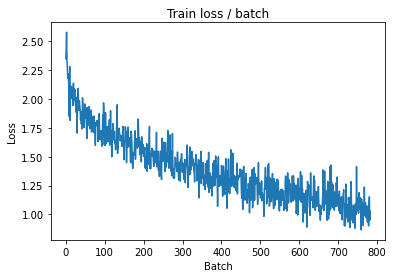

[TRAIN Batch 200/391]	Time 0.029s (0.048s)	Loss 1.0137 (1.0045)	Prec@1  67.2 ( 65.0)	Prec@5  96.9 ( 96.4)


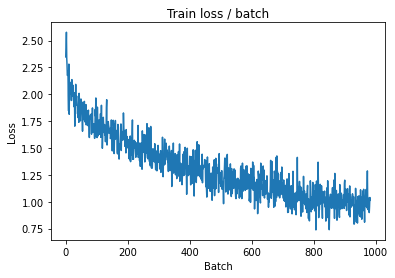


===============> Total time 18s	Avg loss 0.9767	Avg Prec@1 66.08 %	Avg Prec@5 96.66 %

[EVAL Batch 000/079]	Time 0.191s (0.191s)	Loss 0.8664 (0.8664)	Prec@1  70.3 ( 70.3)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.8988	Avg Prec@1 69.12 %	Avg Prec@5 97.19 %



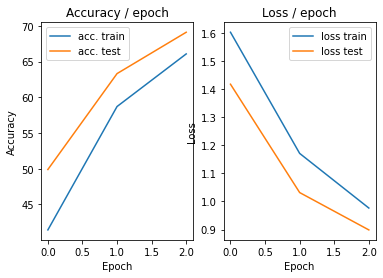

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.242s (0.242s)	Loss 0.9466 (0.9466)	Prec@1  68.8 ( 68.8)	Prec@5  98.4 ( 98.4)


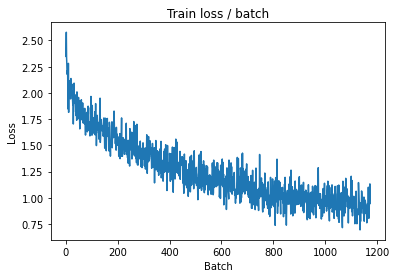

[TRAIN Batch 200/391]	Time 0.028s (0.048s)	Loss 0.7350 (0.8848)	Prec@1  73.4 ( 69.5)	Prec@5  96.9 ( 97.2)


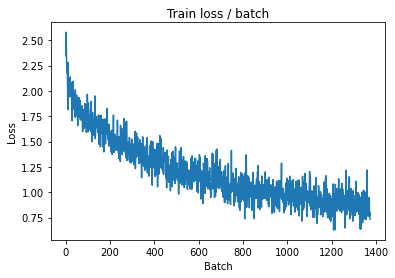


===============> Total time 18s	Avg loss 0.8751	Avg Prec@1 69.98 %	Avg Prec@5 97.31 %

[EVAL Batch 000/079]	Time 0.177s (0.177s)	Loss 0.9124 (0.9124)	Prec@1  64.1 ( 64.1)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 0.8206	Avg Prec@1 70.56 %	Avg Prec@5 97.79 %



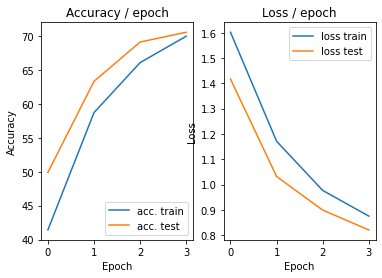

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.195s (0.195s)	Loss 0.8936 (0.8936)	Prec@1  68.8 ( 68.8)	Prec@5  96.9 ( 96.9)


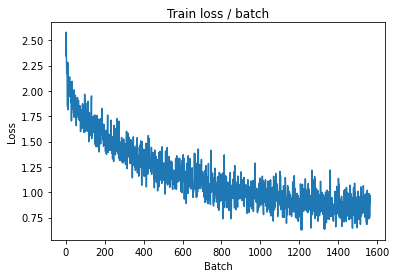

[TRAIN Batch 200/391]	Time 0.081s (0.049s)	Loss 0.7107 (0.8036)	Prec@1  75.8 ( 72.4)	Prec@5  99.2 ( 97.7)


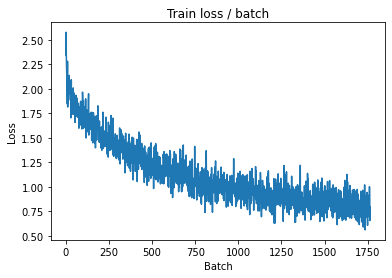


===============> Total time 18s	Avg loss 0.7976	Avg Prec@1 72.47 %	Avg Prec@5 97.71 %

[EVAL Batch 000/079]	Time 0.181s (0.181s)	Loss 0.6602 (0.6602)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.7517	Avg Prec@1 73.84 %	Avg Prec@5 97.95 %



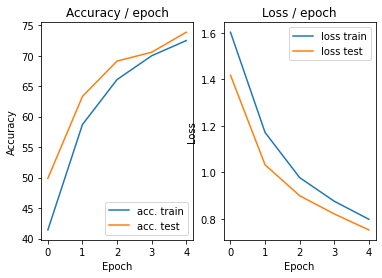

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.214s (0.214s)	Loss 0.6473 (0.6473)	Prec@1  75.8 ( 75.8)	Prec@5  98.4 ( 98.4)


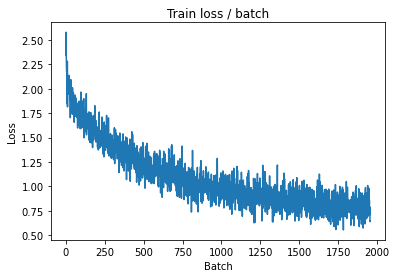

[TRAIN Batch 200/391]	Time 0.060s (0.049s)	Loss 0.9336 (0.7466)	Prec@1  67.2 ( 74.5)	Prec@5  94.5 ( 98.0)


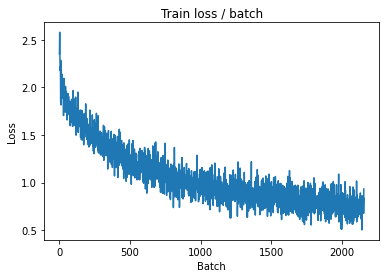


===============> Total time 18s	Avg loss 0.7333	Avg Prec@1 74.82 %	Avg Prec@5 98.10 %

[EVAL Batch 000/079]	Time 0.192s (0.192s)	Loss 0.7183 (0.7183)	Prec@1  75.0 ( 75.0)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.7510	Avg Prec@1 74.65 %	Avg Prec@5 98.10 %



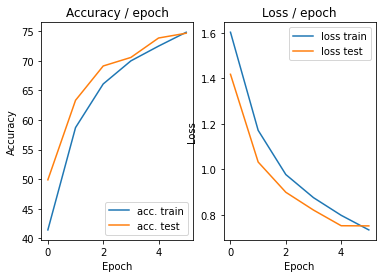

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.226s (0.226s)	Loss 0.7317 (0.7317)	Prec@1  74.2 ( 74.2)	Prec@5  98.4 ( 98.4)


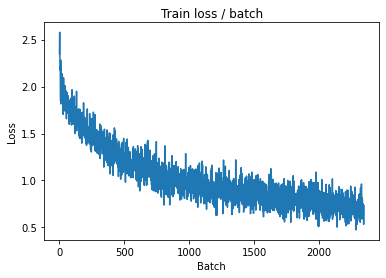

[TRAIN Batch 200/391]	Time 0.077s (0.048s)	Loss 0.6470 (0.6906)	Prec@1  77.3 ( 76.2)	Prec@5  97.7 ( 98.5)


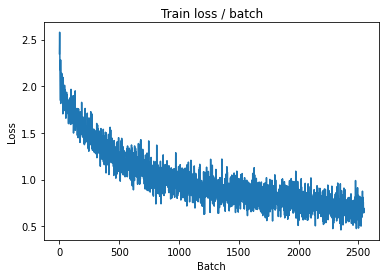


===============> Total time 18s	Avg loss 0.6899	Avg Prec@1 76.31 %	Avg Prec@5 98.41 %

[EVAL Batch 000/079]	Time 0.182s (0.182s)	Loss 0.6217 (0.6217)	Prec@1  77.3 ( 77.3)	Prec@5 100.0 (100.0)

===============> Total time 2s	Avg loss 0.6955	Avg Prec@1 76.11 %	Avg Prec@5 98.28 %



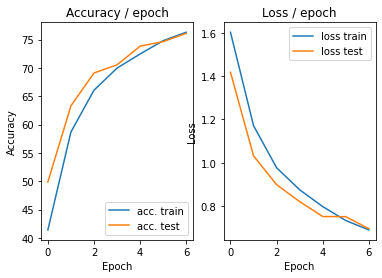

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.205s (0.205s)	Loss 0.7273 (0.7273)	Prec@1  76.6 ( 76.6)	Prec@5  98.4 ( 98.4)


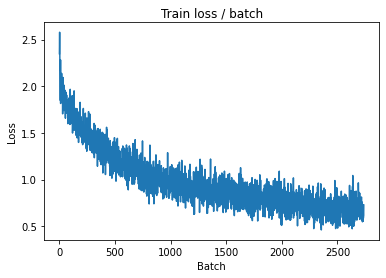

[TRAIN Batch 200/391]	Time 0.052s (0.050s)	Loss 0.5704 (0.6486)	Prec@1  81.2 ( 77.8)	Prec@5  96.9 ( 98.6)


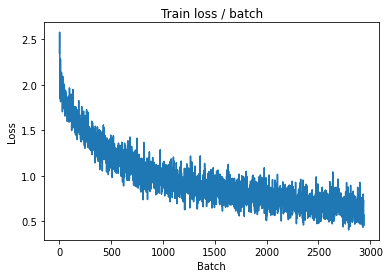


===============> Total time 18s	Avg loss 0.6472	Avg Prec@1 77.82 %	Avg Prec@5 98.50 %

[EVAL Batch 000/079]	Time 0.181s (0.181s)	Loss 0.5662 (0.5662)	Prec@1  82.8 ( 82.8)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.6700	Avg Prec@1 77.28 %	Avg Prec@5 98.27 %



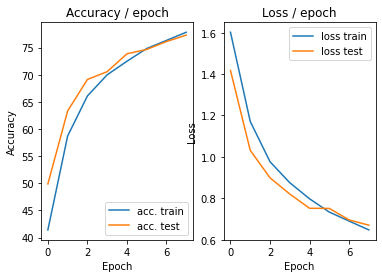

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.220s (0.220s)	Loss 0.6755 (0.6755)	Prec@1  73.4 ( 73.4)	Prec@5  98.4 ( 98.4)


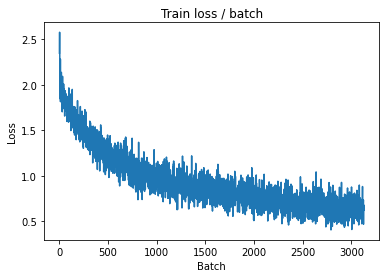

[TRAIN Batch 200/391]	Time 0.027s (0.049s)	Loss 0.5299 (0.6203)	Prec@1  78.1 ( 78.7)	Prec@5 100.0 ( 98.6)


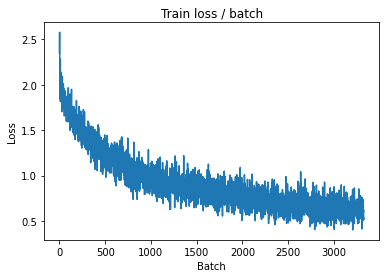


===============> Total time 18s	Avg loss 0.6217	Avg Prec@1 78.49 %	Avg Prec@5 98.66 %

[EVAL Batch 000/079]	Time 0.179s (0.179s)	Loss 0.5298 (0.5298)	Prec@1  85.2 ( 85.2)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.6130	Avg Prec@1 79.35 %	Avg Prec@5 98.82 %



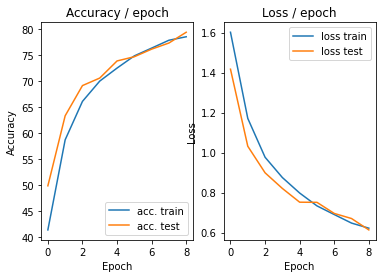

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.205s (0.205s)	Loss 0.5688 (0.5688)	Prec@1  81.2 ( 81.2)	Prec@5  99.2 ( 99.2)


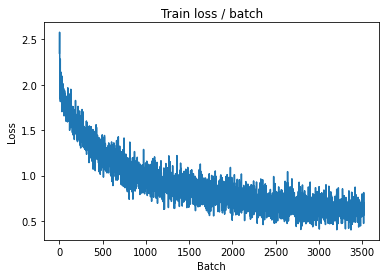

[TRAIN Batch 200/391]	Time 0.017s (0.048s)	Loss 0.4283 (0.5847)	Prec@1  87.5 ( 79.9)	Prec@5  99.2 ( 98.8)


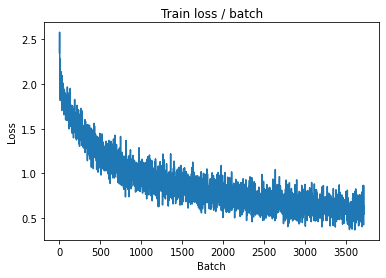


===============> Total time 18s	Avg loss 0.5939	Avg Prec@1 79.62 %	Avg Prec@5 98.78 %

[EVAL Batch 000/079]	Time 0.188s (0.188s)	Loss 0.5456 (0.5456)	Prec@1  84.4 ( 84.4)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5965	Avg Prec@1 79.78 %	Avg Prec@5 98.49 %



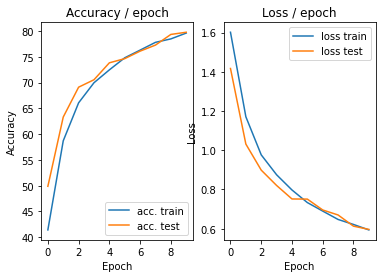

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.224s (0.224s)	Loss 0.6921 (0.6921)	Prec@1  73.4 ( 73.4)	Prec@5  99.2 ( 99.2)


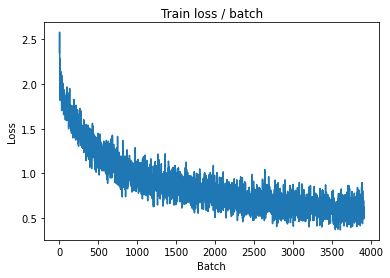

[TRAIN Batch 200/391]	Time 0.036s (0.048s)	Loss 0.6866 (0.5572)	Prec@1  80.5 ( 80.8)	Prec@5  99.2 ( 99.0)


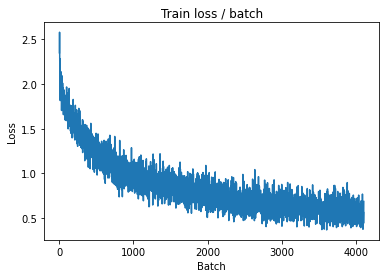


===============> Total time 18s	Avg loss 0.5628	Avg Prec@1 80.44 %	Avg Prec@5 98.98 %

[EVAL Batch 000/079]	Time 0.189s (0.189s)	Loss 0.5424 (0.5424)	Prec@1  84.4 ( 84.4)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5854	Avg Prec@1 80.24 %	Avg Prec@5 98.83 %



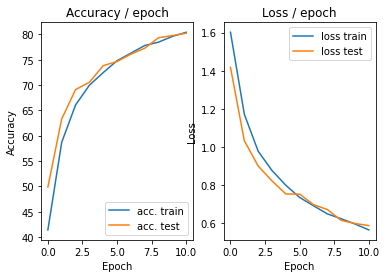

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.196s (0.196s)	Loss 0.6482 (0.6482)	Prec@1  81.2 ( 81.2)	Prec@5 100.0 (100.0)


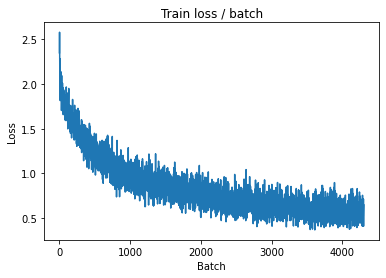

[TRAIN Batch 200/391]	Time 0.026s (0.049s)	Loss 0.6364 (0.5341)	Prec@1  78.1 ( 81.5)	Prec@5  99.2 ( 99.1)


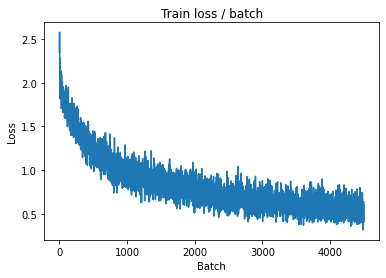


===============> Total time 18s	Avg loss 0.5415	Avg Prec@1 81.27 %	Avg Prec@5 99.06 %

[EVAL Batch 000/079]	Time 0.175s (0.175s)	Loss 0.5114 (0.5114)	Prec@1  83.6 ( 83.6)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.5776	Avg Prec@1 80.33 %	Avg Prec@5 98.82 %



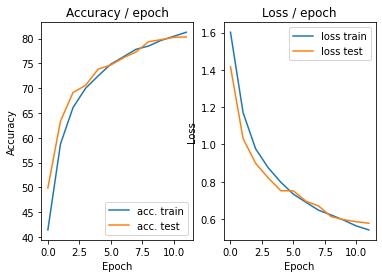

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.228s (0.228s)	Loss 0.7072 (0.7072)	Prec@1  75.0 ( 75.0)	Prec@5 100.0 (100.0)


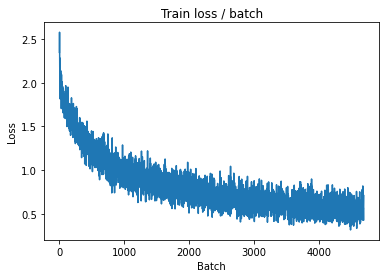

[TRAIN Batch 200/391]	Time 0.072s (0.048s)	Loss 0.6128 (0.5241)	Prec@1  76.6 ( 81.9)	Prec@5  99.2 ( 99.1)


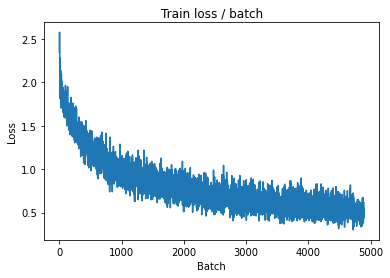


===============> Total time 18s	Avg loss 0.5228	Avg Prec@1 81.89 %	Avg Prec@5 99.06 %

[EVAL Batch 000/079]	Time 0.168s (0.168s)	Loss 0.4937 (0.4937)	Prec@1  84.4 ( 84.4)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.5783	Avg Prec@1 80.80 %	Avg Prec@5 98.70 %



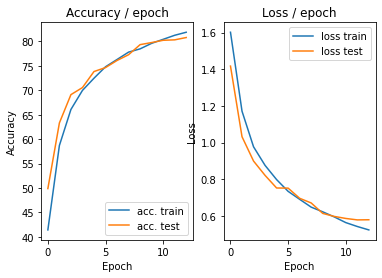

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.246s (0.246s)	Loss 0.4987 (0.4987)	Prec@1  87.5 ( 87.5)	Prec@5 100.0 (100.0)


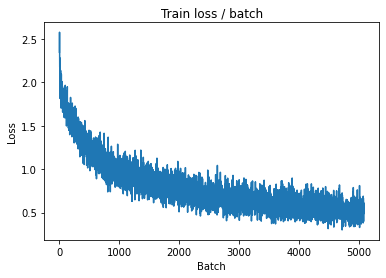

[TRAIN Batch 200/391]	Time 0.021s (0.048s)	Loss 0.5167 (0.5043)	Prec@1  83.6 ( 82.5)	Prec@5 100.0 ( 99.1)


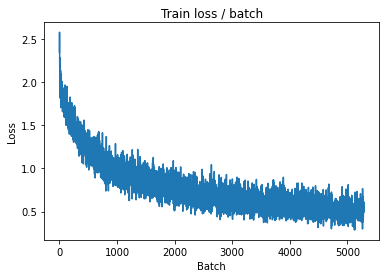


===============> Total time 18s	Avg loss 0.5015	Avg Prec@1 82.65 %	Avg Prec@5 99.16 %

[EVAL Batch 000/079]	Time 0.182s (0.182s)	Loss 0.5401 (0.5401)	Prec@1  85.9 ( 85.9)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5558	Avg Prec@1 80.88 %	Avg Prec@5 98.92 %



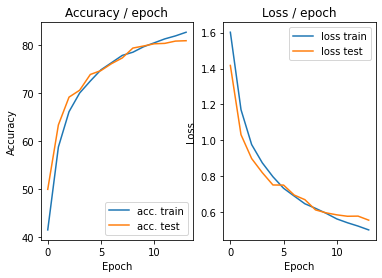

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.226s (0.226s)	Loss 0.4038 (0.4038)	Prec@1  85.2 ( 85.2)	Prec@5  99.2 ( 99.2)


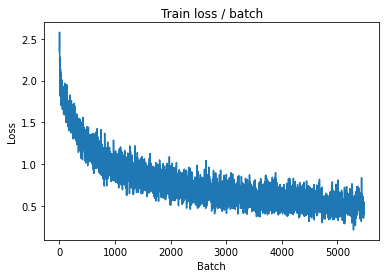

[TRAIN Batch 200/391]	Time 0.080s (0.048s)	Loss 0.4803 (0.4675)	Prec@1  84.4 ( 83.4)	Prec@5  99.2 ( 99.3)


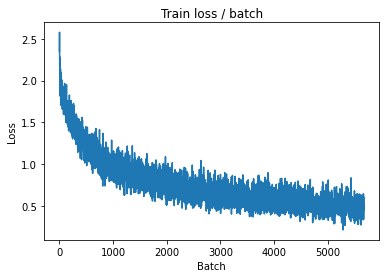


===============> Total time 18s	Avg loss 0.4776	Avg Prec@1 83.23 %	Avg Prec@5 99.27 %

[EVAL Batch 000/079]	Time 0.185s (0.185s)	Loss 0.5065 (0.5065)	Prec@1  85.9 ( 85.9)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5371	Avg Prec@1 81.91 %	Avg Prec@5 98.98 %



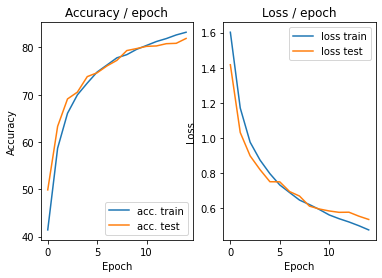

=== EPOCH 16 =====

[TRAIN Batch 000/391]	Time 0.238s (0.238s)	Loss 0.5206 (0.5206)	Prec@1  84.4 ( 84.4)	Prec@5  99.2 ( 99.2)


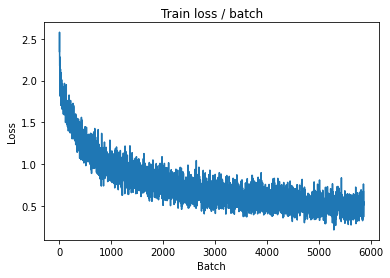

[TRAIN Batch 200/391]	Time 0.051s (0.050s)	Loss 0.4320 (0.4586)	Prec@1  86.7 ( 83.8)	Prec@5 100.0 ( 99.4)


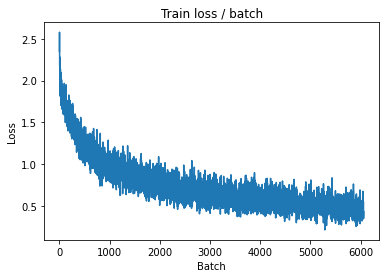


===============> Total time 19s	Avg loss 0.4636	Avg Prec@1 83.66 %	Avg Prec@5 99.31 %

[EVAL Batch 000/079]	Time 0.184s (0.184s)	Loss 0.5280 (0.5280)	Prec@1  83.6 ( 83.6)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5598	Avg Prec@1 82.13 %	Avg Prec@5 99.04 %



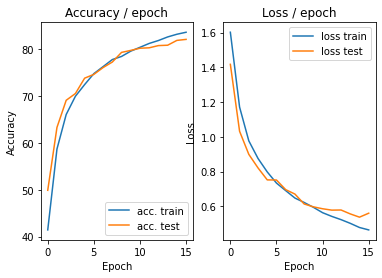

=== EPOCH 17 =====

[TRAIN Batch 000/391]	Time 0.219s (0.219s)	Loss 0.4652 (0.4652)	Prec@1  84.4 ( 84.4)	Prec@5  99.2 ( 99.2)


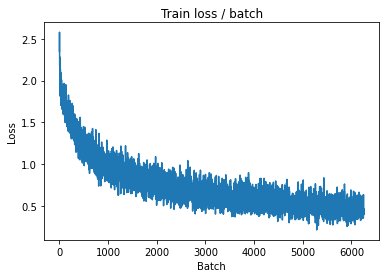

[TRAIN Batch 200/391]	Time 0.021s (0.048s)	Loss 0.5523 (0.4483)	Prec@1  82.0 ( 84.4)	Prec@5  99.2 ( 99.3)


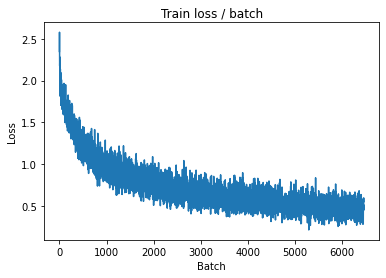


===============> Total time 18s	Avg loss 0.4537	Avg Prec@1 84.15 %	Avg Prec@5 99.30 %

[EVAL Batch 000/079]	Time 0.190s (0.190s)	Loss 0.4717 (0.4717)	Prec@1  82.0 ( 82.0)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5360	Avg Prec@1 82.20 %	Avg Prec@5 99.05 %



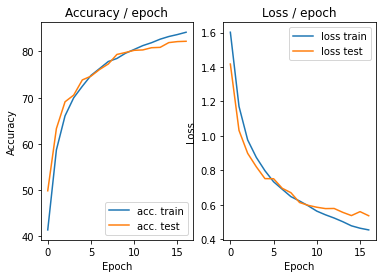

=== EPOCH 18 =====

[TRAIN Batch 000/391]	Time 0.231s (0.231s)	Loss 0.5568 (0.5568)	Prec@1  82.8 ( 82.8)	Prec@5  96.9 ( 96.9)


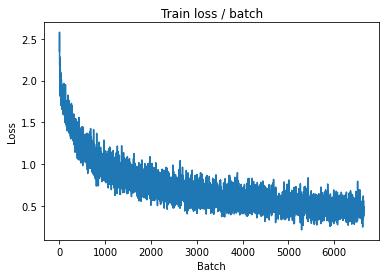

[TRAIN Batch 200/391]	Time 0.039s (0.048s)	Loss 0.4241 (0.4296)	Prec@1  85.2 ( 84.9)	Prec@5  99.2 ( 99.5)


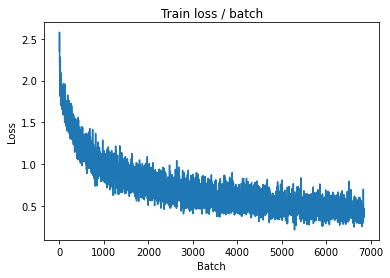


===============> Total time 18s	Avg loss 0.4309	Avg Prec@1 84.95 %	Avg Prec@5 99.43 %

[EVAL Batch 000/079]	Time 0.183s (0.183s)	Loss 0.4668 (0.4668)	Prec@1  86.7 ( 86.7)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5255	Avg Prec@1 82.64 %	Avg Prec@5 99.01 %



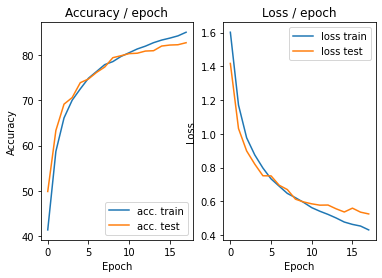

=== EPOCH 19 =====

[TRAIN Batch 000/391]	Time 0.232s (0.232s)	Loss 0.4674 (0.4674)	Prec@1  85.2 ( 85.2)	Prec@5 100.0 (100.0)


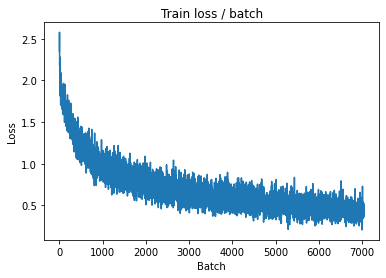

[TRAIN Batch 200/391]	Time 0.060s (0.048s)	Loss 0.4652 (0.4115)	Prec@1  85.2 ( 85.6)	Prec@5  99.2 ( 99.4)


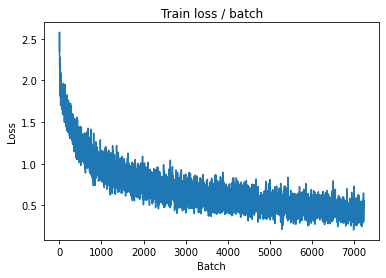


===============> Total time 18s	Avg loss 0.4179	Avg Prec@1 85.50 %	Avg Prec@5 99.39 %

[EVAL Batch 000/079]	Time 0.190s (0.190s)	Loss 0.5022 (0.5022)	Prec@1  85.9 ( 85.9)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.5402	Avg Prec@1 81.81 %	Avg Prec@5 98.90 %



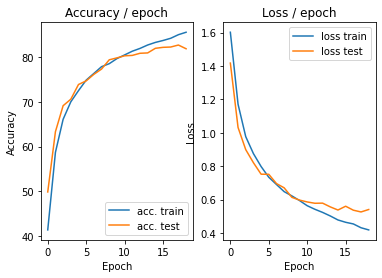

=== EPOCH 20 =====

[TRAIN Batch 000/391]	Time 0.220s (0.220s)	Loss 0.3806 (0.3806)	Prec@1  82.8 ( 82.8)	Prec@5  99.2 ( 99.2)


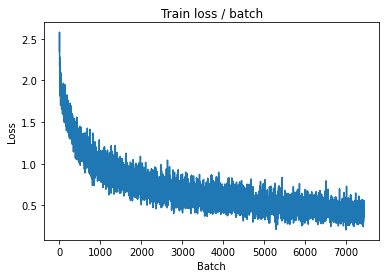

[TRAIN Batch 200/391]	Time 0.020s (0.049s)	Loss 0.3474 (0.4069)	Prec@1  89.8 ( 85.7)	Prec@5 100.0 ( 99.5)


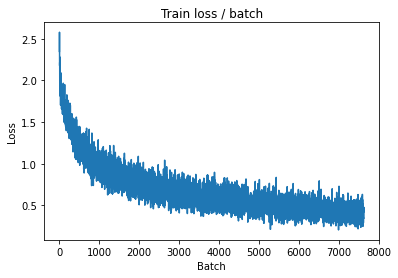


===============> Total time 18s	Avg loss 0.4080	Avg Prec@1 85.70 %	Avg Prec@5 99.47 %

[EVAL Batch 000/079]	Time 0.178s (0.178s)	Loss 0.5420 (0.5420)	Prec@1  84.4 ( 84.4)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5187	Avg Prec@1 83.32 %	Avg Prec@5 98.95 %



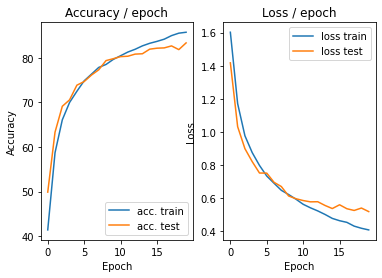

=== EPOCH 21 =====

[TRAIN Batch 000/391]	Time 0.225s (0.225s)	Loss 0.2402 (0.2402)	Prec@1  93.8 ( 93.8)	Prec@5 100.0 (100.0)


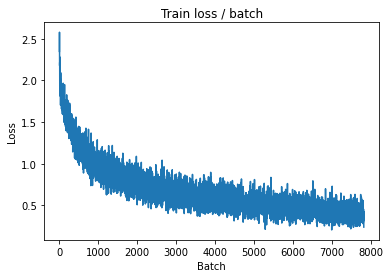

[TRAIN Batch 200/391]	Time 0.068s (0.049s)	Loss 0.5019 (0.3915)	Prec@1  80.5 ( 86.1)	Prec@5 100.0 ( 99.6)


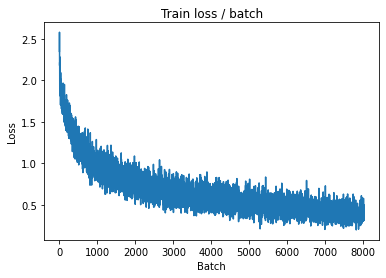


===============> Total time 18s	Avg loss 0.3954	Avg Prec@1 85.97 %	Avg Prec@5 99.54 %

[EVAL Batch 000/079]	Time 0.180s (0.180s)	Loss 0.4683 (0.4683)	Prec@1  87.5 ( 87.5)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.5216	Avg Prec@1 83.14 %	Avg Prec@5 99.04 %



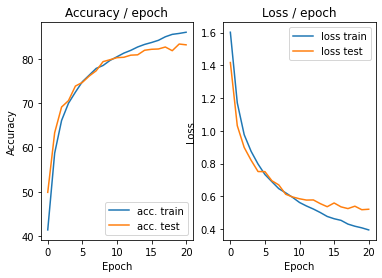

In [17]:
main(128, 0.1, epochs=21, cuda=True)